In [1]:
import pandas as pd

In [2]:
from dateutil import parser

In [14]:
a = pd.date_range("09:30", "16:00", freq="1min").strftime('%H:%M:%S')
print (a[:10])

Index(['09:30:00', '09:31:00', '09:32:00', '09:33:00', '09:34:00', '09:35:00',
       '09:36:00', '09:37:00', '09:38:00', '09:39:00'],
      dtype='object')


In [15]:
ll = []

In [16]:
for t in a:
    ins = parser.parse(t)
    ll.append(ins.time())

In [17]:
ll

[datetime.time(9, 30),
 datetime.time(9, 31),
 datetime.time(9, 32),
 datetime.time(9, 33),
 datetime.time(9, 34),
 datetime.time(9, 35),
 datetime.time(9, 36),
 datetime.time(9, 37),
 datetime.time(9, 38),
 datetime.time(9, 39),
 datetime.time(9, 40),
 datetime.time(9, 41),
 datetime.time(9, 42),
 datetime.time(9, 43),
 datetime.time(9, 44),
 datetime.time(9, 45),
 datetime.time(9, 46),
 datetime.time(9, 47),
 datetime.time(9, 48),
 datetime.time(9, 49),
 datetime.time(9, 50),
 datetime.time(9, 51),
 datetime.time(9, 52),
 datetime.time(9, 53),
 datetime.time(9, 54),
 datetime.time(9, 55),
 datetime.time(9, 56),
 datetime.time(9, 57),
 datetime.time(9, 58),
 datetime.time(9, 59),
 datetime.time(10, 0),
 datetime.time(10, 1),
 datetime.time(10, 2),
 datetime.time(10, 3),
 datetime.time(10, 4),
 datetime.time(10, 5),
 datetime.time(10, 6),
 datetime.time(10, 7),
 datetime.time(10, 8),
 datetime.time(10, 9),
 datetime.time(10, 10),
 datetime.time(10, 11),
 datetime.time(10, 12),
 datetim

In [24]:
set_cash = list(range(20000,100001, 5000))
set_cash

[20000,
 25000,
 30000,
 35000,
 40000,
 45000,
 50000,
 55000,
 60000,
 65000,
 70000,
 75000,
 80000,
 85000,
 90000,
 95000,
 100000]

In [26]:
opening_range = tuple(list(range(1,60)))
# opening_range

In [36]:
import sqlite3, config
import pandas as pd

In [37]:
conn = sqlite3.connect(config.DB_FILE)
cursor = conn.cursor()

In [38]:
cursor.execute("""
    SELECT MAX(id)
    FROM stock
""")

max_id = cursor.fetchone()

In [39]:
max_id

(9482,)

In [40]:
new_id = max_id[0]+1

In [41]:
new_id

9483

In [54]:
from datetime import datetime as dt

In [55]:
import datetime

In [58]:
sdate = dt(2020, 4, 13).date()
edate = dt(2021, 2, 19).date()
pd.date_range(sdate,edate-datetime.timedelta(days=1),freq='d')

DatetimeIndex(['2020-04-13', '2020-04-14', '2020-04-15', '2020-04-16',
               '2020-04-17', '2020-04-18', '2020-04-19', '2020-04-20',
               '2020-04-21', '2020-04-22',
               ...
               '2021-02-09', '2021-02-10', '2021-02-11', '2021-02-12',
               '2021-02-13', '2021-02-14', '2021-02-15', '2021-02-16',
               '2021-02-17', '2021-02-18'],
              dtype='datetime64[ns]', length=312, freq='D')

### Looking into Cerebro for backtesting output

In [2]:
# pip uninstall matplotlib
# !{sys.executable} -m pip uninstall -y matplotlib
# pip install matplotlib==3.1.1

In [1]:
# import sys
# !{sys.executable} -m pip install matplotlib==3.1.1

In [3]:
import config
import backtrader, pandas, sqlite3, matplotlib
from datetime import date, datetime, time, timedelta
import pandas as pd

__OpeningRangeBreakout backtrader.Strategy__

In [6]:
class OpeningRangeBreakout(backtrader.Strategy):
    
    params = dict(
        num_opening_bars=7
    )

    def __init__(self):
        self.opening_range_low = 0
        self.opening_range_high = 0
        self.opening_range = 0
        self.bought_today = False
        self.order = None
    
    def log(self, txt, dt=None):
        if dt is None:
            dt = self.datas[0].datetime.datetime()

        print('%s, %s' % (dt, txt))

    def notify_order(self, order):
        if order.status in [order.Submitted, order.Accepted]:
            # Buy/Sell order submitted/accepted to/by broker - Nothing to do
            return

        # Check if an order has been completed
        if order.status in [order.Completed]:
            order_details = f"{order.executed.price}, Cost: {order.executed.value}, Comm {order.executed.comm}"

            if order.isbuy():
                self.log(f"BUY EXECUTED, Price: {order_details}")
            else:  # Sell
                self.log(f"SELL EXECUTED, Price: {order_details}")
        
        elif order.status in [order.Canceled, order.Margin, order.Rejected]:
            self.log('Order Canceled/Margin/Rejected')

        self.order = None

    def next(self):
        current_bar_datetime = self.data.num2date(self.data.datetime[0])
        previous_bar_datetime = self.data.num2date(self.data.datetime[-1])

        if current_bar_datetime.date() != previous_bar_datetime.date():
            self.opening_range_low = self.data.low[0]
            self.opening_range_high = self.data.high[0]
            self.bought_today = False
        
        opening_range_start_time = time(9, 30, 0)
        dt = datetime.combine(date.today(), opening_range_start_time) + timedelta(minutes=self.p.num_opening_bars)
        opening_range_end_time = dt.time()

        if current_bar_datetime.time() >= opening_range_start_time \
            and current_bar_datetime.time() < opening_range_end_time:           
            self.opening_range_high = max(self.data.high[0], self.opening_range_high)
            self.opening_range_low = min(self.data.low[0], self.opening_range_low)
            self.opening_range = self.opening_range_high - self.opening_range_low
        else:
            if self.order:
                return
            
            if self.position and (self.data.close[0] > (self.opening_range_high + self.opening_range)):
                self.close()
                
            if self.data.close[0] > self.opening_range_high and not self.position and not self.bought_today:
                self.order = self.buy()
                self.bought_today = True

            if self.position and (self.data.close[0] < (self.opening_range_high - self.opening_range)):
                self.order = self.close()

            # liquidate at 2:45pm EST
            if self.position and current_bar_datetime.time() >= time(14, 45, 0):
                self.log("RUNNING OUT OF TIME - LIQUIDATING POSITION")
                self.close()

    def stop(self):
        self.log('(Num Opening Bars %2d) Ending Value %.2f' %
                 (self.params.num_opening_bars, self.broker.getvalue()))

        if self.broker.getvalue() > 130000:
            self.log("*** BIG WINNER ***")

        if self.broker.getvalue() < 70000:
            self.log("*** MAJOR LOSER ***")

== Testing 9395 ==
2020-04-13 16:02:00, BUY EXECUTED, Price: 68.3375, Cost: 23748.26242821085, Comm 0.0
2020-04-13 16:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-13 16:03:00, SELL EXECUTED, Price: 68.3025, Cost: 23748.26242821085, Comm 0.0
2020-04-13 16:03:00, SELL EXECUTED, Price: 68.3025, Cost: -23736.099425686796, Comm 0.0
2020-04-13 16:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-13 16:04:00, BUY EXECUTED, Price: 68.2925, Cost: -23736.099425686796, Comm 0.0
2020-04-13 16:04:00, BUY EXECUTED, Price: 68.2925, Cost: 23732.6242821085, Comm 0.0
2020-04-13 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-13 16:05:00, SELL EXECUTED, Price: 68.2425, Cost: 23732.6242821085, Comm 0.0
2020-04-13 16:05:00, SELL EXECUTED, Price: 68.2425, Cost: -23715.248564216996, Comm 0.0
2020-04-13 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-13 16:06:00, BUY EXECUTED, Price: 68.245, Cost: -23715.248564216996, Comm 0.0
2020-04-13 16:06:00, BUY EXECUTED, P

2020-04-16 19:28:00, SELL EXECUTED, Price: 74.0625, Cost: 24536.168125089178, Comm 0.0
2020-04-16 19:28:00, SELL EXECUTED, Price: 74.0625, Cost: -24536.168125089178, Comm 0.0
2020-04-16 19:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-16 19:29:00, BUY EXECUTED, Price: 74.03, Cost: -24536.168125089178, Comm 0.0
2020-04-16 19:29:00, BUY EXECUTED, Price: 74.03, Cost: 24525.40119899209, Comm 0.0
2020-04-16 19:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-16 19:30:00, SELL EXECUTED, Price: 74.06, Cost: 24525.40119899209, Comm 0.0
2020-04-16 19:30:00, SELL EXECUTED, Price: 74.06, Cost: -24535.339900004787, Comm 0.0
2020-04-16 19:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-16 19:31:00, BUY EXECUTED, Price: 74.045, Cost: -24535.339900004787, Comm 0.0
2020-04-16 19:31:00, BUY EXECUTED, Price: 74.045, Cost: 24530.37054949844, Comm 0.0
2020-04-16 19:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-16 19:32:00, SELL EXECUTED, Price: 74.03, Cost: 24530

2020-04-16 22:00:00, SELL EXECUTED, Price: 73.8, Cost: -24449.2044912281, Comm 0.0
2020-04-16 22:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-16 22:01:00, BUY EXECUTED, Price: 73.8, Cost: -24449.2044912281, Comm 0.0
2020-04-16 22:01:00, BUY EXECUTED, Price: 73.8, Cost: 24449.2044912281, Comm 0.0
2020-04-16 22:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-16 22:02:00, SELL EXECUTED, Price: 73.8, Cost: 24449.2044912281, Comm 0.0
2020-04-16 22:02:00, SELL EXECUTED, Price: 73.8, Cost: -24449.2044912281, Comm 0.0
2020-04-16 22:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-16 22:03:00, BUY EXECUTED, Price: 73.8, Cost: -24449.2044912281, Comm 0.0
2020-04-16 22:03:00, BUY EXECUTED, Price: 73.8, Cost: 24449.2044912281, Comm 0.0
2020-04-16 22:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-16 22:04:00, SELL EXECUTED, Price: 73.8, Cost: 24449.2044912281, Comm 0.0
2020-04-16 22:04:00, SELL EXECUTED, Price: 73.8, Cost: -24449.2044912281, Comm 0.0
2020-

2020-04-17 16:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-17 16:10:00, SELL EXECUTED, Price: 70.705, Cost: 23413.094910654716, Comm 0.0
2020-04-17 16:10:00, SELL EXECUTED, Price: 70.705, Cost: -23423.861836751803, Comm 0.0
2020-04-17 16:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-17 16:11:00, BUY EXECUTED, Price: 70.72, Cost: -23423.861836751803, Comm 0.0
2020-04-17 16:11:00, BUY EXECUTED, Price: 70.72, Cost: 23428.831187258147, Comm 0.0
2020-04-17 16:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-17 16:12:00, SELL EXECUTED, Price: 70.7375, Cost: 23428.831187258147, Comm 0.0
2020-04-17 16:12:00, SELL EXECUTED, Price: 70.7375, Cost: -23434.628762848886, Comm 0.0
2020-04-17 16:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-17 16:13:00, BUY EXECUTED, Price: 70.785, Cost: -23434.628762848886, Comm 0.0
2020-04-17 16:13:00, BUY EXECUTED, Price: 70.785, Cost: 23450.365039452317, Comm 0.0
2020-04-17 16:13:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-04-17 17:52:00, SELL EXECUTED, Price: 70.6, Cost: -23389.076383207368, Comm 0.0
2020-04-17 17:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-17 17:53:00, BUY EXECUTED, Price: 70.6, Cost: -23389.076383207368, Comm 0.0
2020-04-17 17:53:00, BUY EXECUTED, Price: 70.6, Cost: 23389.076383207368, Comm 0.0
2020-04-17 17:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-17 17:54:00, SELL EXECUTED, Price: 70.6, Cost: 23389.076383207368, Comm 0.0
2020-04-17 17:54:00, SELL EXECUTED, Price: 70.6, Cost: -23389.076383207368, Comm 0.0
2020-04-17 17:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-17 17:55:00, BUY EXECUTED, Price: 70.6, Cost: -23389.076383207368, Comm 0.0
2020-04-17 17:55:00, BUY EXECUTED, Price: 70.6, Cost: 23389.076383207368, Comm 0.0
2020-04-17 17:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-17 17:56:00, SELL EXECUTED, Price: 70.55, Cost: 23389.076383207368, Comm 0.0
2020-04-17 17:56:00, SELL EXECUTED, Price: 70.55, Cost: -23372.51188151

2020-04-20 16:14:00, SELL EXECUTED, Price: 69.06, Cost: -22878.889731222396, Comm 0.0
2020-04-20 16:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 16:15:00, BUY EXECUTED, Price: 69.065, Cost: -22878.889731222396, Comm 0.0
2020-04-20 16:15:00, BUY EXECUTED, Price: 69.065, Cost: 22880.546181391175, Comm 0.0
2020-04-20 16:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 16:16:00, SELL EXECUTED, Price: 69.0275, Cost: 22880.546181391175, Comm 0.0
2020-04-20 16:16:00, SELL EXECUTED, Price: 69.0275, Cost: -22868.12280512531, Comm 0.0
2020-04-20 16:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 16:17:00, BUY EXECUTED, Price: 69.2325, Cost: -22868.12280512531, Comm 0.0
2020-04-20 16:17:00, BUY EXECUTED, Price: 69.2325, Cost: 22936.03726204539, Comm 0.0
2020-04-20 16:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 16:18:00, SELL EXECUTED, Price: 69.05, Cost: 22936.03726204539, Comm 0.0
2020-04-20 16:18:00, SELL EXECUTED, Price: 69.05, Cost: -2

2020-04-20 18:33:00, Order Canceled/Margin/Rejected
2020-04-20 18:33:00, BUY EXECUTED, Price: 69.375, Cost: -22941.834837636125, Comm 0.0
2020-04-20 18:35:00, BUY EXECUTED, Price: 69.3725, Cost: 21874.73937425249, Comm 0.0
2020-04-20 18:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 18:36:00, SELL EXECUTED, Price: 69.375, Cost: 21874.73937425249, Comm 0.0
2020-04-20 18:36:00, SELL EXECUTED, Price: 69.375, Cost: -21875.52768155633, Comm 0.0
2020-04-20 18:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 18:37:00, BUY EXECUTED, Price: 69.4275, Cost: -21875.52768155633, Comm 0.0
2020-04-20 18:37:00, BUY EXECUTED, Price: 69.4275, Cost: 21892.082134936965, Comm 0.0
2020-04-20 18:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 18:38:00, SELL EXECUTED, Price: 69.3875, Cost: 21892.082134936965, Comm 0.0
2020-04-20 18:38:00, SELL EXECUTED, Price: 69.3875, Cost: -21879.46921807553, Comm 0.0
2020-04-20 18:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020

2020-04-20 20:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 20:50:00, SELL EXECUTED, Price: 69.2875, Cost: 21847.936925921935, Comm 0.0
2020-04-20 20:50:00, SELL EXECUTED, Price: 69.2875, Cost: -21847.936925921935, Comm 0.0
2020-04-20 20:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 20:51:00, BUY EXECUTED, Price: 69.2875, Cost: -21847.936925921935, Comm 0.0
2020-04-20 20:51:00, BUY EXECUTED, Price: 69.2875, Cost: 21847.936925921935, Comm 0.0
2020-04-20 20:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 20:52:00, SELL EXECUTED, Price: 69.2875, Cost: 21847.936925921935, Comm 0.0
2020-04-20 20:52:00, SELL EXECUTED, Price: 69.2875, Cost: -21847.936925921935, Comm 0.0
2020-04-20 20:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 20:53:00, BUY EXECUTED, Price: 69.2875, Cost: -21847.936925921935, Comm 0.0
2020-04-20 20:53:00, BUY EXECUTED, Price: 69.2875, Cost: 21847.936925921935, Comm 0.0
2020-04-20 20:53:00, RUNNING OUT OF TIME - LIQUI

2020-04-20 23:00:00, SELL EXECUTED, Price: 69.2875, Cost: 21847.936925921935, Comm 0.0
2020-04-20 23:00:00, SELL EXECUTED, Price: 69.2875, Cost: -21847.936925921935, Comm 0.0
2020-04-20 23:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 23:01:00, BUY EXECUTED, Price: 69.2875, Cost: -21847.936925921935, Comm 0.0
2020-04-20 23:01:00, BUY EXECUTED, Price: 69.2875, Cost: 21847.936925921935, Comm 0.0
2020-04-20 23:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 23:02:00, SELL EXECUTED, Price: 69.2875, Cost: 21847.936925921935, Comm 0.0
2020-04-20 23:02:00, SELL EXECUTED, Price: 69.2875, Cost: -21847.936925921935, Comm 0.0
2020-04-20 23:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 23:03:00, BUY EXECUTED, Price: 69.2875, Cost: -21847.936925921935, Comm 0.0
2020-04-20 23:03:00, BUY EXECUTED, Price: 69.2875, Cost: 21847.936925921935, Comm 0.0
2020-04-20 23:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-20 23:04:00, SELL EXECUTED, Price: 69.28

2020-04-24 16:57:00, BUY EXECUTED, Price: 70.75, Cost: 21172.941886390585, Comm 0.0
2020-04-24 16:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-24 16:58:00, SELL EXECUTED, Price: 70.745, Cost: 21172.941886390585, Comm 0.0
2020-04-24 16:58:00, SELL EXECUTED, Price: 70.745, Cost: -21171.445565409216, Comm 0.0
2020-04-24 16:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-24 16:59:00, BUY EXECUTED, Price: 70.74, Cost: -21171.445565409216, Comm 0.0
2020-04-24 16:59:00, BUY EXECUTED, Price: 70.74, Cost: 21169.949244427844, Comm 0.0
2020-04-24 16:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-24 17:00:00, SELL EXECUTED, Price: 70.7275, Cost: 21169.949244427844, Comm 0.0
2020-04-24 17:00:00, SELL EXECUTED, Price: 70.7275, Cost: -21166.20844197442, Comm 0.0
2020-04-24 17:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-24 17:01:00, BUY EXECUTED, Price: 70.7275, Cost: -21166.20844197442, Comm 0.0
2020-04-24 17:01:00, BUY EXECUTED, Price: 70.7275, Cost: 2

2020-04-24 19:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-24 19:58:00, SELL EXECUTED, Price: 70.45, Cost: 21098.125837322066, Comm 0.0
2020-04-24 19:58:00, SELL EXECUTED, Price: 70.45, Cost: -21083.162627508365, Comm 0.0
2020-04-24 19:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-24 19:59:00, BUY EXECUTED, Price: 70.475, Cost: -21083.162627508365, Comm 0.0
2020-04-24 19:59:00, BUY EXECUTED, Price: 70.475, Cost: 21090.644232415212, Comm 0.0
2020-04-24 19:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-27 16:00:00, SELL EXECUTED, Price: 70.7925, Cost: 21090.644232415212, Comm 0.0
2020-04-27 16:00:00, SELL EXECUTED, Price: 70.7925, Cost: -21185.660614732235, Comm 0.0
2020-04-27 16:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-27 16:01:00, BUY EXECUTED, Price: 70.7275, Cost: -21185.660614732235, Comm 0.0
2020-04-27 16:01:00, BUY EXECUTED, Price: 70.7275, Cost: 21166.20844197442, Comm 0.0
2020-04-27 16:01:00, RUNNING OUT OF TIME - LIQUIDATING 

2020-04-27 20:01:00, SELL EXECUTED, Price: 70.815, Cost: 21315.143817873657, Comm 0.0
2020-04-27 20:01:00, SELL EXECUTED, Price: 70.815, Cost: -21315.143817873657, Comm 0.0
2020-04-27 20:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-27 20:02:00, BUY EXECUTED, Price: 70.815, Cost: -21315.143817873657, Comm 0.0
2020-04-27 20:02:00, BUY EXECUTED, Price: 70.815, Cost: 21315.143817873657, Comm 0.0
2020-04-27 20:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-27 20:03:00, SELL EXECUTED, Price: 70.815, Cost: 21315.143817873657, Comm 0.0
2020-04-27 20:03:00, SELL EXECUTED, Price: 70.815, Cost: -21315.143817873657, Comm 0.0
2020-04-27 20:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-27 20:04:00, BUY EXECUTED, Price: 70.815, Cost: -21315.143817873657, Comm 0.0
2020-04-27 20:04:00, BUY EXECUTED, Price: 70.815, Cost: 21315.143817873657, Comm 0.0
2020-04-27 20:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-27 20:05:00, SELL EXECUTED, Price: 70.815, Cost:

2020-04-27 22:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-27 22:09:00, SELL EXECUTED, Price: 70.815, Cost: 21315.143817873657, Comm 0.0
2020-04-27 22:09:00, SELL EXECUTED, Price: 70.815, Cost: -21315.143817873657, Comm 0.0
2020-04-27 22:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-27 22:10:00, BUY EXECUTED, Price: 70.815, Cost: -21315.143817873657, Comm 0.0
2020-04-27 22:10:00, BUY EXECUTED, Price: 70.815, Cost: 21315.143817873657, Comm 0.0
2020-04-27 22:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-27 22:11:00, SELL EXECUTED, Price: 70.815, Cost: 21315.143817873657, Comm 0.0
2020-04-27 22:11:00, SELL EXECUTED, Price: 70.815, Cost: -21315.143817873657, Comm 0.0
2020-04-27 22:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-27 22:12:00, BUY EXECUTED, Price: 70.815, Cost: -21315.143817873657, Comm 0.0
2020-04-27 22:12:00, BUY EXECUTED, Price: 70.815, Cost: 21315.143817873657, Comm 0.0
2020-04-27 22:12:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-04-28 16:37:00, SELL EXECUTED, Price: 69.9725, Cost: 21061.553354461124, Comm 0.0
2020-04-28 16:37:00, SELL EXECUTED, Price: 69.9725, Cost: -21061.553354461124, Comm 0.0
2020-04-28 16:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 16:38:00, BUY EXECUTED, Price: 69.995, Cost: -21061.553354461124, Comm 0.0
2020-04-28 16:38:00, BUY EXECUTED, Price: 69.995, Cost: 21068.32580007155, Comm 0.0
2020-04-28 16:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 16:39:00, SELL EXECUTED, Price: 70.1, Cost: 21068.32580007155, Comm 0.0
2020-04-28 16:39:00, SELL EXECUTED, Price: 70.1, Cost: -21099.930546253523, Comm 0.0
2020-04-28 16:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 16:40:00, BUY EXECUTED, Price: 70.08, Cost: -21099.930546253523, Comm 0.0
2020-04-28 16:40:00, BUY EXECUTED, Price: 70.08, Cost: 21093.910594599816, Comm 0.0
2020-04-28 16:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 16:41:00, SELL EXECUTED, Price: 70.08, Cost: 21093.

2020-04-28 18:49:00, SELL EXECUTED, Price: 70.0, Cost: 21069.830787984974, Comm 0.0
2020-04-28 18:49:00, SELL EXECUTED, Price: 70.0, Cost: -21069.830787984974, Comm 0.0
2020-04-28 18:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 18:50:00, BUY EXECUTED, Price: 70.0, Cost: -21069.830787984974, Comm 0.0
2020-04-28 18:50:00, BUY EXECUTED, Price: 70.0, Cost: 21069.830787984974, Comm 0.0
2020-04-28 18:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 18:51:00, SELL EXECUTED, Price: 69.98, Cost: 21069.830787984974, Comm 0.0
2020-04-28 18:51:00, SELL EXECUTED, Price: 69.98, Cost: -21063.810836331268, Comm 0.0
2020-04-28 18:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 18:52:00, BUY EXECUTED, Price: 69.9825, Cost: -21063.810836331268, Comm 0.0
2020-04-28 18:52:00, BUY EXECUTED, Price: 69.9825, Cost: 21064.56333028798, Comm 0.0
2020-04-28 18:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 18:53:00, SELL EXECUTED, Price: 69.9675, Cost: 21064.5

2020-04-28 21:04:00, BUY EXECUTED, Price: 70.145, Cost: -21113.47543747437, Comm 0.0
2020-04-28 21:04:00, BUY EXECUTED, Price: 70.145, Cost: 21113.47543747437, Comm 0.0
2020-04-28 21:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 21:05:00, SELL EXECUTED, Price: 70.145, Cost: 21113.47543747437, Comm 0.0
2020-04-28 21:05:00, SELL EXECUTED, Price: 70.145, Cost: -21113.47543747437, Comm 0.0
2020-04-28 21:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 21:06:00, BUY EXECUTED, Price: 70.145, Cost: -21113.47543747437, Comm 0.0
2020-04-28 21:06:00, BUY EXECUTED, Price: 70.145, Cost: 21113.47543747437, Comm 0.0
2020-04-28 21:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 21:07:00, SELL EXECUTED, Price: 70.145, Cost: 21113.47543747437, Comm 0.0
2020-04-28 21:07:00, SELL EXECUTED, Price: 70.145, Cost: -21113.47543747437, Comm 0.0
2020-04-28 21:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 21:08:00, BUY EXECUTED, Price: 70.145, Cost: -21113.4

2020-04-28 23:17:00, SELL EXECUTED, Price: 70.145, Cost: -21113.47543747437, Comm 0.0
2020-04-28 23:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 23:18:00, BUY EXECUTED, Price: 70.145, Cost: -21113.47543747437, Comm 0.0
2020-04-28 23:18:00, BUY EXECUTED, Price: 70.145, Cost: 21113.47543747437, Comm 0.0
2020-04-28 23:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 23:19:00, SELL EXECUTED, Price: 70.145, Cost: 21113.47543747437, Comm 0.0
2020-04-28 23:19:00, SELL EXECUTED, Price: 70.145, Cost: -21113.47543747437, Comm 0.0
2020-04-28 23:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 23:20:00, BUY EXECUTED, Price: 70.145, Cost: -21113.47543747437, Comm 0.0
2020-04-28 23:20:00, BUY EXECUTED, Price: 70.145, Cost: 21113.47543747437, Comm 0.0
2020-04-28 23:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-28 23:21:00, SELL EXECUTED, Price: 70.145, Cost: 21113.47543747437, Comm 0.0
2020-04-28 23:21:00, SELL EXECUTED, Price: 70.145, Cost: -21113.

2020-04-29 16:52:00, BUY EXECUTED, Price: 72.5325, Cost: -21135.160080948073, Comm 0.0
2020-04-29 16:52:00, BUY EXECUTED, Price: 72.5325, Cost: 21144.634463053328, Comm 0.0
2020-04-29 16:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 16:53:00, SELL EXECUTED, Price: 72.5, Cost: 21144.634463053328, Comm 0.0
2020-04-29 16:53:00, SELL EXECUTED, Price: 72.5, Cost: -21135.160080948073, Comm 0.0
2020-04-29 16:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 16:54:00, BUY EXECUTED, Price: 72.475, Cost: -21135.160080948073, Comm 0.0
2020-04-29 16:54:00, BUY EXECUTED, Price: 72.475, Cost: 21127.872094713264, Comm 0.0
2020-04-29 16:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 16:55:00, SELL EXECUTED, Price: 72.5, Cost: 21127.872094713264, Comm 0.0
2020-04-29 16:55:00, SELL EXECUTED, Price: 72.5, Cost: -21135.160080948073, Comm 0.0
2020-04-29 16:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 16:56:00, BUY EXECUTED, Price: 72.4975, Cost: -2113

2020-04-29 19:10:00, BUY EXECUTED, Price: 72.91, Cost: -21237.92068685889, Comm 0.0
2020-04-29 19:10:00, BUY EXECUTED, Price: 72.91, Cost: 21254.68305519895, Comm 0.0
2020-04-29 19:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 19:11:00, SELL EXECUTED, Price: 72.9025, Cost: 21254.68305519895, Comm 0.0
2020-04-29 19:11:00, SELL EXECUTED, Price: 72.9025, Cost: -21252.49665932851, Comm 0.0
2020-04-29 19:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 19:12:00, BUY EXECUTED, Price: 72.9175, Cost: -21252.49665932851, Comm 0.0
2020-04-29 19:12:00, BUY EXECUTED, Price: 72.9175, Cost: 21256.869451069397, Comm 0.0
2020-04-29 19:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 19:13:00, SELL EXECUTED, Price: 72.9, Cost: 21256.869451069397, Comm 0.0
2020-04-29 19:13:00, SELL EXECUTED, Price: 72.9, Cost: -21251.76786070503, Comm 0.0
2020-04-29 19:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 19:14:00, BUY EXECUTED, Price: 72.9, Cost: -21251.767

2020-04-29 21:09:00, SELL EXECUTED, Price: 73.025, Cost: 21288.20779187908, Comm 0.0
2020-04-29 21:09:00, SELL EXECUTED, Price: 73.025, Cost: -21288.20779187908, Comm 0.0
2020-04-29 21:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 21:10:00, BUY EXECUTED, Price: 73.025, Cost: -21288.20779187908, Comm 0.0
2020-04-29 21:10:00, BUY EXECUTED, Price: 73.025, Cost: 21288.20779187908, Comm 0.0
2020-04-29 21:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 21:11:00, SELL EXECUTED, Price: 73.025, Cost: 21288.20779187908, Comm 0.0
2020-04-29 21:11:00, SELL EXECUTED, Price: 73.025, Cost: -21288.20779187908, Comm 0.0
2020-04-29 21:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 21:12:00, BUY EXECUTED, Price: 73.025, Cost: -21288.20779187908, Comm 0.0
2020-04-29 21:12:00, BUY EXECUTED, Price: 73.025, Cost: 21288.20779187908, Comm 0.0
2020-04-29 21:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-29 21:13:00, SELL EXECUTED, Price: 73.025, Cost: 21288.2

2020-04-30 16:02:00, BUY EXECUTED, Price: 73.34, Cost: -21393.88359228382, Comm 0.0
2020-04-30 16:02:00, BUY EXECUTED, Price: 73.34, Cost: 21380.03641843768, Comm 0.0
2020-04-30 16:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 16:03:00, SELL EXECUTED, Price: 73.275, Cost: 21380.03641843768, Comm 0.0
2020-04-30 16:03:00, SELL EXECUTED, Price: 73.275, Cost: -21361.087654227176, Comm 0.0
2020-04-30 16:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 16:04:00, BUY EXECUTED, Price: 72.8, Cost: -21361.087654227176, Comm 0.0
2020-04-30 16:04:00, BUY EXECUTED, Price: 72.8, Cost: 21222.61591576579, Comm 0.0
2020-04-30 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 16:05:00, SELL EXECUTED, Price: 73.0, Cost: 21222.61591576579, Comm 0.0
2020-04-30 16:05:00, SELL EXECUTED, Price: 73.0, Cost: -21280.91980564427, Comm 0.0
2020-04-30 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 16:06:00, BUY EXECUTED, Price: 73.0, Cost: -21280.91980564427

2020-04-30 18:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 18:37:00, SELL EXECUTED, Price: 71.7025, Cost: 20912.147702162896, Comm 0.0
2020-04-30 18:37:00, SELL EXECUTED, Price: 71.7025, Cost: -20902.673320057645, Comm 0.0
2020-04-30 18:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 18:38:00, BUY EXECUTED, Price: 71.6425, Cost: -20902.673320057645, Comm 0.0
2020-04-30 18:38:00, BUY EXECUTED, Price: 71.6425, Cost: 20885.1821530941, Comm 0.0
2020-04-30 18:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 18:39:00, SELL EXECUTED, Price: 71.675, Cost: 20885.1821530941, Comm 0.0
2020-04-30 18:39:00, SELL EXECUTED, Price: 71.675, Cost: -20894.656535199352, Comm 0.0
2020-04-30 18:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 18:40:00, BUY EXECUTED, Price: 71.6625, Cost: -20894.656535199352, Comm 0.0
2020-04-30 18:40:00, BUY EXECUTED, Price: 71.6625, Cost: 20891.01254208195, Comm 0.0
2020-04-30 18:40:00, RUNNING OUT OF TIME - LIQUIDATING 

2020-04-30 20:45:00, SELL EXECUTED, Price: 71.525, Cost: 20850.928617790498, Comm 0.0
2020-04-30 20:45:00, SELL EXECUTED, Price: 71.525, Cost: -20850.928617790498, Comm 0.0
2020-04-30 20:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 20:46:00, BUY EXECUTED, Price: 71.525, Cost: -20850.928617790498, Comm 0.0
2020-04-30 20:46:00, BUY EXECUTED, Price: 71.525, Cost: 20850.928617790498, Comm 0.0
2020-04-30 20:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 20:47:00, SELL EXECUTED, Price: 71.525, Cost: 20850.928617790498, Comm 0.0
2020-04-30 20:47:00, SELL EXECUTED, Price: 71.525, Cost: -20850.928617790498, Comm 0.0
2020-04-30 20:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 20:48:00, BUY EXECUTED, Price: 71.525, Cost: -20850.928617790498, Comm 0.0
2020-04-30 20:48:00, BUY EXECUTED, Price: 71.525, Cost: 20850.928617790498, Comm 0.0
2020-04-30 20:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 20:49:00, SELL EXECUTED, Price: 71.525, Cost:

2020-04-30 23:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 23:03:00, SELL EXECUTED, Price: 71.525, Cost: 20850.928617790498, Comm 0.0
2020-04-30 23:03:00, SELL EXECUTED, Price: 71.525, Cost: -20850.928617790498, Comm 0.0
2020-04-30 23:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 23:04:00, BUY EXECUTED, Price: 71.525, Cost: -20850.928617790498, Comm 0.0
2020-04-30 23:04:00, BUY EXECUTED, Price: 71.525, Cost: 20850.928617790498, Comm 0.0
2020-04-30 23:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 23:05:00, SELL EXECUTED, Price: 71.525, Cost: 20850.928617790498, Comm 0.0
2020-04-30 23:05:00, SELL EXECUTED, Price: 71.525, Cost: -20850.928617790498, Comm 0.0
2020-04-30 23:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-04-30 23:06:00, BUY EXECUTED, Price: 71.525, Cost: -20850.928617790498, Comm 0.0
2020-04-30 23:06:00, BUY EXECUTED, Price: 71.525, Cost: 20850.928617790498, Comm 0.0
2020-04-30 23:06:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-05-01 18:08:00, BUY EXECUTED, Price: 72.545, Cost: -22058.668544963366, Comm 0.0
2020-05-01 18:08:00, BUY EXECUTED, Price: 72.545, Cost: 22043.475578130277, Comm 0.0
2020-05-01 18:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-01 18:09:00, SELL EXECUTED, Price: 72.55, Cost: 22043.475578130277, Comm 0.0
2020-05-01 18:09:00, SELL EXECUTED, Price: 72.55, Cost: -22044.994874813587, Comm 0.0
2020-05-01 18:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-01 18:10:00, BUY EXECUTED, Price: 72.55, Cost: -22044.994874813587, Comm 0.0
2020-05-01 18:10:00, BUY EXECUTED, Price: 72.55, Cost: 22044.994874813587, Comm 0.0
2020-05-01 18:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-01 18:11:00, SELL EXECUTED, Price: 72.55, Cost: 22044.994874813587, Comm 0.0
2020-05-01 18:11:00, SELL EXECUTED, Price: 72.55, Cost: -22044.994874813587, Comm 0.0
2020-05-01 18:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-01 18:12:00, BUY EXECUTED, Price: 72.58, Cost: -22044.

2020-05-04 16:15:00, SELL EXECUTED, Price: 73.175, Cost: -22234.90696022721, Comm 0.0
2020-05-04 16:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 16:16:00, BUY EXECUTED, Price: 73.2175, Cost: -22234.90696022721, Comm 0.0
2020-05-04 16:16:00, BUY EXECUTED, Price: 73.2175, Cost: 22247.820982035337, Comm 0.0
2020-05-04 16:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 16:17:00, SELL EXECUTED, Price: 73.23, Cost: 22247.820982035337, Comm 0.0
2020-05-04 16:17:00, SELL EXECUTED, Price: 73.23, Cost: -22251.61922374361, Comm 0.0
2020-05-04 16:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 16:18:00, BUY EXECUTED, Price: 73.225, Cost: -22251.61922374361, Comm 0.0
2020-05-04 16:18:00, BUY EXECUTED, Price: 73.225, Cost: 22250.0999270603, Comm 0.0
2020-05-04 16:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 16:19:00, SELL EXECUTED, Price: 73.22, Cost: 22250.0999270603, Comm 0.0
2020-05-04 16:19:00, SELL EXECUTED, Price: 73.22, Cost: -22248.58

2020-05-04 18:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 18:21:00, SELL EXECUTED, Price: 73.335, Cost: 22276.68761901821, Comm 0.0
2020-05-04 18:21:00, SELL EXECUTED, Price: 73.335, Cost: -22283.524454093098, Comm 0.0
2020-05-04 18:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 18:22:00, BUY EXECUTED, Price: 73.325, Cost: -22283.524454093098, Comm 0.0
2020-05-04 18:22:00, BUY EXECUTED, Price: 73.325, Cost: 22280.485860726483, Comm 0.0
2020-05-04 18:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 18:23:00, SELL EXECUTED, Price: 73.325, Cost: 22280.485860726483, Comm 0.0
2020-05-04 18:23:00, SELL EXECUTED, Price: 73.325, Cost: -22280.485860726483, Comm 0.0
2020-05-04 18:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 18:24:00, BUY EXECUTED, Price: 73.3475, Cost: -22280.485860726483, Comm 0.0
2020-05-04 18:24:00, BUY EXECUTED, Price: 73.3475, Cost: 22287.32269580137, Comm 0.0
2020-05-04 18:24:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-05-04 20:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 20:26:00, BUY EXECUTED, Price: 73.4, Cost: -22303.275310976118, Comm 0.0
2020-05-04 20:26:00, BUY EXECUTED, Price: 73.4, Cost: 22303.275310976118, Comm 0.0
2020-05-04 20:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 20:27:00, SELL EXECUTED, Price: 73.4, Cost: 22303.275310976118, Comm 0.0
2020-05-04 20:27:00, SELL EXECUTED, Price: 73.4, Cost: -22303.275310976118, Comm 0.0
2020-05-04 20:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 20:28:00, BUY EXECUTED, Price: 73.4, Cost: -22303.275310976118, Comm 0.0
2020-05-04 20:28:00, BUY EXECUTED, Price: 73.4, Cost: 22303.275310976118, Comm 0.0
2020-05-04 20:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 20:29:00, SELL EXECUTED, Price: 73.4, Cost: 22303.275310976118, Comm 0.0
2020-05-04 20:29:00, SELL EXECUTED, Price: 73.4, Cost: -22303.275310976118, Comm 0.0
2020-05-04 20:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-

2020-05-04 22:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 22:27:00, SELL EXECUTED, Price: 73.4, Cost: 22303.275310976118, Comm 0.0
2020-05-04 22:27:00, SELL EXECUTED, Price: 73.4, Cost: -22303.275310976118, Comm 0.0
2020-05-04 22:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 22:28:00, BUY EXECUTED, Price: 73.4, Cost: -22303.275310976118, Comm 0.0
2020-05-04 22:28:00, BUY EXECUTED, Price: 73.4, Cost: 22303.275310976118, Comm 0.0
2020-05-04 22:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 22:29:00, SELL EXECUTED, Price: 73.4, Cost: 22303.275310976118, Comm 0.0
2020-05-04 22:29:00, SELL EXECUTED, Price: 73.4, Cost: -22303.275310976118, Comm 0.0
2020-05-04 22:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-04 22:30:00, BUY EXECUTED, Price: 73.4, Cost: -22303.275310976118, Comm 0.0
2020-05-04 22:30:00, BUY EXECUTED, Price: 73.4, Cost: 22303.275310976118, Comm 0.0
2020-05-04 22:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-

2020-05-05 16:22:00, BUY EXECUTED, Price: 74.39, Cost: -22622.327614471007, Comm 0.0
2020-05-05 16:22:00, BUY EXECUTED, Price: 74.39, Cost: 22604.096054271296, Comm 0.0
2020-05-05 16:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 16:23:00, SELL EXECUTED, Price: 74.4275, Cost: 22604.096054271296, Comm 0.0
2020-05-05 16:23:00, SELL EXECUTED, Price: 74.4275, Cost: -22615.490779396114, Comm 0.0
2020-05-05 16:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 16:24:00, BUY EXECUTED, Price: 74.425, Cost: -22615.490779396114, Comm 0.0
2020-05-05 16:24:00, BUY EXECUTED, Price: 74.425, Cost: 22614.73113105446, Comm 0.0
2020-05-05 16:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 16:25:00, SELL EXECUTED, Price: 74.4075, Cost: 22614.73113105446, Comm 0.0
2020-05-05 16:25:00, SELL EXECUTED, Price: 74.4075, Cost: -22609.41359266288, Comm 0.0
2020-05-05 16:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 16:26:00, BUY EXECUTED, Price: 74.4, Cost: -22

2020-05-05 17:49:00, BUY EXECUTED, Price: 74.435, Cost: -21727.189341256937, Comm 0.0
2020-05-05 17:49:00, BUY EXECUTED, Price: 74.435, Cost: 21730.10868144387, Comm 0.0
2020-05-05 17:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 17:50:00, SELL EXECUTED, Price: 74.435, Cost: 21730.10868144387, Comm 0.0
2020-05-05 17:50:00, SELL EXECUTED, Price: 74.435, Cost: -21730.10868144387, Comm 0.0
2020-05-05 17:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 17:51:00, BUY EXECUTED, Price: 74.4625, Cost: -21730.10868144387, Comm 0.0
2020-05-05 17:51:00, BUY EXECUTED, Price: 74.4625, Cost: 21738.136866957942, Comm 0.0
2020-05-05 17:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 17:52:00, SELL EXECUTED, Price: 74.4625, Cost: 21738.136866957942, Comm 0.0
2020-05-05 17:52:00, SELL EXECUTED, Price: 74.4625, Cost: -21738.136866957942, Comm 0.0
2020-05-05 17:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 17:53:00, BUY EXECUTED, Price: 74.4625, Cost:

2020-05-05 20:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 20:43:00, BUY EXECUTED, Price: 74.725, Cost: -21814.769546864958, Comm 0.0
2020-05-05 20:43:00, BUY EXECUTED, Price: 74.725, Cost: 21814.769546864958, Comm 0.0
2020-05-05 20:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 20:44:00, SELL EXECUTED, Price: 74.725, Cost: 21814.769546864958, Comm 0.0
2020-05-05 20:44:00, SELL EXECUTED, Price: 74.725, Cost: -21814.769546864958, Comm 0.0
2020-05-05 20:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 20:45:00, BUY EXECUTED, Price: 74.725, Cost: -21814.769546864958, Comm 0.0
2020-05-05 20:45:00, BUY EXECUTED, Price: 74.725, Cost: 21814.769546864958, Comm 0.0
2020-05-05 20:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 20:46:00, SELL EXECUTED, Price: 74.725, Cost: 21814.769546864958, Comm 0.0
2020-05-05 20:46:00, SELL EXECUTED, Price: 74.725, Cost: -21814.769546864958, Comm 0.0
2020-05-05 20:46:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-05-05 22:50:00, SELL EXECUTED, Price: 74.725, Cost: 21814.769546864958, Comm 0.0
2020-05-05 22:50:00, SELL EXECUTED, Price: 74.725, Cost: -21814.769546864958, Comm 0.0
2020-05-05 22:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 22:51:00, BUY EXECUTED, Price: 74.725, Cost: -21814.769546864958, Comm 0.0
2020-05-05 22:51:00, BUY EXECUTED, Price: 74.725, Cost: 21814.769546864958, Comm 0.0
2020-05-05 22:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 22:52:00, SELL EXECUTED, Price: 74.725, Cost: 21814.769546864958, Comm 0.0
2020-05-05 22:52:00, SELL EXECUTED, Price: 74.725, Cost: -21814.769546864958, Comm 0.0
2020-05-05 22:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 22:53:00, BUY EXECUTED, Price: 74.725, Cost: -21814.769546864958, Comm 0.0
2020-05-05 22:53:00, BUY EXECUTED, Price: 74.725, Cost: 21814.769546864958, Comm 0.0
2020-05-05 22:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-05 22:54:00, SELL EXECUTED, Price: 74.725, Cost:

2020-05-06 16:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 16:39:00, BUY EXECUTED, Price: 75.0475, Cost: -21905.269092659917, Comm 0.0
2020-05-06 16:39:00, BUY EXECUTED, Price: 75.0475, Cost: 21908.918267893583, Comm 0.0
2020-05-06 16:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 16:40:00, SELL EXECUTED, Price: 75.0475, Cost: 21908.918267893583, Comm 0.0
2020-05-06 16:40:00, SELL EXECUTED, Price: 75.0475, Cost: -21908.918267893583, Comm 0.0
2020-05-06 16:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 16:41:00, BUY EXECUTED, Price: 75.0475, Cost: -21908.918267893583, Comm 0.0
2020-05-06 16:41:00, BUY EXECUTED, Price: 75.0475, Cost: 21908.918267893583, Comm 0.0
2020-05-06 16:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 16:42:00, SELL EXECUTED, Price: 75.05, Cost: 21908.918267893583, Comm 0.0
2020-05-06 16:42:00, SELL EXECUTED, Price: 75.05, Cost: -21909.64810294032, Comm 0.0
2020-05-06 16:42:00, RUNNING OUT OF TIME - LIQUIDATIN

2020-05-06 18:35:00, BUY EXECUTED, Price: 74.7975, Cost: -21835.934763220233, Comm 0.0
2020-05-06 18:35:00, BUY EXECUTED, Price: 74.7975, Cost: 21835.934763220233, Comm 0.0
2020-05-06 18:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 18:36:00, SELL EXECUTED, Price: 74.8675, Cost: 21835.934763220233, Comm 0.0
2020-05-06 18:36:00, SELL EXECUTED, Price: 74.8675, Cost: -21856.370144528773, Comm 0.0
2020-05-06 18:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 18:37:00, BUY EXECUTED, Price: 74.8675, Cost: -21856.370144528773, Comm 0.0
2020-05-06 18:37:00, BUY EXECUTED, Price: 74.8675, Cost: 21856.370144528773, Comm 0.0
2020-05-06 18:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 18:38:00, SELL EXECUTED, Price: 74.95, Cost: 21856.370144528773, Comm 0.0
2020-05-06 18:38:00, SELL EXECUTED, Price: 74.95, Cost: -21880.45470107098, Comm 0.0
2020-05-06 18:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 18:39:00, BUY EXECUTED, Price: 74.95, Cost

2020-05-06 20:55:00, BUY EXECUTED, Price: 74.9725, Cost: -21887.023216491576, Comm 0.0
2020-05-06 20:55:00, BUY EXECUTED, Price: 74.9725, Cost: 21887.023216491576, Comm 0.0
2020-05-06 20:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 20:56:00, SELL EXECUTED, Price: 74.9725, Cost: 21887.023216491576, Comm 0.0
2020-05-06 20:56:00, SELL EXECUTED, Price: 74.9725, Cost: -21887.023216491576, Comm 0.0
2020-05-06 20:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 20:57:00, BUY EXECUTED, Price: 74.9725, Cost: -21887.023216491576, Comm 0.0
2020-05-06 20:57:00, BUY EXECUTED, Price: 74.9725, Cost: 21887.023216491576, Comm 0.0
2020-05-06 20:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 20:58:00, SELL EXECUTED, Price: 74.9725, Cost: 21887.023216491576, Comm 0.0
2020-05-06 20:58:00, SELL EXECUTED, Price: 74.9725, Cost: -21887.023216491576, Comm 0.0
2020-05-06 20:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 20:59:00, BUY EXECUTED, Price: 74.972

2020-05-06 23:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 23:13:00, BUY EXECUTED, Price: 74.9725, Cost: -21887.023216491576, Comm 0.0
2020-05-06 23:13:00, BUY EXECUTED, Price: 74.9725, Cost: 21887.023216491576, Comm 0.0
2020-05-06 23:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 23:14:00, SELL EXECUTED, Price: 74.9725, Cost: 21887.023216491576, Comm 0.0
2020-05-06 23:14:00, SELL EXECUTED, Price: 74.9725, Cost: -21887.023216491576, Comm 0.0
2020-05-06 23:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 23:15:00, BUY EXECUTED, Price: 74.9725, Cost: -21887.023216491576, Comm 0.0
2020-05-06 23:15:00, BUY EXECUTED, Price: 74.9725, Cost: 21887.023216491576, Comm 0.0
2020-05-06 23:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-06 23:16:00, SELL EXECUTED, Price: 74.9725, Cost: 21887.023216491576, Comm 0.0
2020-05-06 23:16:00, SELL EXECUTED, Price: 74.9725, Cost: -21887.023216491576, Comm 0.0
2020-05-06 23:16:00, RUNNING OUT OF TIME - LIQUI

2020-05-07 17:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 17:25:00, BUY EXECUTED, Price: 75.975, Cost: -22179.687070231717, Comm 0.0
2020-05-07 17:25:00, BUY EXECUTED, Price: 75.975, Cost: 22179.687070231717, Comm 0.0
2020-05-07 17:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 17:26:00, SELL EXECUTED, Price: 75.975, Cost: 22179.687070231717, Comm 0.0
2020-05-07 17:26:00, SELL EXECUTED, Price: 75.975, Cost: -22179.687070231717, Comm 0.0
2020-05-07 17:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 17:27:00, BUY EXECUTED, Price: 75.975, Cost: -22179.687070231717, Comm 0.0
2020-05-07 17:27:00, BUY EXECUTED, Price: 75.975, Cost: 22179.687070231717, Comm 0.0
2020-05-07 17:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 17:28:00, SELL EXECUTED, Price: 75.975, Cost: 22179.687070231717, Comm 0.0
2020-05-07 17:28:00, SELL EXECUTED, Price: 75.975, Cost: -22179.687070231717, Comm 0.0
2020-05-07 17:28:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-05-07 19:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 19:36:00, SELL EXECUTED, Price: 76.2, Cost: 22248.29156462467, Comm 0.0
2020-05-07 19:36:00, SELL EXECUTED, Price: 76.2, Cost: -22245.37222443774, Comm 0.0
2020-05-07 19:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 19:37:00, BUY EXECUTED, Price: 76.16, Cost: -22245.37222443774, Comm 0.0
2020-05-07 19:37:00, BUY EXECUTED, Price: 76.16, Cost: 22233.69486369, Comm 0.0
2020-05-07 19:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 19:38:00, SELL EXECUTED, Price: 76.1625, Cost: 22233.69486369, Comm 0.0
2020-05-07 19:38:00, SELL EXECUTED, Price: 76.1625, Cost: -22234.424698736733, Comm 0.0
2020-05-07 19:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 19:39:00, BUY EXECUTED, Price: 76.1625, Cost: -22234.424698736733, Comm 0.0
2020-05-07 19:39:00, BUY EXECUTED, Price: 76.1625, Cost: 22234.424698736733, Comm 0.0
2020-05-07 19:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-

2020-05-07 21:40:00, SELL EXECUTED, Price: 76.355, Cost: 22290.621997335216, Comm 0.0
2020-05-07 21:40:00, SELL EXECUTED, Price: 76.355, Cost: -22290.621997335216, Comm 0.0
2020-05-07 21:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 21:41:00, BUY EXECUTED, Price: 76.355, Cost: -22290.621997335216, Comm 0.0
2020-05-07 21:41:00, BUY EXECUTED, Price: 76.355, Cost: 22290.621997335216, Comm 0.0
2020-05-07 21:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 21:42:00, SELL EXECUTED, Price: 76.355, Cost: 22290.621997335216, Comm 0.0
2020-05-07 21:42:00, SELL EXECUTED, Price: 76.355, Cost: -22290.621997335216, Comm 0.0
2020-05-07 21:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 21:43:00, BUY EXECUTED, Price: 76.355, Cost: -22290.621997335216, Comm 0.0
2020-05-07 21:43:00, BUY EXECUTED, Price: 76.355, Cost: 22290.621997335216, Comm 0.0
2020-05-07 21:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-07 21:44:00, SELL EXECUTED, Price: 76.355, Cost:

2020-05-08 16:02:00, SELL EXECUTED, Price: 77.5325, Cost: 22625.6162837859, Comm 0.0
2020-05-08 16:02:00, SELL EXECUTED, Price: 77.5325, Cost: -22634.374304346704, Comm 0.0
2020-05-08 16:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-08 16:03:00, BUY EXECUTED, Price: 77.5275, Cost: -22634.374304346704, Comm 0.0
2020-05-08 16:03:00, BUY EXECUTED, Price: 77.5275, Cost: 22632.91463425324, Comm 0.0
2020-05-08 16:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-08 16:04:00, SELL EXECUTED, Price: 77.5375, Cost: 22632.91463425324, Comm 0.0
2020-05-08 16:04:00, SELL EXECUTED, Price: 77.5375, Cost: -22635.83397444017, Comm 0.0
2020-05-08 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-08 16:05:00, BUY EXECUTED, Price: 77.5375, Cost: -22635.83397444017, Comm 0.0
2020-05-08 16:05:00, BUY EXECUTED, Price: 77.5375, Cost: 22635.83397444017, Comm 0.0
2020-05-08 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-08 16:06:00, SELL EXECUTED, Price: 77.5126, Cos

2020-05-08 18:46:00, SELL EXECUTED, Price: 77.6, Cost: 22654.07985060851, Comm 0.0
2020-05-08 18:46:00, SELL EXECUTED, Price: 77.6, Cost: -22654.07985060851, Comm 0.0
2020-05-08 18:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-08 18:47:00, BUY EXECUTED, Price: 77.625, Cost: -22654.07985060851, Comm 0.0
2020-05-08 18:47:00, BUY EXECUTED, Price: 77.625, Cost: 22661.378201075844, Comm 0.0
2020-05-08 18:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-08 18:48:00, SELL EXECUTED, Price: 77.625, Cost: 22661.378201075844, Comm 0.0
2020-05-08 18:48:00, SELL EXECUTED, Price: 77.625, Cost: -22661.378201075844, Comm 0.0
2020-05-08 18:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-08 18:49:00, BUY EXECUTED, Price: 77.6375, Cost: -22661.378201075844, Comm 0.0
2020-05-08 18:49:00, BUY EXECUTED, Price: 77.6375, Cost: 22665.027376309514, Comm 0.0
2020-05-08 18:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-08 18:50:00, SELL EXECUTED, Price: 77.6375, Cost: 226

2020-05-11 19:10:00, SELL EXECUTED, Price: 78.8825, Cost: 22910.311087071397, Comm 0.0
2020-05-11 19:10:00, SELL EXECUTED, Price: 78.8825, Cost: -22910.311087071397, Comm 0.0
2020-05-11 19:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 19:11:00, BUY EXECUTED, Price: 78.9, Cost: -22910.311087071397, Comm 0.0
2020-05-11 19:11:00, BUY EXECUTED, Price: 78.9, Cost: 22915.3937155888, Comm 0.0
2020-05-11 19:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 19:12:00, SELL EXECUTED, Price: 78.9, Cost: 22915.3937155888, Comm 0.0
2020-05-11 19:12:00, SELL EXECUTED, Price: 78.9, Cost: -22915.3937155888, Comm 0.0
2020-05-11 19:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 19:13:00, BUY EXECUTED, Price: 78.9, Cost: -22915.3937155888, Comm 0.0
2020-05-11 19:13:00, BUY EXECUTED, Price: 78.9, Cost: 22915.3937155888, Comm 0.0
2020-05-11 19:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 19:14:00, SELL EXECUTED, Price: 78.9, Cost: 22915.3937155888, Com

2020-05-11 21:08:00, SELL EXECUTED, Price: 78.8, Cost: 22886.350124060802, Comm 0.0
2020-05-11 21:08:00, SELL EXECUTED, Price: 78.8, Cost: -22886.350124060802, Comm 0.0
2020-05-11 21:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 21:09:00, BUY EXECUTED, Price: 78.8, Cost: -22886.350124060802, Comm 0.0
2020-05-11 21:09:00, BUY EXECUTED, Price: 78.8, Cost: 22886.350124060802, Comm 0.0
2020-05-11 21:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 21:10:00, SELL EXECUTED, Price: 78.8, Cost: 22886.350124060802, Comm 0.0
2020-05-11 21:10:00, SELL EXECUTED, Price: 78.8, Cost: -22886.350124060802, Comm 0.0
2020-05-11 21:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 21:11:00, BUY EXECUTED, Price: 78.8, Cost: -22886.350124060802, Comm 0.0
2020-05-11 21:11:00, BUY EXECUTED, Price: 78.8, Cost: 22886.350124060802, Comm 0.0
2020-05-11 21:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 21:12:00, SELL EXECUTED, Price: 78.8, Cost: 22886.35012406080

2020-05-11 23:15:00, BUY EXECUTED, Price: 78.8, Cost: -22886.350124060802, Comm 0.0
2020-05-11 23:15:00, BUY EXECUTED, Price: 78.8, Cost: 22886.350124060802, Comm 0.0
2020-05-11 23:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 23:16:00, SELL EXECUTED, Price: 78.8, Cost: 22886.350124060802, Comm 0.0
2020-05-11 23:16:00, SELL EXECUTED, Price: 78.8, Cost: -22886.350124060802, Comm 0.0
2020-05-11 23:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 23:17:00, BUY EXECUTED, Price: 78.8, Cost: -22886.350124060802, Comm 0.0
2020-05-11 23:17:00, BUY EXECUTED, Price: 78.8, Cost: 22886.350124060802, Comm 0.0
2020-05-11 23:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 23:18:00, SELL EXECUTED, Price: 78.8, Cost: 22886.350124060802, Comm 0.0
2020-05-11 23:18:00, SELL EXECUTED, Price: 78.8, Cost: -22886.350124060802, Comm 0.0
2020-05-11 23:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-11 23:19:00, BUY EXECUTED, Price: 78.8, Cost: -22886.35012406080

2020-05-12 17:35:00, BUY EXECUTED, Price: 77.4125, Cost: -22483.37029160986, Comm 0.0
2020-05-12 17:35:00, BUY EXECUTED, Price: 77.4125, Cost: 22483.37029160986, Comm 0.0
2020-05-12 17:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 17:36:00, SELL EXECUTED, Price: 77.3875, Cost: 22483.37029160986, Comm 0.0
2020-05-12 17:36:00, SELL EXECUTED, Price: 77.3875, Cost: -22476.10939372786, Comm 0.0
2020-05-12 17:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 17:37:00, BUY EXECUTED, Price: 77.465, Cost: -22476.10939372786, Comm 0.0
2020-05-12 17:37:00, BUY EXECUTED, Price: 77.465, Cost: 22498.618177162058, Comm 0.0
2020-05-12 17:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 17:38:00, SELL EXECUTED, Price: 77.45, Cost: 22498.618177162058, Comm 0.0
2020-05-12 17:38:00, SELL EXECUTED, Price: 77.45, Cost: -22494.261638432858, Comm 0.0
2020-05-12 17:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 17:39:00, BUY EXECUTED, Price: 77.45, Cost: -224

2020-05-12 19:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 19:53:00, BUY EXECUTED, Price: 77.33, Cost: -22454.326700081863, Comm 0.0
2020-05-12 19:53:00, BUY EXECUTED, Price: 77.33, Cost: 22459.409328599264, Comm 0.0
2020-05-12 19:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 19:54:00, SELL EXECUTED, Price: 77.325, Cost: 22459.409328599264, Comm 0.0
2020-05-12 19:54:00, SELL EXECUTED, Price: 77.325, Cost: -22457.957149022863, Comm 0.0
2020-05-12 19:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 19:55:00, BUY EXECUTED, Price: 77.315, Cost: -22457.957149022863, Comm 0.0
2020-05-12 19:55:00, BUY EXECUTED, Price: 77.315, Cost: 22455.052789870064, Comm 0.0
2020-05-12 19:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 19:56:00, SELL EXECUTED, Price: 77.315, Cost: 22455.052789870064, Comm 0.0
2020-05-12 19:56:00, SELL EXECUTED, Price: 77.315, Cost: -22455.052789870064, Comm 0.0
2020-05-12 19:56:00, RUNNING OUT OF TIME - LIQUIDATING POS

2020-05-12 22:02:00, SELL EXECUTED, Price: 77.275, Cost: 22443.43535325887, Comm 0.0
2020-05-12 22:02:00, SELL EXECUTED, Price: 77.275, Cost: -22443.43535325887, Comm 0.0
2020-05-12 22:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 22:03:00, BUY EXECUTED, Price: 77.275, Cost: -22443.43535325887, Comm 0.0
2020-05-12 22:03:00, BUY EXECUTED, Price: 77.275, Cost: 22443.43535325887, Comm 0.0
2020-05-12 22:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 22:04:00, SELL EXECUTED, Price: 77.275, Cost: 22443.43535325887, Comm 0.0
2020-05-12 22:04:00, SELL EXECUTED, Price: 77.275, Cost: -22443.43535325887, Comm 0.0
2020-05-12 22:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 22:05:00, BUY EXECUTED, Price: 77.275, Cost: -22443.43535325887, Comm 0.0
2020-05-12 22:05:00, BUY EXECUTED, Price: 77.275, Cost: 22443.43535325887, Comm 0.0
2020-05-12 22:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-12 22:06:00, SELL EXECUTED, Price: 77.275, Cost: 22443.4

2020-05-13 16:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-13 16:14:00, SELL EXECUTED, Price: 76.955, Cost: 22233.42560261018, Comm 0.0
2020-05-13 16:14:00, SELL EXECUTED, Price: 76.955, Cost: -22216.104229680794, Comm 0.0
2020-05-13 16:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-13 16:15:00, BUY EXECUTED, Price: 76.9625, Cost: -22216.104229680794, Comm 0.0
2020-05-13 16:15:00, BUY EXECUTED, Price: 76.9625, Cost: 22218.26940129697, Comm 0.0
2020-05-13 16:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-13 16:16:00, SELL EXECUTED, Price: 76.95, Cost: 22218.26940129697, Comm 0.0
2020-05-13 16:16:00, SELL EXECUTED, Price: 76.95, Cost: -22214.66078193668, Comm 0.0
2020-05-13 16:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-13 16:17:00, BUY EXECUTED, Price: 76.9625, Cost: -22214.66078193668, Comm 0.0
2020-05-13 16:17:00, BUY EXECUTED, Price: 76.9625, Cost: 22218.26940129697, Comm 0.0
2020-05-13 16:17:00, RUNNING OUT OF TIME - LIQUIDATING POSIT

2020-05-19 18:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 18:27:00, SELL EXECUTED, Price: 78.325, Cost: 22146.882179247114, Comm 0.0
2020-05-19 18:27:00, SELL EXECUTED, Price: 78.325, Cost: -22146.882179247114, Comm 0.0
2020-05-19 18:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 18:28:00, BUY EXECUTED, Price: 78.33, Cost: -22146.882179247114, Comm 0.0
2020-05-19 18:28:00, BUY EXECUTED, Price: 78.33, Cost: 22148.295960426763, Comm 0.0
2020-05-19 18:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 18:29:00, SELL EXECUTED, Price: 78.33, Cost: 22148.295960426763, Comm 0.0
2020-05-19 18:29:00, SELL EXECUTED, Price: 78.33, Cost: -22148.295960426763, Comm 0.0
2020-05-19 18:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 18:30:00, BUY EXECUTED, Price: 78.345, Cost: -22148.295960426763, Comm 0.0
2020-05-19 18:30:00, BUY EXECUTED, Price: 78.345, Cost: 22152.537303965717, Comm 0.0
2020-05-19 18:30:00, RUNNING OUT OF TIME - LIQUIDATING POSIT

2020-05-19 21:23:00, SELL EXECUTED, Price: 78.62, Cost: 22230.295268846574, Comm 0.0
2020-05-19 21:23:00, SELL EXECUTED, Price: 78.62, Cost: -22230.295268846574, Comm 0.0
2020-05-19 21:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 21:24:00, BUY EXECUTED, Price: 78.62, Cost: -22230.295268846574, Comm 0.0
2020-05-19 21:24:00, BUY EXECUTED, Price: 78.62, Cost: 22230.295268846574, Comm 0.0
2020-05-19 21:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 21:25:00, SELL EXECUTED, Price: 78.62, Cost: 22230.295268846574, Comm 0.0
2020-05-19 21:25:00, SELL EXECUTED, Price: 78.62, Cost: -22230.295268846574, Comm 0.0
2020-05-19 21:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 21:26:00, BUY EXECUTED, Price: 78.62, Cost: -22230.295268846574, Comm 0.0
2020-05-19 21:26:00, BUY EXECUTED, Price: 78.62, Cost: 22230.295268846574, Comm 0.0
2020-05-19 21:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 21:27:00, SELL EXECUTED, Price: 78.62, Cost: 22230.29

2020-05-19 23:37:00, SELL EXECUTED, Price: 78.62, Cost: 22230.295268846574, Comm 0.0
2020-05-19 23:37:00, SELL EXECUTED, Price: 78.62, Cost: -22230.295268846574, Comm 0.0
2020-05-19 23:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 23:38:00, BUY EXECUTED, Price: 78.62, Cost: -22230.295268846574, Comm 0.0
2020-05-19 23:38:00, BUY EXECUTED, Price: 78.62, Cost: 22230.295268846574, Comm 0.0
2020-05-19 23:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 23:39:00, SELL EXECUTED, Price: 78.62, Cost: 22230.295268846574, Comm 0.0
2020-05-19 23:39:00, SELL EXECUTED, Price: 78.62, Cost: -22230.295268846574, Comm 0.0
2020-05-19 23:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 23:40:00, BUY EXECUTED, Price: 78.62, Cost: -22230.295268846574, Comm 0.0
2020-05-19 23:40:00, BUY EXECUTED, Price: 78.62, Cost: 22230.295268846574, Comm 0.0
2020-05-19 23:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-19 23:41:00, SELL EXECUTED, Price: 78.62, Cost: 22230.29

2020-05-21 18:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-21 19:00:00, SELL EXECUTED, Price: 79.29, Cost: 21919.287354237436, Comm 0.0
2020-05-21 19:00:00, SELL EXECUTED, Price: 79.29, Cost: -21919.287354237436, Comm 0.0
2020-05-21 19:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-21 19:01:00, BUY EXECUTED, Price: 79.2975, Cost: -21919.287354237436, Comm 0.0
2020-05-21 19:01:00, BUY EXECUTED, Price: 79.2975, Cost: 21921.3606882664, Comm 0.0
2020-05-21 19:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-21 19:02:00, SELL EXECUTED, Price: 79.2975, Cost: 21921.3606882664, Comm 0.0
2020-05-21 19:02:00, SELL EXECUTED, Price: 79.2975, Cost: -21921.3606882664, Comm 0.0
2020-05-21 19:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-21 19:03:00, BUY EXECUTED, Price: 79.3175, Cost: -21921.3606882664, Comm 0.0
2020-05-21 19:03:00, BUY EXECUTED, Price: 79.3175, Cost: 21926.88957901031, Comm 0.0
2020-05-21 19:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITI

2020-05-22 17:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-22 17:15:00, BUY EXECUTED, Price: 79.7875, Cost: -21927.07975163493, Comm 0.0
2020-05-22 17:15:00, BUY EXECUTED, Price: 79.7875, Cost: 21925.705745321575, Comm 0.0
2020-05-22 17:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-22 17:16:00, SELL EXECUTED, Price: 79.7775, Cost: 21925.705745321575, Comm 0.0
2020-05-22 17:16:00, SELL EXECUTED, Price: 79.7775, Cost: -21922.957732694875, Comm 0.0
2020-05-22 17:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-22 17:17:00, BUY EXECUTED, Price: 79.7775, Cost: -21922.957732694875, Comm 0.0
2020-05-22 17:17:00, BUY EXECUTED, Price: 79.7775, Cost: 21922.957732694875, Comm 0.0
2020-05-22 17:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-22 17:18:00, SELL EXECUTED, Price: 79.785, Cost: 21922.957732694875, Comm 0.0
2020-05-22 17:18:00, SELL EXECUTED, Price: 79.785, Cost: -21925.0187421649, Comm 0.0
2020-05-22 17:18:00, RUNNING OUT OF TIME - LIQUIDATIN

2020-05-22 19:38:00, SELL EXECUTED, Price: 79.725, Cost: 21909.21766956135, Comm 0.0
2020-05-22 19:38:00, SELL EXECUTED, Price: 79.725, Cost: -21908.53066640467, Comm 0.0
2020-05-22 19:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-22 19:39:00, BUY EXECUTED, Price: 79.725, Cost: -21908.53066640467, Comm 0.0
2020-05-22 19:39:00, BUY EXECUTED, Price: 79.725, Cost: 21908.53066640467, Comm 0.0
2020-05-22 19:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-22 19:40:00, SELL EXECUTED, Price: 79.745, Cost: 21908.53066640467, Comm 0.0
2020-05-22 19:40:00, SELL EXECUTED, Price: 79.745, Cost: -21914.026691658084, Comm 0.0
2020-05-22 19:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-22 19:41:00, BUY EXECUTED, Price: 79.745, Cost: -21914.026691658084, Comm 0.0
2020-05-22 19:41:00, BUY EXECUTED, Price: 79.745, Cost: 21914.026691658084, Comm 0.0
2020-05-22 19:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-22 19:42:00, SELL EXECUTED, Price: 79.745, Cost: 2191

2020-05-26 17:59:00, BUY EXECUTED, Price: 79.3325, Cost: -21762.114759524713, Comm 0.0
2020-05-26 17:59:00, BUY EXECUTED, Price: 79.3325, Cost: 21762.114759524713, Comm 0.0
2020-05-26 17:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 18:00:00, SELL EXECUTED, Price: 79.3125, Cost: 21762.114759524713, Comm 0.0
2020-05-26 18:00:00, SELL EXECUTED, Price: 79.3125, Cost: -21756.628454477093, Comm 0.0
2020-05-26 18:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 18:01:00, BUY EXECUTED, Price: 79.3125, Cost: -21756.628454477093, Comm 0.0
2020-05-26 18:01:00, BUY EXECUTED, Price: 79.3125, Cost: 21756.628454477093, Comm 0.0
2020-05-26 18:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 18:02:00, SELL EXECUTED, Price: 79.3125, Cost: 21756.628454477093, Comm 0.0
2020-05-26 18:02:00, SELL EXECUTED, Price: 79.3125, Cost: -21756.628454477093, Comm 0.0
2020-05-26 18:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 18:03:00, BUY EXECUTED, Price: 79.312

2020-05-26 20:11:00, BUY EXECUTED, Price: 79.21, Cost: -21728.511141108025, Comm 0.0
2020-05-26 20:11:00, BUY EXECUTED, Price: 79.21, Cost: 21728.511141108025, Comm 0.0
2020-05-26 20:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 20:12:00, SELL EXECUTED, Price: 79.21, Cost: 21728.511141108025, Comm 0.0
2020-05-26 20:12:00, SELL EXECUTED, Price: 79.21, Cost: -21728.511141108025, Comm 0.0
2020-05-26 20:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 20:13:00, BUY EXECUTED, Price: 79.21, Cost: -21728.511141108025, Comm 0.0
2020-05-26 20:13:00, BUY EXECUTED, Price: 79.21, Cost: 21728.511141108025, Comm 0.0
2020-05-26 20:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 20:14:00, SELL EXECUTED, Price: 79.21, Cost: 21728.511141108025, Comm 0.0
2020-05-26 20:14:00, SELL EXECUTED, Price: 79.21, Cost: -21728.511141108025, Comm 0.0
2020-05-26 20:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 20:15:00, BUY EXECUTED, Price: 79.21, Cost: -21728.51

2020-05-26 22:18:00, SELL EXECUTED, Price: 79.21, Cost: 21728.511141108025, Comm 0.0
2020-05-26 22:18:00, SELL EXECUTED, Price: 79.21, Cost: -21728.511141108025, Comm 0.0
2020-05-26 22:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 22:19:00, BUY EXECUTED, Price: 79.21, Cost: -21728.511141108025, Comm 0.0
2020-05-26 22:19:00, BUY EXECUTED, Price: 79.21, Cost: 21728.511141108025, Comm 0.0
2020-05-26 22:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 22:20:00, SELL EXECUTED, Price: 79.21, Cost: 21728.511141108025, Comm 0.0
2020-05-26 22:20:00, SELL EXECUTED, Price: 79.21, Cost: -21728.511141108025, Comm 0.0
2020-05-26 22:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 22:21:00, BUY EXECUTED, Price: 79.21, Cost: -21728.511141108025, Comm 0.0
2020-05-26 22:21:00, BUY EXECUTED, Price: 79.21, Cost: 21728.511141108025, Comm 0.0
2020-05-26 22:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-26 22:22:00, SELL EXECUTED, Price: 79.21, Cost: 21728.51

2020-05-27 16:22:00, SELL EXECUTED, Price: 79.5075, Cost: 21810.11992869141, Comm 0.0
2020-05-27 16:22:00, SELL EXECUTED, Price: 79.5075, Cost: -21810.11992869141, Comm 0.0
2020-05-27 16:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 16:23:00, BUY EXECUTED, Price: 79.5075, Cost: -21810.11992869141, Comm 0.0
2020-05-27 16:23:00, BUY EXECUTED, Price: 79.5075, Cost: 21810.11992869141, Comm 0.0
2020-05-27 16:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 16:24:00, SELL EXECUTED, Price: 79.5075, Cost: 21810.11992869141, Comm 0.0
2020-05-27 16:24:00, SELL EXECUTED, Price: 79.5075, Cost: -21810.11992869141, Comm 0.0
2020-05-27 16:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 16:25:00, BUY EXECUTED, Price: 79.5075, Cost: -21810.11992869141, Comm 0.0
2020-05-27 16:25:00, BUY EXECUTED, Price: 79.5075, Cost: 21810.11992869141, Comm 0.0
2020-05-27 16:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 16:26:00, SELL EXECUTED, Price: 79.5075, Cost

2020-05-27 19:13:00, BUY EXECUTED, Price: 79.42, Cost: -21790.917861024733, Comm 0.0
2020-05-27 19:13:00, BUY EXECUTED, Price: 79.42, Cost: 21786.11734410806, Comm 0.0
2020-05-27 19:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 19:14:00, SELL EXECUTED, Price: 79.42, Cost: 21786.11734410806, Comm 0.0
2020-05-27 19:14:00, SELL EXECUTED, Price: 79.42, Cost: -21786.11734410806, Comm 0.0
2020-05-27 19:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 19:15:00, BUY EXECUTED, Price: 79.4375, Cost: -21786.11734410806, Comm 0.0
2020-05-27 19:15:00, BUY EXECUTED, Price: 79.4375, Cost: 21790.917861024733, Comm 0.0
2020-05-27 19:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 19:16:00, SELL EXECUTED, Price: 79.4375, Cost: 21790.917861024733, Comm 0.0
2020-05-27 19:16:00, SELL EXECUTED, Price: 79.4375, Cost: -21790.917861024733, Comm 0.0
2020-05-27 19:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 19:17:00, BUY EXECUTED, Price: 79.4375, Cost: -21

2020-05-27 21:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 21:55:00, BUY EXECUTED, Price: 79.425, Cost: -21787.488920369968, Comm 0.0
2020-05-27 21:55:00, BUY EXECUTED, Price: 79.425, Cost: 21787.488920369968, Comm 0.0
2020-05-27 21:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 21:56:00, SELL EXECUTED, Price: 79.425, Cost: 21787.488920369968, Comm 0.0
2020-05-27 21:56:00, SELL EXECUTED, Price: 79.425, Cost: -21787.488920369968, Comm 0.0
2020-05-27 21:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 21:57:00, BUY EXECUTED, Price: 79.425, Cost: -21787.488920369968, Comm 0.0
2020-05-27 21:57:00, BUY EXECUTED, Price: 79.425, Cost: 21787.488920369968, Comm 0.0
2020-05-27 21:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 21:58:00, SELL EXECUTED, Price: 79.425, Cost: 21787.488920369968, Comm 0.0
2020-05-27 21:58:00, SELL EXECUTED, Price: 79.425, Cost: -21787.488920369968, Comm 0.0
2020-05-27 21:58:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-05-27 22:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 22:54:00, SELL EXECUTED, Price: 79.425, Cost: 21787.488920369968, Comm 0.0
2020-05-27 22:54:00, SELL EXECUTED, Price: 79.425, Cost: -21787.488920369968, Comm 0.0
2020-05-27 22:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 22:55:00, BUY EXECUTED, Price: 79.425, Cost: -21787.488920369968, Comm 0.0
2020-05-27 22:55:00, BUY EXECUTED, Price: 79.425, Cost: 21787.488920369968, Comm 0.0
2020-05-27 22:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 22:56:00, SELL EXECUTED, Price: 79.425, Cost: 21787.488920369968, Comm 0.0
2020-05-27 22:56:00, SELL EXECUTED, Price: 79.425, Cost: -21787.488920369968, Comm 0.0
2020-05-27 22:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-27 22:57:00, BUY EXECUTED, Price: 79.425, Cost: -21787.488920369968, Comm 0.0
2020-05-27 22:57:00, BUY EXECUTED, Price: 79.425, Cost: 21787.488920369968, Comm 0.0
2020-05-27 22:57:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-05-28 17:13:00, SELL EXECUTED, Price: 79.8125, Cost: 22038.147760640255, Comm 0.0
2020-05-28 17:13:00, SELL EXECUTED, Price: 79.8125, Cost: -22038.147760640255, Comm 0.0
2020-05-28 17:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-28 17:14:00, BUY EXECUTED, Price: 79.8125, Cost: -22038.147760640255, Comm 0.0
2020-05-28 17:14:00, BUY EXECUTED, Price: 79.8125, Cost: 22038.147760640255, Comm 0.0
2020-05-28 17:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-28 17:15:00, SELL EXECUTED, Price: 79.8125, Cost: 22038.147760640255, Comm 0.0
2020-05-28 17:15:00, SELL EXECUTED, Price: 79.8125, Cost: -22038.147760640255, Comm 0.0
2020-05-28 17:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-28 17:16:00, BUY EXECUTED, Price: 79.8125, Cost: -22038.147760640255, Comm 0.0
2020-05-28 17:16:00, BUY EXECUTED, Price: 79.8125, Cost: 22038.147760640255, Comm 0.0
2020-05-28 17:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-28 17:17:00, SELL EXECUTED, Price: 79.81

2020-05-29 16:34:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-29 16:35:00, SELL EXECUTED, Price: 79.805, Cost: 21852.496481856393, Comm 0.0
2020-05-29 16:35:00, SELL EXECUTED, Price: 79.805, Cost: -21855.91981369865, Comm 0.0
2020-05-29 16:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-29 16:36:00, BUY EXECUTED, Price: 79.77, Cost: -21855.91981369865, Comm 0.0
2020-05-29 16:36:00, BUY EXECUTED, Price: 79.77, Cost: 21846.33448454033, Comm 0.0
2020-05-29 16:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-29 16:37:00, SELL EXECUTED, Price: 79.7875, Cost: 21846.33448454033, Comm 0.0
2020-05-29 16:37:00, SELL EXECUTED, Price: 79.7875, Cost: -21851.127149119486, Comm 0.0
2020-05-29 16:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-29 16:38:00, BUY EXECUTED, Price: 79.7875, Cost: -21851.127149119486, Comm 0.0
2020-05-29 16:38:00, BUY EXECUTED, Price: 79.7875, Cost: 21851.127149119486, Comm 0.0
2020-05-29 16:38:00, RUNNING OUT OF TIME - LIQUIDATING POS

2020-05-29 18:51:00, SELL EXECUTED, Price: 79.725, Cost: 21834.010489908207, Comm 0.0
2020-05-29 18:51:00, SELL EXECUTED, Price: 79.725, Cost: -21834.010489908207, Comm 0.0
2020-05-29 18:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-29 18:52:00, BUY EXECUTED, Price: 79.7375, Cost: -21834.010489908207, Comm 0.0
2020-05-29 18:52:00, BUY EXECUTED, Price: 79.7375, Cost: 21837.433821750463, Comm 0.0
2020-05-29 18:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-29 18:53:00, SELL EXECUTED, Price: 79.7375, Cost: 21837.433821750463, Comm 0.0
2020-05-29 18:53:00, SELL EXECUTED, Price: 79.7375, Cost: -21837.433821750463, Comm 0.0
2020-05-29 18:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-29 18:54:00, BUY EXECUTED, Price: 79.7375, Cost: -21837.433821750463, Comm 0.0
2020-05-29 18:54:00, BUY EXECUTED, Price: 79.7375, Cost: 21837.433821750463, Comm 0.0
2020-05-29 18:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-05-29 18:55:00, SELL EXECUTED, Price: 79.725,

2020-06-02 19:51:00, BUY EXECUTED, Price: 80.87, Cost: 21581.018108200573, Comm 0.0
2020-06-02 19:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-02 19:52:00, SELL EXECUTED, Price: 80.87, Cost: 21581.018108200573, Comm 0.0
2020-06-02 19:52:00, SELL EXECUTED, Price: 80.87, Cost: -21581.018108200573, Comm 0.0
2020-06-02 19:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-02 19:53:00, BUY EXECUTED, Price: 80.8525, Cost: -21581.018108200573, Comm 0.0
2020-06-02 19:53:00, BUY EXECUTED, Price: 80.8525, Cost: 21576.348047400603, Comm 0.0
2020-06-02 19:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-02 19:54:00, SELL EXECUTED, Price: 80.8525, Cost: 21576.348047400603, Comm 0.0
2020-06-02 19:54:00, SELL EXECUTED, Price: 80.8525, Cost: -21576.348047400603, Comm 0.0
2020-06-02 19:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-02 19:55:00, BUY EXECUTED, Price: 80.8525, Cost: -21576.348047400603, Comm 0.0
2020-06-02 19:55:00, BUY EXECUTED, Price: 80.8525, Cos

2020-06-02 22:07:00, BUY EXECUTED, Price: 80.85, Cost: -21575.680895857746, Comm 0.0
2020-06-02 22:07:00, BUY EXECUTED, Price: 80.85, Cost: 21575.680895857746, Comm 0.0
2020-06-02 22:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-02 22:08:00, SELL EXECUTED, Price: 80.85, Cost: 21575.680895857746, Comm 0.0
2020-06-02 22:08:00, SELL EXECUTED, Price: 80.85, Cost: -21575.680895857746, Comm 0.0
2020-06-02 22:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-02 22:09:00, BUY EXECUTED, Price: 80.85, Cost: -21575.680895857746, Comm 0.0
2020-06-02 22:09:00, BUY EXECUTED, Price: 80.85, Cost: 21575.680895857746, Comm 0.0
2020-06-02 22:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-02 22:10:00, SELL EXECUTED, Price: 80.85, Cost: 21575.680895857746, Comm 0.0
2020-06-02 22:10:00, SELL EXECUTED, Price: 80.85, Cost: -21575.680895857746, Comm 0.0
2020-06-02 22:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-02 22:11:00, BUY EXECUTED, Price: 80.85, Cost: -21575.68

2020-06-03 20:00:00, BUY EXECUTED, Price: 81.3, Cost: 21781.230286210674, Comm 0.0
2020-06-03 20:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-03 20:01:00, SELL EXECUTED, Price: 81.3, Cost: 21781.230286210674, Comm 0.0
2020-06-03 20:01:00, SELL EXECUTED, Price: 81.3, Cost: -21781.230286210674, Comm 0.0
2020-06-03 20:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-03 20:02:00, BUY EXECUTED, Price: 81.3, Cost: -21781.230286210674, Comm 0.0
2020-06-03 20:02:00, BUY EXECUTED, Price: 81.3, Cost: 21781.230286210674, Comm 0.0
2020-06-03 20:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-03 20:03:00, SELL EXECUTED, Price: 81.3, Cost: 21781.230286210674, Comm 0.0
2020-06-03 20:03:00, SELL EXECUTED, Price: 81.3, Cost: -21781.230286210674, Comm 0.0
2020-06-03 20:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-03 20:04:00, BUY EXECUTED, Price: 81.3, Cost: -21781.230286210674, Comm 0.0
2020-06-03 20:04:00, BUY EXECUTED, Price: 81.3, Cost: 21781.230286210674

2020-06-03 22:00:00, BUY EXECUTED, Price: 81.3, Cost: -21781.230286210674, Comm 0.0
2020-06-03 22:00:00, BUY EXECUTED, Price: 81.3, Cost: 21781.230286210674, Comm 0.0
2020-06-03 22:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-03 22:01:00, SELL EXECUTED, Price: 81.3, Cost: 21781.230286210674, Comm 0.0
2020-06-03 22:01:00, SELL EXECUTED, Price: 81.3, Cost: -21781.230286210674, Comm 0.0
2020-06-03 22:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-03 22:02:00, BUY EXECUTED, Price: 81.3, Cost: -21781.230286210674, Comm 0.0
2020-06-03 22:02:00, BUY EXECUTED, Price: 81.3, Cost: 21781.230286210674, Comm 0.0
2020-06-03 22:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-03 22:03:00, SELL EXECUTED, Price: 81.3, Cost: 21781.230286210674, Comm 0.0
2020-06-03 22:03:00, SELL EXECUTED, Price: 81.3, Cost: -21781.230286210674, Comm 0.0
2020-06-03 22:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-03 22:04:00, BUY EXECUTED, Price: 81.3, Cost: -21781.23028621067

2020-06-04 16:53:00, SELL EXECUTED, Price: 80.6525, Cost: 21607.087608645645, Comm 0.0
2020-06-04 16:53:00, SELL EXECUTED, Price: 80.6525, Cost: -21607.75738817474, Comm 0.0
2020-06-04 16:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 16:54:00, BUY EXECUTED, Price: 80.6525, Cost: -21607.75738817474, Comm 0.0
2020-06-04 16:54:00, BUY EXECUTED, Price: 80.6525, Cost: 21607.75738817474, Comm 0.0
2020-06-04 16:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 16:55:00, SELL EXECUTED, Price: 80.6525, Cost: 21607.75738817474, Comm 0.0
2020-06-04 16:55:00, SELL EXECUTED, Price: 80.6525, Cost: -21607.75738817474, Comm 0.0
2020-06-04 16:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 16:56:00, BUY EXECUTED, Price: 80.6525, Cost: -21607.75738817474, Comm 0.0
2020-06-04 16:56:00, BUY EXECUTED, Price: 80.6525, Cost: 21607.75738817474, Comm 0.0
2020-06-04 16:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 16:57:00, SELL EXECUTED, Price: 80.665, Cost

2020-06-04 19:36:00, SELL EXECUTED, Price: 80.61, Cost: 21851.02483013922, Comm 0.0
2020-06-04 19:36:00, SELL EXECUTED, Price: 80.61, Cost: -21851.02483013922, Comm 0.0
2020-06-04 19:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 19:37:00, BUY EXECUTED, Price: 80.61, Cost: -21851.02483013922, Comm 0.0
2020-06-04 19:37:00, BUY EXECUTED, Price: 80.61, Cost: 21851.02483013922, Comm 0.0
2020-06-04 19:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 19:38:00, SELL EXECUTED, Price: 80.5375, Cost: 21851.02483013922, Comm 0.0
2020-06-04 19:38:00, SELL EXECUTED, Price: 80.5375, Cost: -21831.372190265938, Comm 0.0
2020-06-04 19:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 19:39:00, BUY EXECUTED, Price: 80.5375, Cost: -21831.372190265938, Comm 0.0
2020-06-04 19:39:00, BUY EXECUTED, Price: 80.5375, Cost: 21831.372190265938, Comm 0.0
2020-06-04 19:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 19:40:00, SELL EXECUTED, Price: 80.5375, Cost: 218

2020-06-04 21:44:00, SELL EXECUTED, Price: 80.54, Cost: 21832.049867502952, Comm 0.0
2020-06-04 21:44:00, SELL EXECUTED, Price: 80.54, Cost: -21832.049867502952, Comm 0.0
2020-06-04 21:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 21:45:00, BUY EXECUTED, Price: 80.54, Cost: -21832.049867502952, Comm 0.0
2020-06-04 21:45:00, BUY EXECUTED, Price: 80.54, Cost: 21832.049867502952, Comm 0.0
2020-06-04 21:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 21:46:00, SELL EXECUTED, Price: 80.54, Cost: 21832.049867502952, Comm 0.0
2020-06-04 21:46:00, SELL EXECUTED, Price: 80.54, Cost: -21832.049867502952, Comm 0.0
2020-06-04 21:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 21:47:00, BUY EXECUTED, Price: 80.54, Cost: -21832.049867502952, Comm 0.0
2020-06-04 21:47:00, BUY EXECUTED, Price: 80.54, Cost: 21832.049867502952, Comm 0.0
2020-06-04 21:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-04 21:48:00, SELL EXECUTED, Price: 80.54, Cost: 21832.04

2020-06-05 16:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-05 16:04:00, SELL EXECUTED, Price: 82.845, Cost: 22441.95938081164, Comm 0.0
2020-06-05 16:04:00, SELL EXECUTED, Price: 82.845, Cost: -22456.86828002585, Comm 0.0
2020-06-05 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-05 16:05:00, BUY EXECUTED, Price: 82.815, Cost: -22456.86828002585, Comm 0.0
2020-06-05 16:05:00, BUY EXECUTED, Price: 82.815, Cost: 22448.736153181733, Comm 0.0
2020-06-05 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-05 16:06:00, SELL EXECUTED, Price: 82.8225, Cost: 22448.736153181733, Comm 0.0
2020-06-05 16:06:00, SELL EXECUTED, Price: 82.8225, Cost: -22450.769184892764, Comm 0.0
2020-06-05 16:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-05 16:07:00, BUY EXECUTED, Price: 82.8475, Cost: -22450.769184892764, Comm 0.0
2020-06-05 16:07:00, BUY EXECUTED, Price: 82.8475, Cost: 22457.545957262857, Comm 0.0
2020-06-05 16:07:00, RUNNING OUT OF TIME - LIQUIDATING 

2020-06-09 17:29:00, BUY EXECUTED, Price: 85.9875, Cost: 21291.895455042388, Comm 0.0
2020-06-09 17:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 17:30:00, SELL EXECUTED, Price: 86.1, Cost: 21291.895455042388, Comm 0.0
2020-06-09 17:30:00, SELL EXECUTED, Price: 86.1, Cost: -21319.752274216014, Comm 0.0
2020-06-09 17:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 17:31:00, BUY EXECUTED, Price: 86.095, Cost: -21319.752274216014, Comm 0.0
2020-06-09 17:31:00, BUY EXECUTED, Price: 86.095, Cost: 21318.514193363855, Comm 0.0
2020-06-09 17:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 17:32:00, SELL EXECUTED, Price: 86.095, Cost: 21318.514193363855, Comm 0.0
2020-06-09 17:32:00, SELL EXECUTED, Price: 86.095, Cost: -21318.514193363855, Comm 0.0
2020-06-09 17:32:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 17:33:00, BUY EXECUTED, Price: 86.085, Cost: -21318.514193363855, Comm 0.0
2020-06-09 17:33:00, BUY EXECUTED, Price: 86.085, Cost: 213

2020-06-09 19:57:00, BUY EXECUTED, Price: 86.3375, Cost: 21378.561114693675, Comm 0.0
2020-06-09 19:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 19:58:00, SELL EXECUTED, Price: 86.3375, Cost: 21378.561114693675, Comm 0.0
2020-06-09 19:58:00, SELL EXECUTED, Price: 86.3375, Cost: -21378.561114693675, Comm 0.0
2020-06-09 19:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 19:59:00, BUY EXECUTED, Price: 86.35, Cost: -21378.561114693675, Comm 0.0
2020-06-09 19:59:00, BUY EXECUTED, Price: 86.35, Cost: 21381.656316824075, Comm 0.0
2020-06-09 19:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 20:00:00, SELL EXECUTED, Price: 86.35, Cost: 21381.656316824075, Comm 0.0
2020-06-09 20:00:00, SELL EXECUTED, Price: 86.35, Cost: -21381.656316824075, Comm 0.0
2020-06-09 20:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 20:01:00, BUY EXECUTED, Price: 86.35, Cost: -21381.656316824075, Comm 0.0
2020-06-09 20:01:00, BUY EXECUTED, Price: 86.35, Cost: 213

2020-06-09 22:21:00, BUY EXECUTED, Price: 86.35, Cost: -21381.656316824075, Comm 0.0
2020-06-09 22:21:00, BUY EXECUTED, Price: 86.35, Cost: 21381.656316824075, Comm 0.0
2020-06-09 22:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 22:22:00, SELL EXECUTED, Price: 86.35, Cost: 21381.656316824075, Comm 0.0
2020-06-09 22:22:00, SELL EXECUTED, Price: 86.35, Cost: -21381.656316824075, Comm 0.0
2020-06-09 22:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 22:23:00, BUY EXECUTED, Price: 86.35, Cost: -21381.656316824075, Comm 0.0
2020-06-09 22:23:00, BUY EXECUTED, Price: 86.35, Cost: 21381.656316824075, Comm 0.0
2020-06-09 22:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 22:24:00, SELL EXECUTED, Price: 86.35, Cost: 21381.656316824075, Comm 0.0
2020-06-09 22:24:00, SELL EXECUTED, Price: 86.35, Cost: -21381.656316824075, Comm 0.0
2020-06-09 22:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-09 22:25:00, BUY EXECUTED, Price: 86.35, Cost: -21381.65

2020-06-10 16:28:00, SELL EXECUTED, Price: 88.1, Cost: 21807.556129967532, Comm 0.0
2020-06-10 16:28:00, SELL EXECUTED, Price: 88.1, Cost: -21814.9846150805, Comm 0.0
2020-06-10 16:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 16:29:00, BUY EXECUTED, Price: 88.1225, Cost: -21814.9846150805, Comm 0.0
2020-06-10 16:29:00, BUY EXECUTED, Price: 88.1225, Cost: 21820.555978915225, Comm 0.0
2020-06-10 16:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 16:30:00, SELL EXECUTED, Price: 88.21, Cost: 21820.555978915225, Comm 0.0
2020-06-10 16:30:00, SELL EXECUTED, Price: 88.21, Cost: -21842.222393828044, Comm 0.0
2020-06-10 16:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 16:31:00, BUY EXECUTED, Price: 88.115, Cost: -21842.222393828044, Comm 0.0
2020-06-10 16:31:00, BUY EXECUTED, Price: 88.115, Cost: 21818.698857636984, Comm 0.0
2020-06-10 16:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 16:32:00, SELL EXECUTED, Price: 88.115, Cost: 21818.6

2020-06-10 18:36:00, BUY EXECUTED, Price: 87.9575, Cost: -21603.074663237905, Comm 0.0
2020-06-10 18:36:00, BUY EXECUTED, Price: 87.9575, Cost: 21603.074663237905, Comm 0.0
2020-06-10 18:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 18:37:00, SELL EXECUTED, Price: 87.975, Cost: 21603.074663237905, Comm 0.0
2020-06-10 18:37:00, SELL EXECUTED, Price: 87.975, Cost: -21607.372805029187, Comm 0.0
2020-06-10 18:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 18:38:00, BUY EXECUTED, Price: 87.95, Cost: -21607.372805029187, Comm 0.0
2020-06-10 18:38:00, BUY EXECUTED, Price: 87.95, Cost: 21601.232602470216, Comm 0.0
2020-06-10 18:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 18:39:00, SELL EXECUTED, Price: 87.95, Cost: 21601.232602470216, Comm 0.0
2020-06-10 18:39:00, SELL EXECUTED, Price: 87.95, Cost: -21601.232602470216, Comm 0.0
2020-06-10 18:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 18:40:00, BUY EXECUTED, Price: 87.9375, Cost: -

2020-06-10 20:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 20:37:00, SELL EXECUTED, Price: 87.75, Cost: 21552.110981998423, Comm 0.0
2020-06-10 20:37:00, SELL EXECUTED, Price: 87.75, Cost: -21552.110981998423, Comm 0.0
2020-06-10 20:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 20:38:00, BUY EXECUTED, Price: 87.75, Cost: -21552.110981998423, Comm 0.0
2020-06-10 20:38:00, BUY EXECUTED, Price: 87.75, Cost: 21552.110981998423, Comm 0.0
2020-06-10 20:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 20:39:00, SELL EXECUTED, Price: 87.75, Cost: 21552.110981998423, Comm 0.0
2020-06-10 20:39:00, SELL EXECUTED, Price: 87.75, Cost: -21552.110981998423, Comm 0.0
2020-06-10 20:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 20:40:00, BUY EXECUTED, Price: 87.75, Cost: -21552.110981998423, Comm 0.0
2020-06-10 20:40:00, BUY EXECUTED, Price: 87.75, Cost: 21552.110981998423, Comm 0.0
2020-06-10 20:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-06-10 23:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 23:16:00, BUY EXECUTED, Price: 87.75, Cost: -21552.110981998423, Comm 0.0
2020-06-10 23:16:00, BUY EXECUTED, Price: 87.75, Cost: 21552.110981998423, Comm 0.0
2020-06-10 23:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 23:17:00, SELL EXECUTED, Price: 87.75, Cost: 21552.110981998423, Comm 0.0
2020-06-10 23:17:00, SELL EXECUTED, Price: 87.75, Cost: -21552.110981998423, Comm 0.0
2020-06-10 23:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 23:18:00, BUY EXECUTED, Price: 87.75, Cost: -21552.110981998423, Comm 0.0
2020-06-10 23:18:00, BUY EXECUTED, Price: 87.75, Cost: 21552.110981998423, Comm 0.0
2020-06-10 23:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-10 23:19:00, SELL EXECUTED, Price: 87.75, Cost: 21552.110981998423, Comm 0.0
2020-06-10 23:19:00, SELL EXECUTED, Price: 87.75, Cost: -21552.110981998423, Comm 0.0
2020-06-10 23:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-06-15 16:07:00, BUY EXECUTED, Price: 85.825, Cost: 22844.478453608048, Comm 0.0
2020-06-15 16:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-15 16:08:00, SELL EXECUTED, Price: 85.825, Cost: 22844.478453608048, Comm 0.0
2020-06-16 16:18:00, BUY EXECUTED, Price: 88.11, Cost: 22848.453935868503, Comm 0.0
2020-06-16 16:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 16:19:00, SELL EXECUTED, Price: 88.02, Cost: 22848.453935868503, Comm 0.0
2020-06-16 16:19:00, SELL EXECUTED, Price: 88.02, Cost: -22825.115372093354, Comm 0.0
2020-06-16 16:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 16:20:00, BUY EXECUTED, Price: 88.02, Cost: -22825.115372093354, Comm 0.0
2020-06-16 16:20:00, BUY EXECUTED, Price: 88.02, Cost: 22825.115372093354, Comm 0.0
2020-06-16 16:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 16:21:00, SELL EXECUTED, Price: 88.02, Cost: 22825.115372093354, Comm 0.0
2020-06-16 16:21:00, SELL EXECUTED, Price: 88.02, Cost: -22825.1

2020-06-16 18:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 18:28:00, BUY EXECUTED, Price: 87.8675, Cost: -22761.582615149902, Comm 0.0
2020-06-16 18:28:00, BUY EXECUTED, Price: 87.8675, Cost: 22785.569472363248, Comm 0.0
2020-06-16 18:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 18:29:00, SELL EXECUTED, Price: 87.775, Cost: 22785.569472363248, Comm 0.0
2020-06-16 18:29:00, SELL EXECUTED, Price: 87.775, Cost: -22761.582615149902, Comm 0.0
2020-06-16 18:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 18:30:00, BUY EXECUTED, Price: 87.7625, Cost: -22761.582615149902, Comm 0.0
2020-06-16 18:30:00, BUY EXECUTED, Price: 87.7625, Cost: 22758.341147958912, Comm 0.0
2020-06-16 18:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 18:31:00, SELL EXECUTED, Price: 87.7125, Cost: 22758.341147958912, Comm 0.0
2020-06-16 18:31:00, SELL EXECUTED, Price: 87.7125, Cost: -22745.37527919494, Comm 0.0
2020-06-16 18:31:00, RUNNING OUT OF TIME - LIQUIDAT

2020-06-16 20:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 20:32:00, BUY EXECUTED, Price: 88.15, Cost: -22858.82663087968, Comm 0.0
2020-06-16 20:32:00, BUY EXECUTED, Price: 88.15, Cost: 22858.82663087968, Comm 0.0
2020-06-16 20:32:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 20:33:00, SELL EXECUTED, Price: 88.15, Cost: 22858.82663087968, Comm 0.0
2020-06-16 20:33:00, SELL EXECUTED, Price: 88.15, Cost: -22858.82663087968, Comm 0.0
2020-06-16 20:33:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 20:34:00, BUY EXECUTED, Price: 88.15, Cost: -22858.82663087968, Comm 0.0
2020-06-16 20:34:00, BUY EXECUTED, Price: 88.15, Cost: 22858.82663087968, Comm 0.0
2020-06-16 20:34:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 20:35:00, SELL EXECUTED, Price: 88.15, Cost: 22858.82663087968, Comm 0.0
2020-06-16 20:35:00, SELL EXECUTED, Price: 88.15, Cost: -22858.82663087968, Comm 0.0
2020-06-16 20:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-

2020-06-16 22:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 22:03:00, SELL EXECUTED, Price: 88.15, Cost: 22858.82663087968, Comm 0.0
2020-06-16 22:03:00, SELL EXECUTED, Price: 88.15, Cost: -22858.82663087968, Comm 0.0
2020-06-16 22:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 22:04:00, BUY EXECUTED, Price: 88.15, Cost: -22858.82663087968, Comm 0.0
2020-06-16 22:04:00, BUY EXECUTED, Price: 88.15, Cost: 22858.82663087968, Comm 0.0
2020-06-16 22:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 22:05:00, SELL EXECUTED, Price: 88.15, Cost: 22858.82663087968, Comm 0.0
2020-06-16 22:05:00, SELL EXECUTED, Price: 88.15, Cost: -22858.82663087968, Comm 0.0
2020-06-16 22:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-16 22:06:00, BUY EXECUTED, Price: 88.15, Cost: -22858.82663087968, Comm 0.0
2020-06-16 22:06:00, BUY EXECUTED, Price: 88.15, Cost: 22858.82663087968, Comm 0.0
2020-06-16 22:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-

2020-06-17 16:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-17 16:24:00, BUY EXECUTED, Price: 87.975, Cost: -22813.446090205784, Comm 0.0
2020-06-17 16:24:00, BUY EXECUTED, Price: 87.975, Cost: 22813.446090205784, Comm 0.0
2020-06-17 16:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-17 16:25:00, SELL EXECUTED, Price: 87.9575, Cost: 22813.446090205784, Comm 0.0
2020-06-17 16:25:00, SELL EXECUTED, Price: 87.9575, Cost: -22808.908036138393, Comm 0.0
2020-06-17 16:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-17 16:26:00, BUY EXECUTED, Price: 87.8975, Cost: -22808.908036138393, Comm 0.0
2020-06-17 16:26:00, BUY EXECUTED, Price: 87.8975, Cost: 22793.34899362163, Comm 0.0
2020-06-17 16:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-17 16:27:00, SELL EXECUTED, Price: 87.93, Cost: 22793.34899362163, Comm 0.0
2020-06-17 16:27:00, SELL EXECUTED, Price: 87.93, Cost: -22801.776808318213, Comm 0.0
2020-06-17 16:27:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-06-17 18:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-17 18:40:00, SELL EXECUTED, Price: 87.9875, Cost: 22744.298930736368, Comm 0.0
2020-06-17 18:40:00, SELL EXECUTED, Price: 87.9875, Cost: -22744.298930736368, Comm 0.0
2020-06-17 18:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-17 18:41:00, BUY EXECUTED, Price: 87.9875, Cost: -22744.298930736368, Comm 0.0
2020-06-17 18:41:00, BUY EXECUTED, Price: 87.9875, Cost: 22744.298930736368, Comm 0.0
2020-06-17 18:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-17 18:42:00, SELL EXECUTED, Price: 87.975, Cost: 22744.298930736368, Comm 0.0
2020-06-17 18:42:00, SELL EXECUTED, Price: 87.975, Cost: -22741.06774748154, Comm 0.0
2020-06-17 18:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-17 18:43:00, BUY EXECUTED, Price: 87.9875, Cost: -22741.06774748154, Comm 0.0
2020-06-17 18:43:00, BUY EXECUTED, Price: 87.9875, Cost: 22744.298930736368, Comm 0.0
2020-06-17 18:43:00, RUNNING OUT OF TIME - LIQUIDATI

2020-06-18 17:56:00, BUY EXECUTED, Price: 87.8375, Cost: 22507.781878793965, Comm 0.0
2020-06-18 17:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 17:57:00, SELL EXECUTED, Price: 87.8375, Cost: 22507.781878793965, Comm 0.0
2020-06-18 17:57:00, SELL EXECUTED, Price: 87.8375, Cost: -22507.781878793965, Comm 0.0
2020-06-18 17:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 17:58:00, BUY EXECUTED, Price: 87.8375, Cost: -22507.781878793965, Comm 0.0
2020-06-18 17:58:00, BUY EXECUTED, Price: 87.8375, Cost: 22507.781878793965, Comm 0.0
2020-06-18 17:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 17:59:00, SELL EXECUTED, Price: 87.83, Cost: 22507.781878793965, Comm 0.0
2020-06-18 17:59:00, SELL EXECUTED, Price: 87.83, Cost: -22505.860053103443, Comm 0.0
2020-06-18 17:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 18:00:00, BUY EXECUTED, Price: 87.83, Cost: -22505.860053103443, Comm 0.0
2020-06-18 18:00:00, BUY EXECUTED, Price: 87.83, Cost:

2020-06-18 20:03:00, SELL EXECUTED, Price: 88.1275, Cost: 22582.092472160693, Comm 0.0
2020-06-18 20:03:00, SELL EXECUTED, Price: 88.1275, Cost: -22582.092472160693, Comm 0.0
2020-06-18 20:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 20:04:00, BUY EXECUTED, Price: 88.1275, Cost: -22582.092472160693, Comm 0.0
2020-06-18 20:04:00, BUY EXECUTED, Price: 88.1275, Cost: 22582.092472160693, Comm 0.0
2020-06-18 20:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 20:05:00, SELL EXECUTED, Price: 88.1275, Cost: 22582.092472160693, Comm 0.0
2020-06-18 20:05:00, SELL EXECUTED, Price: 88.1275, Cost: -22582.092472160693, Comm 0.0
2020-06-18 20:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 20:06:00, BUY EXECUTED, Price: 88.1275, Cost: -22582.092472160693, Comm 0.0
2020-06-18 20:06:00, BUY EXECUTED, Price: 88.1275, Cost: 22582.092472160693, Comm 0.0
2020-06-18 20:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 20:07:00, SELL EXECUTED, Price: 88.12

2020-06-18 22:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 22:12:00, BUY EXECUTED, Price: 88.1275, Cost: -22582.092472160693, Comm 0.0
2020-06-18 22:12:00, BUY EXECUTED, Price: 88.1275, Cost: 22582.092472160693, Comm 0.0
2020-06-18 22:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 22:13:00, SELL EXECUTED, Price: 88.1275, Cost: 22582.092472160693, Comm 0.0
2020-06-18 22:13:00, SELL EXECUTED, Price: 88.1275, Cost: -22582.092472160693, Comm 0.0
2020-06-18 22:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 22:14:00, BUY EXECUTED, Price: 88.1275, Cost: -22582.092472160693, Comm 0.0
2020-06-18 22:14:00, BUY EXECUTED, Price: 88.1275, Cost: 22582.092472160693, Comm 0.0
2020-06-18 22:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-18 22:15:00, SELL EXECUTED, Price: 88.1275, Cost: 22582.092472160693, Comm 0.0
2020-06-18 22:15:00, SELL EXECUTED, Price: 88.1275, Cost: -22582.092472160693, Comm 0.0
2020-06-18 22:15:00, RUNNING OUT OF TIME - LIQUI

2020-06-22 16:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 16:16:00, BUY EXECUTED, Price: 89.97, Cost: -22830.790720448676, Comm 0.0
2020-06-22 16:16:00, BUY EXECUTED, Price: 89.97, Cost: 22835.867049680568, Comm 0.0
2020-06-22 16:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 16:17:00, SELL EXECUTED, Price: 89.95, Cost: 22835.867049680568, Comm 0.0
2020-06-22 16:17:00, SELL EXECUTED, Price: 89.95, Cost: -22830.790720448676, Comm 0.0
2020-06-22 16:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 16:18:00, BUY EXECUTED, Price: 89.9075, Cost: -22830.790720448676, Comm 0.0
2020-06-22 16:18:00, BUY EXECUTED, Price: 89.9075, Cost: 22820.0035208309, Comm 0.0
2020-06-22 16:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 16:19:00, SELL EXECUTED, Price: 89.9125, Cost: 22820.0035208309, Comm 0.0
2020-06-22 16:19:00, SELL EXECUTED, Price: 89.9125, Cost: -22821.27260313887, Comm 0.0
2020-06-22 16:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITI

2020-06-22 18:53:00, SELL EXECUTED, Price: 90.3725, Cost: -22938.02817547246, Comm 0.0
2020-06-22 18:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 18:54:00, BUY EXECUTED, Price: 90.33, Cost: -22938.02817547246, Comm 0.0
2020-06-22 18:54:00, BUY EXECUTED, Price: 90.33, Cost: 22927.240975854682, Comm 0.0
2020-06-22 18:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 18:55:00, SELL EXECUTED, Price: 90.3875, Cost: 22927.240975854682, Comm 0.0
2020-06-22 18:55:00, SELL EXECUTED, Price: 90.3875, Cost: -22941.835422396383, Comm 0.0
2020-06-22 18:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 18:56:00, BUY EXECUTED, Price: 90.3875, Cost: -22941.835422396383, Comm 0.0
2020-06-22 18:56:00, BUY EXECUTED, Price: 90.3875, Cost: 22941.835422396383, Comm 0.0
2020-06-22 18:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 18:57:00, SELL EXECUTED, Price: 90.3875, Cost: 22941.835422396383, Comm 0.0
2020-06-22 18:57:00, SELL EXECUTED, Price: 90.3875, Co

2020-06-22 21:31:00, SELL EXECUTED, Price: 90.55, Cost: 22983.08059740553, Comm 0.0
2020-06-22 21:31:00, SELL EXECUTED, Price: 90.55, Cost: -22983.08059740553, Comm 0.0
2020-06-22 21:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 21:32:00, BUY EXECUTED, Price: 90.55, Cost: -22983.08059740553, Comm 0.0
2020-06-22 21:32:00, BUY EXECUTED, Price: 90.55, Cost: 22983.08059740553, Comm 0.0
2020-06-22 21:32:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 21:33:00, SELL EXECUTED, Price: 90.55, Cost: 22983.08059740553, Comm 0.0
2020-06-22 21:33:00, SELL EXECUTED, Price: 90.55, Cost: -22983.08059740553, Comm 0.0
2020-06-22 21:33:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 21:34:00, BUY EXECUTED, Price: 90.55, Cost: -22983.08059740553, Comm 0.0
2020-06-22 21:34:00, BUY EXECUTED, Price: 90.55, Cost: 22983.08059740553, Comm 0.0
2020-06-22 21:34:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 21:35:00, SELL EXECUTED, Price: 90.55, Cost: 22983.0805974055

2020-06-22 23:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 23:42:00, BUY EXECUTED, Price: 90.55, Cost: -22983.08059740553, Comm 0.0
2020-06-22 23:42:00, BUY EXECUTED, Price: 90.55, Cost: 22983.08059740553, Comm 0.0
2020-06-22 23:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 23:43:00, SELL EXECUTED, Price: 90.55, Cost: 22983.08059740553, Comm 0.0
2020-06-22 23:43:00, SELL EXECUTED, Price: 90.55, Cost: -22983.08059740553, Comm 0.0
2020-06-22 23:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 23:44:00, BUY EXECUTED, Price: 90.55, Cost: -22983.08059740553, Comm 0.0
2020-06-22 23:44:00, BUY EXECUTED, Price: 90.55, Cost: 22983.08059740553, Comm 0.0
2020-06-22 23:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-22 23:45:00, SELL EXECUTED, Price: 90.55, Cost: 22983.08059740553, Comm 0.0
2020-06-22 23:45:00, SELL EXECUTED, Price: 90.55, Cost: -22983.08059740553, Comm 0.0
2020-06-22 23:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-

2020-06-23 17:48:00, BUY EXECUTED, Price: 91.4475, Cost: 23210.88087168683, Comm 0.0
2020-06-23 17:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 17:49:00, SELL EXECUTED, Price: 91.4475, Cost: 23210.88087168683, Comm 0.0
2020-06-23 17:49:00, SELL EXECUTED, Price: 91.4475, Cost: -23210.88087168683, Comm 0.0
2020-06-23 17:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 17:50:00, BUY EXECUTED, Price: 91.4475, Cost: -23210.88087168683, Comm 0.0
2020-06-23 17:50:00, BUY EXECUTED, Price: 91.4475, Cost: 23210.88087168683, Comm 0.0
2020-06-23 17:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 17:51:00, SELL EXECUTED, Price: 91.4475, Cost: 23210.88087168683, Comm 0.0
2020-06-23 17:51:00, SELL EXECUTED, Price: 91.4475, Cost: -23210.88087168683, Comm 0.0
2020-06-23 17:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 17:52:00, BUY EXECUTED, Price: 91.4625, Cost: -23210.88087168683, Comm 0.0
2020-06-23 17:52:00, BUY EXECUTED, Price: 91.4625, Cost:

2020-06-23 19:59:00, SELL EXECUTED, Price: 91.29, Cost: 23176.615649371535, Comm 0.0
2020-06-23 19:59:00, SELL EXECUTED, Price: 91.29, Cost: -23170.904778985656, Comm 0.0
2020-06-23 19:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 20:00:00, BUY EXECUTED, Price: 91.29, Cost: -23170.904778985656, Comm 0.0
2020-06-23 20:00:00, BUY EXECUTED, Price: 91.29, Cost: 23170.904778985656, Comm 0.0
2020-06-23 20:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 20:01:00, SELL EXECUTED, Price: 91.29, Cost: 23170.904778985656, Comm 0.0
2020-06-23 20:01:00, SELL EXECUTED, Price: 91.29, Cost: -23170.904778985656, Comm 0.0
2020-06-23 20:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 20:02:00, BUY EXECUTED, Price: 91.29, Cost: -23170.904778985656, Comm 0.0
2020-06-23 20:02:00, BUY EXECUTED, Price: 91.29, Cost: 23170.904778985656, Comm 0.0
2020-06-23 20:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 20:03:00, SELL EXECUTED, Price: 91.29, Cost: 23170.90

2020-06-23 22:20:00, BUY EXECUTED, Price: 91.29, Cost: -23170.904778985656, Comm 0.0
2020-06-23 22:20:00, BUY EXECUTED, Price: 91.29, Cost: 23170.904778985656, Comm 0.0
2020-06-23 22:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 22:21:00, SELL EXECUTED, Price: 91.29, Cost: 23170.904778985656, Comm 0.0
2020-06-23 22:21:00, SELL EXECUTED, Price: 91.29, Cost: -23170.904778985656, Comm 0.0
2020-06-23 22:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 22:22:00, BUY EXECUTED, Price: 91.29, Cost: -23170.904778985656, Comm 0.0
2020-06-23 22:22:00, BUY EXECUTED, Price: 91.29, Cost: 23170.904778985656, Comm 0.0
2020-06-23 22:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 22:23:00, SELL EXECUTED, Price: 91.29, Cost: 23170.904778985656, Comm 0.0
2020-06-23 22:23:00, SELL EXECUTED, Price: 91.29, Cost: -23170.904778985656, Comm 0.0
2020-06-23 22:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-23 22:24:00, BUY EXECUTED, Price: 91.29, Cost: -23170.90

2020-06-25 16:05:00, BUY EXECUTED, Price: 91.225, Cost: 22874.393924458007, Comm 0.0
2020-06-25 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-25 16:06:00, SELL EXECUTED, Price: 91.25, Cost: 22874.393924458007, Comm 0.0
2020-06-25 16:06:00, SELL EXECUTED, Price: 91.25, Cost: -22880.662599142706, Comm 0.0
2020-06-25 16:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-25 16:07:00, BUY EXECUTED, Price: 91.2475, Cost: -22880.662599142706, Comm 0.0
2020-06-25 16:07:00, BUY EXECUTED, Price: 91.2475, Cost: 22880.035731674237, Comm 0.0
2020-06-25 16:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-25 16:08:00, SELL EXECUTED, Price: 91.2175, Cost: 22880.035731674237, Comm 0.0
2020-06-25 16:08:00, SELL EXECUTED, Price: 91.2175, Cost: -22872.5133220526, Comm 0.0
2020-06-25 16:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-25 16:09:00, BUY EXECUTED, Price: 91.21, Cost: -22872.5133220526, Comm 0.0
2020-06-26 16:05:00, BUY EXECUTED, Price: 88.65, Cost: 2286

2020-06-26 17:01:00, BUY EXECUTED, Price: 88.435, Cost: -22813.04674408301, Comm 0.0
2020-06-26 17:01:00, BUY EXECUTED, Price: 88.435, Cost: 22813.04674408301, Comm 0.0
2020-06-26 17:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-26 17:02:00, SELL EXECUTED, Price: 88.4375, Cost: 22813.04674408301, Comm 0.0
2020-06-26 17:02:00, SELL EXECUTED, Price: 88.4375, Cost: -22813.691654094433, Comm 0.0
2020-06-26 17:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-26 17:03:00, BUY EXECUTED, Price: 88.4375, Cost: -22813.691654094433, Comm 0.0
2020-06-26 17:03:00, BUY EXECUTED, Price: 88.4375, Cost: 22813.691654094433, Comm 0.0
2020-06-26 17:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-26 17:04:00, SELL EXECUTED, Price: 88.4375, Cost: 22813.691654094433, Comm 0.0
2020-06-26 17:04:00, SELL EXECUTED, Price: 88.4375, Cost: -22813.691654094433, Comm 0.0
2020-06-26 17:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-26 17:05:00, BUY EXECUTED, Price: 88.4375, Co

2020-06-26 19:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-26 19:13:00, BUY EXECUTED, Price: 88.4375, Cost: -22810.467104037318, Comm 0.0
2020-06-26 19:13:00, BUY EXECUTED, Price: 88.4375, Cost: 22813.691654094433, Comm 0.0
2020-06-26 19:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-26 19:14:00, SELL EXECUTED, Price: 88.4375, Cost: 22813.691654094433, Comm 0.0
2020-06-26 19:14:00, SELL EXECUTED, Price: 88.4375, Cost: -22813.691654094433, Comm 0.0
2020-06-26 19:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-26 19:15:00, BUY EXECUTED, Price: 88.4125, Cost: -22813.691654094433, Comm 0.0
2020-06-26 19:15:00, BUY EXECUTED, Price: 88.4125, Cost: 22807.242553980203, Comm 0.0
2020-06-26 19:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-26 19:16:00, SELL EXECUTED, Price: 88.4075, Cost: 22807.242553980203, Comm 0.0
2020-06-26 19:16:00, SELL EXECUTED, Price: 88.4075, Cost: -22805.952733957354, Comm 0.0
2020-06-26 19:16:00, RUNNING OUT OF TIME - LIQUI

2020-06-29 16:47:00, BUY EXECUTED, Price: 90.6825, Cost: -23394.110664375283, Comm 0.0
2020-06-29 16:47:00, BUY EXECUTED, Price: 90.6825, Cost: 23392.820844352438, Comm 0.0
2020-06-29 16:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 16:48:00, SELL EXECUTED, Price: 90.6825, Cost: 23392.820844352438, Comm 0.0
2020-06-29 16:48:00, SELL EXECUTED, Price: 90.6825, Cost: -23392.820844352438, Comm 0.0
2020-06-29 16:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 16:49:00, BUY EXECUTED, Price: 90.6875, Cost: -23392.820844352438, Comm 0.0
2020-06-29 16:49:00, BUY EXECUTED, Price: 90.6875, Cost: 23394.110664375283, Comm 0.0
2020-06-29 16:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 16:50:00, SELL EXECUTED, Price: 90.6975, Cost: 23394.110664375283, Comm 0.0
2020-06-29 16:50:00, SELL EXECUTED, Price: 90.6975, Cost: -23396.690304420976, Comm 0.0
2020-06-29 16:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 16:51:00, BUY EXECUTED, Price: 90.7, 

2020-06-29 19:22:00, SELL EXECUTED, Price: 90.725, Cost: 23403.78431454663, Comm 0.0
2020-06-29 19:22:00, SELL EXECUTED, Price: 90.725, Cost: -23403.78431454663, Comm 0.0
2020-06-29 19:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 19:23:00, BUY EXECUTED, Price: 90.725, Cost: -23403.78431454663, Comm 0.0
2020-06-29 19:23:00, BUY EXECUTED, Price: 90.725, Cost: 23403.78431454663, Comm 0.0
2020-06-29 19:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 19:24:00, SELL EXECUTED, Price: 90.725, Cost: 23403.78431454663, Comm 0.0
2020-06-29 19:24:00, SELL EXECUTED, Price: 90.725, Cost: -23403.78431454663, Comm 0.0
2020-06-29 19:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 19:25:00, BUY EXECUTED, Price: 90.725, Cost: -23403.78431454663, Comm 0.0
2020-06-29 19:25:00, BUY EXECUTED, Price: 90.725, Cost: 23403.78431454663, Comm 0.0
2020-06-29 19:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 19:26:00, SELL EXECUTED, Price: 90.725, Cost: 23403.7

2020-06-29 21:58:00, SELL EXECUTED, Price: 90.65, Cost: 23384.437014203937, Comm 0.0
2020-06-29 21:58:00, SELL EXECUTED, Price: 90.65, Cost: -23384.437014203937, Comm 0.0
2020-06-29 21:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 21:59:00, BUY EXECUTED, Price: 90.65, Cost: -23384.437014203937, Comm 0.0
2020-06-29 21:59:00, BUY EXECUTED, Price: 90.65, Cost: 23384.437014203937, Comm 0.0
2020-06-29 21:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 22:00:00, SELL EXECUTED, Price: 90.65, Cost: 23384.437014203937, Comm 0.0
2020-06-29 22:00:00, SELL EXECUTED, Price: 90.65, Cost: -23384.437014203937, Comm 0.0
2020-06-29 22:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 22:01:00, BUY EXECUTED, Price: 90.65, Cost: -23384.437014203937, Comm 0.0
2020-06-29 22:01:00, BUY EXECUTED, Price: 90.65, Cost: 23384.437014203937, Comm 0.0
2020-06-29 22:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-06-29 22:02:00, SELL EXECUTED, Price: 90.65, Cost: 23384.43

2020-07-01 16:02:00, BUY EXECUTED, Price: 91.015, Cost: 23628.848626898245, Comm 0.0
2020-07-01 16:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-01 16:03:00, SELL EXECUTED, Price: 91.0275, Cost: 23628.848626898245, Comm 0.0
2020-07-02 16:04:00, BUY EXECUTED, Price: 91.16, Cost: 23637.123851311608, Comm 0.0
2020-07-02 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-02 16:05:00, SELL EXECUTED, Price: 91.1125, Cost: 23637.123851311608, Comm 0.0
2020-07-02 16:05:00, SELL EXECUTED, Price: 91.1125, Cost: -23624.80744737416, Comm 0.0
2020-07-02 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-02 16:06:00, BUY EXECUTED, Price: 91.1025, Cost: -23624.80744737416, Comm 0.0
2020-07-02 16:06:00, BUY EXECUTED, Price: 91.1025, Cost: 23622.21452022944, Comm 0.0
2020-07-02 16:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-02 16:07:00, SELL EXECUTED, Price: 91.0825, Cost: 23622.21452022944, Comm 0.0
2020-07-02 16:07:00, SELL EXECUTED, Price: 91.0825, Cost:

2020-07-06 16:52:00, SELL EXECUTED, Price: 93.48, Cost: -23611.937823691518, Comm 0.0
2020-07-06 16:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 16:53:00, BUY EXECUTED, Price: 93.48, Cost: -23611.937823691518, Comm 0.0
2020-07-06 16:53:00, BUY EXECUTED, Price: 93.48, Cost: 23611.937823691518, Comm 0.0
2020-07-06 16:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 16:54:00, SELL EXECUTED, Price: 93.48, Cost: 23611.937823691518, Comm 0.0
2020-07-06 16:54:00, SELL EXECUTED, Price: 93.48, Cost: -23611.937823691518, Comm 0.0
2020-07-06 16:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 16:55:00, BUY EXECUTED, Price: 93.48, Cost: -23611.937823691518, Comm 0.0
2020-07-06 16:55:00, BUY EXECUTED, Price: 93.48, Cost: 23611.937823691518, Comm 0.0
2020-07-06 16:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 16:56:00, SELL EXECUTED, Price: 93.48, Cost: 23611.937823691518, Comm 0.0
2020-07-06 16:56:00, SELL EXECUTED, Price: 93.48, Cost: -23611.9

2020-07-06 19:19:00, BUY EXECUTED, Price: 93.7225, Cost: 23673.19044374121, Comm 0.0
2020-07-06 19:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 19:20:00, SELL EXECUTED, Price: 93.6875, Cost: 23673.19044374121, Comm 0.0
2020-07-06 19:20:00, SELL EXECUTED, Price: 93.6875, Cost: -23664.34985940414, Comm 0.0
2020-07-06 19:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 19:21:00, BUY EXECUTED, Price: 93.7425, Cost: -23664.34985940414, Comm 0.0
2020-07-06 19:21:00, BUY EXECUTED, Price: 93.7425, Cost: 23678.242206219536, Comm 0.0
2020-07-06 19:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 19:22:00, SELL EXECUTED, Price: 93.7, Cost: 23678.242206219536, Comm 0.0
2020-07-06 19:22:00, SELL EXECUTED, Price: 93.7, Cost: -23667.507210953096, Comm 0.0
2020-07-06 19:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 19:23:00, BUY EXECUTED, Price: 93.7275, Cost: -23667.507210953096, Comm 0.0
2020-07-06 19:23:00, BUY EXECUTED, Price: 93.7275, Cost: 2

2020-07-06 21:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 21:41:00, BUY EXECUTED, Price: 93.85, Cost: -23705.39542954053, Comm 0.0
2020-07-06 21:41:00, BUY EXECUTED, Price: 93.85, Cost: 23705.39542954053, Comm 0.0
2020-07-06 21:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 21:42:00, SELL EXECUTED, Price: 93.85, Cost: 23705.39542954053, Comm 0.0
2020-07-06 21:42:00, SELL EXECUTED, Price: 93.85, Cost: -23705.39542954053, Comm 0.0
2020-07-06 21:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 21:43:00, BUY EXECUTED, Price: 93.85, Cost: -23705.39542954053, Comm 0.0
2020-07-06 21:43:00, BUY EXECUTED, Price: 93.85, Cost: 23705.39542954053, Comm 0.0
2020-07-06 21:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 21:44:00, SELL EXECUTED, Price: 93.85, Cost: 23705.39542954053, Comm 0.0
2020-07-06 21:44:00, SELL EXECUTED, Price: 93.85, Cost: -23705.39542954053, Comm 0.0
2020-07-06 21:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-

2020-07-06 23:47:00, BUY EXECUTED, Price: 93.85, Cost: -23705.39542954053, Comm 0.0
2020-07-06 23:47:00, BUY EXECUTED, Price: 93.85, Cost: 23705.39542954053, Comm 0.0
2020-07-06 23:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 23:48:00, SELL EXECUTED, Price: 93.85, Cost: 23705.39542954053, Comm 0.0
2020-07-06 23:48:00, SELL EXECUTED, Price: 93.85, Cost: -23705.39542954053, Comm 0.0
2020-07-06 23:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 23:49:00, BUY EXECUTED, Price: 93.85, Cost: -23705.39542954053, Comm 0.0
2020-07-06 23:49:00, BUY EXECUTED, Price: 93.85, Cost: 23705.39542954053, Comm 0.0
2020-07-06 23:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 23:50:00, SELL EXECUTED, Price: 93.85, Cost: 23705.39542954053, Comm 0.0
2020-07-06 23:50:00, SELL EXECUTED, Price: 93.85, Cost: -23705.39542954053, Comm 0.0
2020-07-06 23:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-06 23:51:00, BUY EXECUTED, Price: 93.85, Cost: -23705.3954295405

2020-07-07 17:51:00, BUY EXECUTED, Price: 93.3375, Cost: 23575.944016033452, Comm 0.0
2020-07-07 17:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 17:52:00, SELL EXECUTED, Price: 93.3375, Cost: 23575.944016033452, Comm 0.0
2020-07-07 17:52:00, SELL EXECUTED, Price: 93.3375, Cost: -23575.944016033452, Comm 0.0
2020-07-07 17:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 17:53:00, BUY EXECUTED, Price: 93.3375, Cost: -23575.944016033452, Comm 0.0
2020-07-07 17:53:00, BUY EXECUTED, Price: 93.3375, Cost: 23575.944016033452, Comm 0.0
2020-07-07 17:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 17:54:00, SELL EXECUTED, Price: 93.3625, Cost: 23575.944016033452, Comm 0.0
2020-07-07 17:54:00, SELL EXECUTED, Price: 93.3625, Cost: -23582.258719131358, Comm 0.0
2020-07-07 17:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 17:55:00, BUY EXECUTED, Price: 93.3625, Cost: -23582.258719131358, Comm 0.0
2020-07-07 17:55:00, BUY EXECUTED, Price: 93.362

2020-07-07 19:49:00, BUY EXECUTED, Price: 93.6375, Cost: -23648.563101659376, Comm 0.0
2020-07-07 19:49:00, BUY EXECUTED, Price: 93.6375, Cost: 23651.720453208327, Comm 0.0
2020-07-07 19:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 19:50:00, SELL EXECUTED, Price: 93.6375, Cost: 23651.720453208327, Comm 0.0
2020-07-07 19:50:00, SELL EXECUTED, Price: 93.6375, Cost: -23651.720453208327, Comm 0.0
2020-07-07 19:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 19:51:00, BUY EXECUTED, Price: 93.6375, Cost: -23651.720453208327, Comm 0.0
2020-07-07 19:51:00, BUY EXECUTED, Price: 93.6375, Cost: 23651.720453208327, Comm 0.0
2020-07-07 19:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 19:52:00, SELL EXECUTED, Price: 93.6625, Cost: 23651.720453208327, Comm 0.0
2020-07-07 19:52:00, SELL EXECUTED, Price: 93.6625, Cost: -23658.035156306232, Comm 0.0
2020-07-07 19:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 19:53:00, BUY EXECUTED, Price: 93.75,

2020-07-07 22:35:00, BUY EXECUTED, Price: 93.7, Cost: 23667.507210953096, Comm 0.0
2020-07-07 22:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 22:36:00, SELL EXECUTED, Price: 93.7, Cost: 23667.507210953096, Comm 0.0
2020-07-07 22:36:00, SELL EXECUTED, Price: 93.7, Cost: -23667.507210953096, Comm 0.0
2020-07-07 22:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 22:37:00, BUY EXECUTED, Price: 93.7, Cost: -23667.507210953096, Comm 0.0
2020-07-07 22:37:00, BUY EXECUTED, Price: 93.7, Cost: 23667.507210953096, Comm 0.0
2020-07-07 22:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 22:38:00, SELL EXECUTED, Price: 93.7, Cost: 23667.507210953096, Comm 0.0
2020-07-07 22:38:00, SELL EXECUTED, Price: 93.7, Cost: -23667.507210953096, Comm 0.0
2020-07-07 22:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-07 22:39:00, BUY EXECUTED, Price: 93.7, Cost: -23667.507210953096, Comm 0.0
2020-07-07 22:39:00, BUY EXECUTED, Price: 93.7, Cost: 23667.507210953096

2020-07-08 17:20:00, SELL EXECUTED, Price: 95.5975, Cost: 24137.95259174712, Comm 0.0
2020-07-08 17:20:00, SELL EXECUTED, Price: 95.5975, Cost: -24146.793176084186, Comm 0.0
2020-07-08 17:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 17:21:00, BUY EXECUTED, Price: 95.6, Cost: -24146.793176084186, Comm 0.0
2020-07-08 17:21:00, BUY EXECUTED, Price: 95.6, Cost: 24147.424646393978, Comm 0.0
2020-07-08 17:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 17:22:00, SELL EXECUTED, Price: 95.6, Cost: 24147.424646393978, Comm 0.0
2020-07-08 17:22:00, SELL EXECUTED, Price: 95.6, Cost: -24147.424646393978, Comm 0.0
2020-07-08 17:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 17:23:00, BUY EXECUTED, Price: 95.59, Cost: -24147.424646393978, Comm 0.0
2020-07-08 17:23:00, BUY EXECUTED, Price: 95.59, Cost: 24144.898765154816, Comm 0.0
2020-07-08 17:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 17:24:00, SELL EXECUTED, Price: 95.6125, Cost: 24144.8

2020-07-08 19:53:00, BUY EXECUTED, Price: 95.625, Cost: -24153.739349491883, Comm 0.0
2020-07-08 19:53:00, BUY EXECUTED, Price: 95.625, Cost: 24153.739349491883, Comm 0.0
2020-07-08 19:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 19:54:00, SELL EXECUTED, Price: 95.6675, Cost: 24153.739349491883, Comm 0.0
2020-07-08 19:54:00, SELL EXECUTED, Price: 95.6675, Cost: -24164.474344758328, Comm 0.0
2020-07-08 19:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 19:55:00, BUY EXECUTED, Price: 95.6675, Cost: -24164.474344758328, Comm 0.0
2020-07-08 19:55:00, BUY EXECUTED, Price: 95.6675, Cost: 24164.474344758328, Comm 0.0
2020-07-08 19:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 19:56:00, SELL EXECUTED, Price: 95.675, Cost: 24164.474344758328, Comm 0.0
2020-07-08 19:56:00, SELL EXECUTED, Price: 95.675, Cost: -24166.368755687698, Comm 0.0
2020-07-08 19:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 19:57:00, BUY EXECUTED, Price: 95.625, Co

2020-07-08 22:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 22:13:00, BUY EXECUTED, Price: 95.55, Cost: -24134.795240198164, Comm 0.0
2020-07-08 22:13:00, BUY EXECUTED, Price: 95.55, Cost: 24134.795240198164, Comm 0.0
2020-07-08 22:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 22:14:00, SELL EXECUTED, Price: 95.55, Cost: 24134.795240198164, Comm 0.0
2020-07-08 22:14:00, SELL EXECUTED, Price: 95.55, Cost: -24134.795240198164, Comm 0.0
2020-07-08 22:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 22:15:00, BUY EXECUTED, Price: 95.55, Cost: -24134.795240198164, Comm 0.0
2020-07-08 22:15:00, BUY EXECUTED, Price: 95.55, Cost: 24134.795240198164, Comm 0.0
2020-07-08 22:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-08 22:16:00, SELL EXECUTED, Price: 95.55, Cost: 24134.795240198164, Comm 0.0
2020-07-08 22:16:00, SELL EXECUTED, Price: 95.55, Cost: -24134.795240198164, Comm 0.0
2020-07-08 22:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-07-09 16:25:00, BUY EXECUTED, Price: 95.63, Cost: 24155.002290111464, Comm 0.0
2020-07-09 16:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-09 16:26:00, SELL EXECUTED, Price: 95.63, Cost: 24155.002290111464, Comm 0.0
2020-07-09 16:26:00, SELL EXECUTED, Price: 95.63, Cost: -24155.002290111464, Comm 0.0
2020-07-09 16:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-09 16:27:00, BUY EXECUTED, Price: 95.65, Cost: -24155.002290111464, Comm 0.0
2020-07-09 16:27:00, BUY EXECUTED, Price: 95.65, Cost: 24160.054052589792, Comm 0.0
2020-07-09 16:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-09 16:28:00, SELL EXECUTED, Price: 95.6325, Cost: 24160.054052589792, Comm 0.0
2020-07-09 16:28:00, SELL EXECUTED, Price: 95.6325, Cost: -24155.633760421253, Comm 0.0
2020-07-09 16:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-09 16:29:00, BUY EXECUTED, Price: 95.65, Cost: -24155.633760421253, Comm 0.0
2020-07-09 16:29:00, BUY EXECUTED, Price: 95.65, Cost: 24160

2020-07-09 18:40:00, SELL EXECUTED, Price: 95.6275, Cost: 24154.370819801676, Comm 0.0
2020-07-09 18:40:00, SELL EXECUTED, Price: 95.6275, Cost: -24154.370819801676, Comm 0.0
2020-07-09 18:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-09 18:41:00, BUY EXECUTED, Price: 95.6275, Cost: -24154.370819801676, Comm 0.0
2020-07-09 18:41:00, BUY EXECUTED, Price: 95.6275, Cost: 24154.370819801676, Comm 0.0
2020-07-09 18:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-09 18:42:00, SELL EXECUTED, Price: 95.6275, Cost: 24154.370819801676, Comm 0.0
2020-07-09 18:42:00, SELL EXECUTED, Price: 95.6275, Cost: -24154.370819801676, Comm 0.0
2020-07-09 18:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-09 18:43:00, BUY EXECUTED, Price: 95.6275, Cost: -24154.370819801676, Comm 0.0
2020-07-09 18:43:00, BUY EXECUTED, Price: 95.6275, Cost: 24154.370819801676, Comm 0.0
2020-07-09 18:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-09 18:44:00, SELL EXECUTED, Price: 95.62

2020-07-13 18:02:00, BUY EXECUTED, Price: 95.75, Cost: 24193.12238974377, Comm 0.0
2020-07-13 18:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 18:03:00, SELL EXECUTED, Price: 95.6025, Cost: 24193.12238974377, Comm 0.0
2020-07-13 18:03:00, SELL EXECUTED, Price: 95.6025, Cost: -24155.853611127717, Comm 0.0
2020-07-13 18:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 18:04:00, BUY EXECUTED, Price: 95.785, Cost: -24155.853611127717, Comm 0.0
2020-07-13 18:04:00, BUY EXECUTED, Price: 95.785, Cost: 24201.965828737408, Comm 0.0
2020-07-13 18:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 18:05:00, SELL EXECUTED, Price: 95.845, Cost: 24201.965828737408, Comm 0.0
2020-07-13 18:05:00, SELL EXECUTED, Price: 95.845, Cost: -24217.126009869364, Comm 0.0
2020-07-13 18:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 18:06:00, BUY EXECUTED, Price: 95.8225, Cost: -24217.126009869364, Comm 0.0
2020-07-13 18:06:00, BUY EXECUTED, Price: 95.8225, Cost:

2020-07-13 20:04:00, BUY EXECUTED, Price: 96.15, Cost: -24294.1902639568, Comm 0.0
2020-07-13 20:04:00, BUY EXECUTED, Price: 96.15, Cost: 24294.1902639568, Comm 0.0
2020-07-13 20:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 20:05:00, SELL EXECUTED, Price: 96.15, Cost: 24294.1902639568, Comm 0.0
2020-07-13 20:05:00, SELL EXECUTED, Price: 96.15, Cost: -24294.1902639568, Comm 0.0
2020-07-13 20:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 20:06:00, BUY EXECUTED, Price: 96.15, Cost: -24294.1902639568, Comm 0.0
2020-07-13 20:06:00, BUY EXECUTED, Price: 96.15, Cost: 24294.1902639568, Comm 0.0
2020-07-13 20:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 20:07:00, SELL EXECUTED, Price: 96.15, Cost: 24294.1902639568, Comm 0.0
2020-07-13 20:07:00, SELL EXECUTED, Price: 96.15, Cost: -24294.1902639568, Comm 0.0
2020-07-13 20:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 20:08:00, BUY EXECUTED, Price: 96.15, Cost: -24294.1902639568, Comm 0

2020-07-13 22:15:00, SELL EXECUTED, Price: 96.15, Cost: 24294.1902639568, Comm 0.0
2020-07-13 22:15:00, SELL EXECUTED, Price: 96.15, Cost: -24294.1902639568, Comm 0.0
2020-07-13 22:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 22:16:00, BUY EXECUTED, Price: 96.15, Cost: -24294.1902639568, Comm 0.0
2020-07-13 22:16:00, BUY EXECUTED, Price: 96.15, Cost: 24294.1902639568, Comm 0.0
2020-07-13 22:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 22:17:00, SELL EXECUTED, Price: 96.15, Cost: 24294.1902639568, Comm 0.0
2020-07-13 22:17:00, SELL EXECUTED, Price: 96.15, Cost: -24294.1902639568, Comm 0.0
2020-07-13 22:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 22:18:00, BUY EXECUTED, Price: 96.15, Cost: -24294.1902639568, Comm 0.0
2020-07-13 22:18:00, BUY EXECUTED, Price: 96.15, Cost: 24294.1902639568, Comm 0.0
2020-07-13 22:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-13 22:19:00, SELL EXECUTED, Price: 96.15, Cost: 24294.1902639568, Comm 0

2020-07-14 16:48:00, BUY EXECUTED, Price: 96.9625, Cost: -24499.484383452014, Comm 0.0
2020-07-14 16:48:00, BUY EXECUTED, Price: 96.9625, Cost: 24499.484383452014, Comm 0.0
2020-07-14 16:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 16:49:00, SELL EXECUTED, Price: 96.94, Cost: 24499.484383452014, Comm 0.0
2020-07-14 16:49:00, SELL EXECUTED, Price: 96.94, Cost: -24493.79931552753, Comm 0.0
2020-07-14 16:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 16:50:00, BUY EXECUTED, Price: 96.94, Cost: -24493.79931552753, Comm 0.0
2020-07-14 16:50:00, BUY EXECUTED, Price: 96.94, Cost: 24493.79931552753, Comm 0.0
2020-07-14 16:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 16:51:00, SELL EXECUTED, Price: 96.94, Cost: 24493.79931552753, Comm 0.0
2020-07-14 16:51:00, SELL EXECUTED, Price: 96.94, Cost: -24493.79931552753, Comm 0.0
2020-07-14 16:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 16:52:00, BUY EXECUTED, Price: 96.925, Cost: -24493.79

2020-07-14 18:57:00, BUY EXECUTED, Price: 97.6875, Cost: -24220.71630230501, Comm 0.0
2020-07-14 18:57:00, BUY EXECUTED, Price: 97.6875, Cost: 24213.899849372363, Comm 0.0
2020-07-14 18:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 18:58:00, SELL EXECUTED, Price: 97.75, Cost: 24213.899849372363, Comm 0.0
2020-07-14 18:58:00, SELL EXECUTED, Price: 97.75, Cost: -24229.391787855646, Comm 0.0
2020-07-14 18:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 18:59:00, BUY EXECUTED, Price: 97.665, Cost: -24229.391787855646, Comm 0.0
2020-07-14 18:59:00, BUY EXECUTED, Price: 97.665, Cost: 24208.322751518383, Comm 0.0
2020-07-14 18:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 19:00:00, SELL EXECUTED, Price: 97.725, Cost: 24208.322751518383, Comm 0.0
2020-07-14 19:00:00, SELL EXECUTED, Price: 97.725, Cost: -24223.195012462333, Comm 0.0
2020-07-14 19:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 19:01:00, BUY EXECUTED, Price: 97.725, Cost: -

2020-07-14 20:46:00, SELL EXECUTED, Price: 97.78000000000002, Cost: 24236.827918327625, Comm 0.0
2020-07-14 20:46:00, SELL EXECUTED, Price: 97.78000000000002, Cost: -24236.827918327625, Comm 0.0
2020-07-14 20:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 20:47:00, BUY EXECUTED, Price: 97.78000000000002, Cost: -24236.827918327625, Comm 0.0
2020-07-14 20:47:00, BUY EXECUTED, Price: 97.78000000000002, Cost: 24236.827918327625, Comm 0.0
2020-07-14 20:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 20:48:00, SELL EXECUTED, Price: 97.78000000000002, Cost: 24236.827918327625, Comm 0.0
2020-07-14 20:48:00, SELL EXECUTED, Price: 97.78000000000002, Cost: -24236.827918327625, Comm 0.0
2020-07-14 20:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 20:49:00, BUY EXECUTED, Price: 97.78000000000002, Cost: -24236.827918327625, Comm 0.0
2020-07-14 20:49:00, BUY EXECUTED, Price: 97.78000000000002, Cost: 24236.827918327625, Comm 0.0
2020-07-14 20:49:00, RUNNING OUT

2020-07-14 23:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 23:15:00, BUY EXECUTED, Price: 97.78000000000002, Cost: -24236.827918327625, Comm 0.0
2020-07-14 23:15:00, BUY EXECUTED, Price: 97.78000000000002, Cost: 24236.827918327625, Comm 0.0
2020-07-14 23:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 23:16:00, SELL EXECUTED, Price: 97.78000000000002, Cost: 24236.827918327625, Comm 0.0
2020-07-14 23:16:00, SELL EXECUTED, Price: 97.78000000000002, Cost: -24236.827918327625, Comm 0.0
2020-07-14 23:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 23:17:00, BUY EXECUTED, Price: 97.78000000000002, Cost: -24236.827918327625, Comm 0.0
2020-07-14 23:17:00, BUY EXECUTED, Price: 97.78000000000002, Cost: 24236.827918327625, Comm 0.0
2020-07-14 23:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-14 23:18:00, SELL EXECUTED, Price: 97.78000000000002, Cost: 24236.827918327625, Comm 0.0
2020-07-14 23:18:00, SELL EXECUTED, Price: 97.78000000000002, Cost

2020-07-17 19:51:00, BUY EXECUTED, Price: 96.3625, Cost: 23660.312777264462, Comm 0.0
2020-07-17 19:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-17 19:52:00, SELL EXECUTED, Price: 96.3625, Cost: 23660.312777264462, Comm 0.0
2020-07-17 19:52:00, SELL EXECUTED, Price: 96.3625, Cost: -23660.312777264462, Comm 0.0
2020-07-17 19:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-17 19:53:00, BUY EXECUTED, Price: 96.3625, Cost: -23660.312777264462, Comm 0.0
2020-07-17 19:53:00, BUY EXECUTED, Price: 96.3625, Cost: 23660.312777264462, Comm 0.0
2020-07-17 19:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-17 19:54:00, SELL EXECUTED, Price: 96.3625, Cost: 23660.312777264462, Comm 0.0
2020-07-17 19:54:00, SELL EXECUTED, Price: 96.3625, Cost: -23660.312777264462, Comm 0.0
2020-07-17 19:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-17 19:55:00, BUY EXECUTED, Price: 96.3625, Cost: -23660.312777264462, Comm 0.0
2020-07-17 19:55:00, BUY EXECUTED, Price: 96.362

2020-07-20 20:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-20 20:08:00, SELL EXECUTED, Price: 98.4175, Cost: 23651.40677702256, Comm 0.0
2020-07-20 20:08:00, SELL EXECUTED, Price: 98.4175, Cost: -23651.40677702256, Comm 0.0
2020-07-20 20:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-20 20:09:00, BUY EXECUTED, Price: 98.4175, Cost: -23651.40677702256, Comm 0.0
2020-07-20 20:09:00, BUY EXECUTED, Price: 98.4175, Cost: 23651.40677702256, Comm 0.0
2020-07-20 20:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-20 20:10:00, SELL EXECUTED, Price: 98.4175, Cost: 23651.40677702256, Comm 0.0
2020-07-20 20:10:00, SELL EXECUTED, Price: 98.4175, Cost: -23651.40677702256, Comm 0.0
2020-07-20 20:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-20 20:11:00, BUY EXECUTED, Price: 98.4175, Cost: -23651.40677702256, Comm 0.0
2020-07-20 20:11:00, BUY EXECUTED, Price: 98.4175, Cost: 23651.40677702256, Comm 0.0
2020-07-20 20:11:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-07-20 22:23:00, BUY EXECUTED, Price: 98.4175, Cost: 23651.40677702256, Comm 0.0
2020-07-20 22:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-20 22:24:00, SELL EXECUTED, Price: 98.4175, Cost: 23651.40677702256, Comm 0.0
2020-07-20 22:24:00, SELL EXECUTED, Price: 98.4175, Cost: -23651.40677702256, Comm 0.0
2020-07-20 22:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-20 22:25:00, BUY EXECUTED, Price: 98.4175, Cost: -23651.40677702256, Comm 0.0
2020-07-20 22:25:00, BUY EXECUTED, Price: 98.4175, Cost: 23651.40677702256, Comm 0.0
2020-07-20 22:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-20 22:26:00, SELL EXECUTED, Price: 98.4175, Cost: 23651.40677702256, Comm 0.0
2020-07-20 22:26:00, SELL EXECUTED, Price: 98.4175, Cost: -23651.40677702256, Comm 0.0
2020-07-20 22:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-20 22:27:00, BUY EXECUTED, Price: 98.4175, Cost: -23651.40677702256, Comm 0.0
2020-07-20 22:27:00, BUY EXECUTED, Price: 98.4175, Cost:

2020-07-22 16:02:00, BUY EXECUTED, Price: 97.29, Cost: 23405.915905405403, Comm 0.0
2020-07-22 16:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-22 16:03:00, SELL EXECUTED, Price: 97.0625, Cost: 23405.915905405403, Comm 0.0
2020-07-22 16:03:00, SELL EXECUTED, Price: 97.0625, Cost: -23351.184217991693, Comm 0.0
2020-07-22 16:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-22 16:04:00, BUY EXECUTED, Price: 97.0, Cost: -23351.184217991693, Comm 0.0
2020-07-22 16:04:00, BUY EXECUTED, Price: 97.0, Cost: 23336.148040130785, Comm 0.0
2020-07-22 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-22 16:05:00, SELL EXECUTED, Price: 97.035, Cost: 23336.148040130785, Comm 0.0
2020-07-22 16:05:00, SELL EXECUTED, Price: 97.035, Cost: -23344.56829973289, Comm 0.0
2020-07-22 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-22 16:06:00, BUY EXECUTED, Price: 97.0625, Cost: -23344.56829973289, Comm 0.0
2020-07-22 16:06:00, BUY EXECUTED, Price: 97.0625, Cost: 233

2020-07-24 17:02:00, BUY EXECUTED, Price: 92.8075, Cost: 23177.901762149115, Comm 0.0
2020-07-24 17:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-24 17:03:00, SELL EXECUTED, Price: 92.85, Cost: 23177.901762149115, Comm 0.0
2020-07-24 17:03:00, SELL EXECUTED, Price: 92.85, Cost: -23188.515783913426, Comm 0.0
2020-07-24 17:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-24 17:04:00, BUY EXECUTED, Price: 92.85, Cost: -23188.515783913426, Comm 0.0
2020-07-24 17:04:00, BUY EXECUTED, Price: 92.85, Cost: 23188.515783913426, Comm 0.0
2020-07-24 17:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-24 17:05:00, SELL EXECUTED, Price: 92.8225, Cost: 23188.515783913426, Comm 0.0
2020-07-24 17:05:00, SELL EXECUTED, Price: 92.8225, Cost: -23181.647887477695, Comm 0.0
2020-07-24 17:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-24 17:06:00, BUY EXECUTED, Price: 92.765, Cost: -23181.647887477695, Comm 0.0
2020-07-24 17:06:00, BUY EXECUTED, Price: 92.765, Cost: 2

2020-07-24 19:58:00, BUY EXECUTED, Price: 92.3375, Cost: -23085.497337377463, Comm 0.0
2020-07-24 19:58:00, BUY EXECUTED, Price: 92.3375, Cost: 23060.52316852026, Comm 0.0
2020-07-24 19:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-24 19:59:00, SELL EXECUTED, Price: 92.35, Cost: 23060.52316852026, Comm 0.0
2020-07-24 19:59:00, SELL EXECUTED, Price: 92.35, Cost: -23063.644939627407, Comm 0.0
2020-07-24 19:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 16:00:00, BUY EXECUTED, Price: 94.81, Cost: -23063.644939627407, Comm 0.0
2020-07-27 16:00:00, BUY EXECUTED, Price: 94.81, Cost: 23678.009493514615, Comm 0.0
2020-07-27 16:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 16:01:00, SELL EXECUTED, Price: 94.83, Cost: 23678.009493514615, Comm 0.0
2020-07-27 16:01:00, SELL EXECUTED, Price: 94.83, Cost: -23683.004327286053, Comm 0.0
2020-07-27 16:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 16:02:00, BUY EXECUTED, Price: 94.825, Cost: -23683

2020-07-27 18:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 18:41:00, BUY EXECUTED, Price: 95.1075, Cost: -22858.370703530934, Comm 0.0
2020-07-27 18:41:00, BUY EXECUTED, Price: 95.1075, Cost: 22858.370703530934, Comm 0.0
2020-07-27 18:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 18:42:00, SELL EXECUTED, Price: 95.1075, Cost: 22858.370703530934, Comm 0.0
2020-07-27 18:42:00, SELL EXECUTED, Price: 95.1075, Cost: -22858.370703530934, Comm 0.0
2020-07-27 18:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 18:43:00, BUY EXECUTED, Price: 95.085, Cost: -22858.370703530934, Comm 0.0
2020-07-27 18:43:00, BUY EXECUTED, Price: 95.085, Cost: 22852.962998136198, Comm 0.0
2020-07-27 18:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 18:44:00, SELL EXECUTED, Price: 95.085, Cost: 22852.962998136198, Comm 0.0
2020-07-27 18:44:00, SELL EXECUTED, Price: 95.085, Cost: -22852.962998136198, Comm 0.0
2020-07-27 18:44:00, RUNNING OUT OF TIME - LIQUIDATI

2020-07-27 20:54:00, SELL EXECUTED, Price: 95.22499999999998, Cost: 22886.61094281453, Comm 0.0
2020-07-27 20:54:00, SELL EXECUTED, Price: 95.22499999999998, Cost: -22886.61094281453, Comm 0.0
2020-07-27 20:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 20:55:00, BUY EXECUTED, Price: 95.22499999999998, Cost: -22886.61094281453, Comm 0.0
2020-07-27 20:55:00, BUY EXECUTED, Price: 95.22499999999998, Cost: 22886.61094281453, Comm 0.0
2020-07-27 20:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 20:56:00, SELL EXECUTED, Price: 95.22499999999998, Cost: 22886.61094281453, Comm 0.0
2020-07-27 20:56:00, SELL EXECUTED, Price: 95.22499999999998, Cost: -22886.61094281453, Comm 0.0
2020-07-27 20:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 20:57:00, BUY EXECUTED, Price: 95.22499999999998, Cost: -22886.61094281453, Comm 0.0
2020-07-27 20:57:00, BUY EXECUTED, Price: 95.22499999999998, Cost: 22886.61094281453, Comm 0.0
2020-07-27 20:57:00, RUNNING OUT OF TIME

2020-07-27 22:56:00, SELL EXECUTED, Price: 95.22499999999998, Cost: 22886.61094281453, Comm 0.0
2020-07-27 22:56:00, SELL EXECUTED, Price: 95.22499999999998, Cost: -22886.61094281453, Comm 0.0
2020-07-27 22:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 22:57:00, BUY EXECUTED, Price: 95.22499999999998, Cost: -22886.61094281453, Comm 0.0
2020-07-27 22:57:00, BUY EXECUTED, Price: 95.22499999999998, Cost: 22886.61094281453, Comm 0.0
2020-07-27 22:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 22:58:00, SELL EXECUTED, Price: 95.22499999999998, Cost: 22886.61094281453, Comm 0.0
2020-07-27 22:58:00, SELL EXECUTED, Price: 95.22499999999998, Cost: -22886.61094281453, Comm 0.0
2020-07-27 22:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-27 22:59:00, BUY EXECUTED, Price: 95.22499999999998, Cost: -22886.61094281453, Comm 0.0
2020-07-27 22:59:00, BUY EXECUTED, Price: 95.22499999999998, Cost: 22886.61094281453, Comm 0.0
2020-07-27 22:59:00, RUNNING OUT OF TIME

2020-07-28 16:37:00, SELL EXECUTED, Price: 93.3875, Cost: 22557.31172708318, Comm 0.0
2020-07-28 16:37:00, SELL EXECUTED, Price: 93.3875, Cost: -22560.331447528573, Comm 0.0
2020-07-28 16:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-28 16:38:00, BUY EXECUTED, Price: 93.325, Cost: -22560.331447528573, Comm 0.0
2020-07-28 16:38:00, BUY EXECUTED, Price: 93.325, Cost: 22545.23284530161, Comm 0.0
2020-07-28 16:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-28 16:39:00, SELL EXECUTED, Price: 93.325, Cost: 22545.23284530161, Comm 0.0
2020-07-28 16:39:00, SELL EXECUTED, Price: 93.325, Cost: -22545.23284530161, Comm 0.0
2020-07-28 16:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-28 16:40:00, BUY EXECUTED, Price: 93.325, Cost: -22545.23284530161, Comm 0.0
2020-07-28 16:40:00, BUY EXECUTED, Price: 93.325, Cost: 22545.23284530161, Comm 0.0
2020-07-28 16:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-28 16:41:00, SELL EXECUTED, Price: 93.325, Cost: 225

2020-07-29 16:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 16:37:00, BUY EXECUTED, Price: 95.3625, Cost: -22549.55868342603, Comm 0.0
2020-07-29 16:37:00, BUY EXECUTED, Price: 95.3625, Cost: 22555.471770795484, Comm 0.0
2020-07-29 16:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 16:38:00, SELL EXECUTED, Price: 95.3625, Cost: 22555.471770795484, Comm 0.0
2020-07-29 16:38:00, SELL EXECUTED, Price: 95.3625, Cost: -22555.471770795484, Comm 0.0
2020-07-29 16:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 16:39:00, BUY EXECUTED, Price: 95.3375, Cost: -22555.471770795484, Comm 0.0
2020-07-29 16:39:00, BUY EXECUTED, Price: 95.3375, Cost: 22549.55868342603, Comm 0.0
2020-07-29 16:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 16:40:00, SELL EXECUTED, Price: 95.3225, Cost: 22549.55868342603, Comm 0.0
2020-07-29 16:40:00, SELL EXECUTED, Price: 95.3225, Cost: -22546.010831004354, Comm 0.0
2020-07-29 16:40:00, RUNNING OUT OF TIME - LIQUIDAT

2020-07-29 18:46:00, SELL EXECUTED, Price: 95.2125, Cost: 22520.584555315687, Comm 0.0
2020-07-29 18:46:00, SELL EXECUTED, Price: 95.2125, Cost: -22519.993246578742, Comm 0.0
2020-07-29 18:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 18:47:00, BUY EXECUTED, Price: 95.23, Cost: -22519.993246578742, Comm 0.0
2020-07-29 18:47:00, BUY EXECUTED, Price: 95.23, Cost: 22524.13240773736, Comm 0.0
2020-07-29 18:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 18:48:00, SELL EXECUTED, Price: 95.21, Cost: 22524.13240773736, Comm 0.0
2020-07-29 18:48:00, SELL EXECUTED, Price: 95.21, Cost: -22519.401937841794, Comm 0.0
2020-07-29 18:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 18:49:00, BUY EXECUTED, Price: 95.21, Cost: -22519.401937841794, Comm 0.0
2020-07-29 18:49:00, BUY EXECUTED, Price: 95.21, Cost: 22519.401937841794, Comm 0.0
2020-07-29 18:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 18:50:00, SELL EXECUTED, Price: 95.15, Cost: 22519.

2020-07-29 20:47:00, BUY EXECUTED, Price: 95.24, Cost: -22526.497642685143, Comm 0.0
2020-07-29 20:47:00, BUY EXECUTED, Price: 95.24, Cost: 22526.497642685143, Comm 0.0
2020-07-29 20:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 20:48:00, SELL EXECUTED, Price: 95.24, Cost: 22526.497642685143, Comm 0.0
2020-07-29 20:48:00, SELL EXECUTED, Price: 95.24, Cost: -22526.497642685143, Comm 0.0
2020-07-29 20:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 20:49:00, BUY EXECUTED, Price: 95.24, Cost: -22526.497642685143, Comm 0.0
2020-07-29 20:49:00, BUY EXECUTED, Price: 95.24, Cost: 22526.497642685143, Comm 0.0
2020-07-29 20:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 20:50:00, SELL EXECUTED, Price: 95.24, Cost: 22526.497642685143, Comm 0.0
2020-07-29 20:50:00, SELL EXECUTED, Price: 95.24, Cost: -22526.497642685143, Comm 0.0
2020-07-29 20:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 20:51:00, BUY EXECUTED, Price: 95.24, Cost: -22526.49

2020-07-29 22:50:00, SELL EXECUTED, Price: 95.24, Cost: 22526.497642685143, Comm 0.0
2020-07-29 22:50:00, SELL EXECUTED, Price: 95.24, Cost: -22526.497642685143, Comm 0.0
2020-07-29 22:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 22:51:00, BUY EXECUTED, Price: 95.24, Cost: -22526.497642685143, Comm 0.0
2020-07-29 22:51:00, BUY EXECUTED, Price: 95.24, Cost: 22526.497642685143, Comm 0.0
2020-07-29 22:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 22:52:00, SELL EXECUTED, Price: 95.24, Cost: 22526.497642685143, Comm 0.0
2020-07-29 22:52:00, SELL EXECUTED, Price: 95.24, Cost: -22526.497642685143, Comm 0.0
2020-07-29 22:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 22:53:00, BUY EXECUTED, Price: 95.24, Cost: -22526.497642685143, Comm 0.0
2020-07-29 22:53:00, BUY EXECUTED, Price: 95.24, Cost: 22526.497642685143, Comm 0.0
2020-07-29 22:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-29 22:54:00, SELL EXECUTED, Price: 95.24, Cost: 22526.49

2020-07-30 17:36:00, BUY EXECUTED, Price: 101.815, Cost: 22054.758321830763, Comm 0.0
2020-07-30 17:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 17:37:00, SELL EXECUTED, Price: 101.90000000000002, Cost: 22054.758321830763, Comm 0.0
2020-07-30 17:37:00, SELL EXECUTED, Price: 101.90000000000002, Cost: -22073.17068206605, Comm 0.0
2020-07-30 17:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 17:38:00, BUY EXECUTED, Price: 102.0525, Cost: -22073.17068206605, Comm 0.0
2020-07-30 17:38:00, BUY EXECUTED, Price: 102.0525, Cost: 22106.204622488178, Comm 0.0
2020-07-30 17:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 17:39:00, SELL EXECUTED, Price: 102.185, Cost: 22106.204622488178, Comm 0.0
2020-07-30 17:39:00, SELL EXECUTED, Price: 102.185, Cost: -22134.906242854948, Comm 0.0
2020-07-30 17:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 17:40:00, BUY EXECUTED, Price: 102.0, Cost: -22134.906242854948, Comm 0.0
2020-07-30 17:40:00, BUY EXE

2020-07-30 20:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 20:18:00, BUY EXECUTED, Price: 102.365, Cost: -22173.8971233532, Comm 0.0
2020-07-30 20:18:00, BUY EXECUTED, Price: 102.365, Cost: 22173.8971233532, Comm 0.0
2020-07-30 20:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 20:19:00, SELL EXECUTED, Price: 102.365, Cost: 22173.8971233532, Comm 0.0
2020-07-30 20:19:00, SELL EXECUTED, Price: 102.365, Cost: -22173.8971233532, Comm 0.0
2020-07-30 20:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 20:20:00, BUY EXECUTED, Price: 102.365, Cost: -22173.8971233532, Comm 0.0
2020-07-30 20:20:00, BUY EXECUTED, Price: 102.365, Cost: 22173.8971233532, Comm 0.0
2020-07-30 20:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 20:21:00, SELL EXECUTED, Price: 102.365, Cost: 22173.8971233532, Comm 0.0
2020-07-30 20:21:00, SELL EXECUTED, Price: 102.365, Cost: -22173.8971233532, Comm 0.0
2020-07-30 20:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-07-30 22:28:00, BUY EXECUTED, Price: 102.365, Cost: -22173.8971233532, Comm 0.0
2020-07-30 22:28:00, BUY EXECUTED, Price: 102.365, Cost: 22173.8971233532, Comm 0.0
2020-07-30 22:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 22:29:00, SELL EXECUTED, Price: 102.365, Cost: 22173.8971233532, Comm 0.0
2020-07-30 22:29:00, SELL EXECUTED, Price: 102.365, Cost: -22173.8971233532, Comm 0.0
2020-07-30 22:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 22:30:00, BUY EXECUTED, Price: 102.365, Cost: -22173.8971233532, Comm 0.0
2020-07-30 22:30:00, BUY EXECUTED, Price: 102.365, Cost: 22173.8971233532, Comm 0.0
2020-07-30 22:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 22:31:00, SELL EXECUTED, Price: 102.365, Cost: 22173.8971233532, Comm 0.0
2020-07-30 22:31:00, SELL EXECUTED, Price: 102.365, Cost: -22173.8971233532, Comm 0.0
2020-07-30 22:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-30 22:32:00, BUY EXECUTED, Price: 102.365, Cost: -22173.

2020-07-31 16:41:00, BUY EXECUTED, Price: 106.4375, Cost: -21091.893430565797, Comm 0.0
2020-07-31 16:41:00, BUY EXECUTED, Price: 106.4375, Cost: 21075.557707621545, Comm 0.0
2020-07-31 16:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-31 16:42:00, SELL EXECUTED, Price: 106.515, Cost: 21075.557707621545, Comm 0.0
2020-07-31 16:42:00, SELL EXECUTED, Price: 106.515, Cost: -21090.903386750993, Comm 0.0
2020-07-31 16:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-31 16:43:00, BUY EXECUTED, Price: 106.5, Cost: -21090.903386750993, Comm 0.0
2020-07-31 16:43:00, BUY EXECUTED, Price: 106.5, Cost: 21087.933255306583, Comm 0.0
2020-07-31 16:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-31 16:44:00, SELL EXECUTED, Price: 106.545, Cost: 21087.933255306583, Comm 0.0
2020-07-31 16:44:00, SELL EXECUTED, Price: 106.545, Cost: -21096.843649639814, Comm 0.0
2020-07-31 16:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-31 16:45:00, BUY EXECUTED, Price: 106.5, C

2020-07-31 18:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-31 18:53:00, BUY EXECUTED, Price: 106.87500000000001, Cost: -21162.18654141682, Comm 0.0
2020-07-31 18:53:00, BUY EXECUTED, Price: 106.87500000000001, Cost: 21162.18654141682, Comm 0.0
2020-07-31 18:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-31 18:54:00, SELL EXECUTED, Price: 106.8775, Cost: 21162.18654141682, Comm 0.0
2020-07-31 18:54:00, SELL EXECUTED, Price: 106.8775, Cost: -21162.68156332422, Comm 0.0
2020-07-31 18:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-31 18:55:00, BUY EXECUTED, Price: 106.87500000000001, Cost: -21162.68156332422, Comm 0.0
2020-07-31 18:55:00, BUY EXECUTED, Price: 106.87500000000001, Cost: 21162.18654141682, Comm 0.0
2020-07-31 18:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-07-31 18:56:00, SELL EXECUTED, Price: 106.9125, Cost: 21162.18654141682, Comm 0.0
2020-07-31 18:56:00, SELL EXECUTED, Price: 106.9125, Cost: -21169.611870027842, Comm 0.0
2020-07

2020-08-03 16:54:00, SELL EXECUTED, Price: 108.875, Cost: 21556.719001615867, Comm 0.0
2020-08-03 16:54:00, SELL EXECUTED, Price: 108.875, Cost: -21558.20406733807, Comm 0.0
2020-08-03 16:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 16:55:00, BUY EXECUTED, Price: 108.875, Cost: -21558.20406733807, Comm 0.0
2020-08-03 16:55:00, BUY EXECUTED, Price: 108.875, Cost: 21558.20406733807, Comm 0.0
2020-08-03 16:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 16:56:00, SELL EXECUTED, Price: 108.885, Cost: 21558.20406733807, Comm 0.0
2020-08-03 16:56:00, SELL EXECUTED, Price: 108.885, Cost: -21560.184154967676, Comm 0.0
2020-08-03 16:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 16:57:00, BUY EXECUTED, Price: 108.8875, Cost: -21560.184154967676, Comm 0.0
2020-08-03 16:57:00, BUY EXECUTED, Price: 108.8875, Cost: 21560.679176875077, Comm 0.0
2020-08-03 16:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 16:58:00, SELL EXECUTED, Price: 108.911

2020-08-03 18:27:00, BUY EXECUTED, Price: 108.84, Cost: -21550.778738727047, Comm 0.0
2020-08-03 18:27:00, BUY EXECUTED, Price: 108.84, Cost: 21551.27376063445, Comm 0.0
2020-08-03 18:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 18:28:00, SELL EXECUTED, Price: 108.85, Cost: 21551.27376063445, Comm 0.0
2020-08-03 18:28:00, SELL EXECUTED, Price: 108.85, Cost: -21553.253848264052, Comm 0.0
2020-08-03 18:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 18:29:00, BUY EXECUTED, Price: 108.85, Cost: -21553.253848264052, Comm 0.0
2020-08-03 18:29:00, BUY EXECUTED, Price: 108.85, Cost: 21553.253848264052, Comm 0.0
2020-08-03 18:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 18:30:00, SELL EXECUTED, Price: 108.8375, Cost: 21553.253848264052, Comm 0.0
2020-08-03 18:30:00, SELL EXECUTED, Price: 108.8375, Cost: -21550.778738727047, Comm 0.0
2020-08-03 18:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 18:31:00, BUY EXECUTED, Price: 108.85, Cost

2020-08-03 20:40:00, SELL EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 20:40:00, SELL EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 20:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 20:41:00, BUY EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 20:41:00, BUY EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 20:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 20:42:00, SELL EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 20:42:00, SELL EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 20:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 20:43:00, BUY EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 20:43:00, BUY EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 20:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 20:44:00, SELL EXECUTED, Price: 108.8

2020-08-03 22:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 22:50:00, SELL EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 22:50:00, SELL EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 22:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 22:51:00, BUY EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 22:51:00, BUY EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 22:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 22:52:00, SELL EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 22:52:00, SELL EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 22:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 22:53:00, BUY EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 22:53:00, BUY EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 22:53:00, RUNNING OUT OF TIME - LIQUI

2020-08-03 23:24:00, SELL EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 23:24:00, SELL EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 23:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 23:25:00, BUY EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 23:25:00, BUY EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 23:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 23:26:00, SELL EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 23:26:00, SELL EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 23:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 23:27:00, BUY EXECUTED, Price: 108.8125, Cost: -21545.82851965303, Comm 0.0
2020-08-03 23:27:00, BUY EXECUTED, Price: 108.8125, Cost: 21545.82851965303, Comm 0.0
2020-08-03 23:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-03 23:28:00, SELL EXECUTED, Price: 108.8

2020-08-06 17:00:00, BUY EXECUTED, Price: 113.9225, Cost: 21688.343471056753, Comm 0.0
2020-08-06 17:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 17:01:00, SELL EXECUTED, Price: 113.9425, Cost: 21688.343471056753, Comm 0.0
2020-08-06 17:01:00, SELL EXECUTED, Price: 113.9425, Cost: -21692.15103206903, Comm 0.0
2020-08-06 17:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 17:02:00, BUY EXECUTED, Price: 113.9425, Cost: -21692.15103206903, Comm 0.0
2020-08-06 17:02:00, BUY EXECUTED, Price: 113.9425, Cost: 21692.15103206903, Comm 0.0
2020-08-06 17:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 17:03:00, SELL EXECUTED, Price: 113.915, Cost: 21692.15103206903, Comm 0.0
2020-08-06 17:03:00, SELL EXECUTED, Price: 113.915, Cost: -21686.91563567715, Comm 0.0
2020-08-06 17:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 17:04:00, BUY EXECUTED, Price: 113.915, Cost: -21686.91563567715, Comm 0.0
2020-08-06 17:04:00, BUY EXECUTED, Price: 113.915

2020-08-06 19:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 19:36:00, BUY EXECUTED, Price: 114.1375, Cost: -21729.27475193873, Comm 0.0
2020-08-06 19:36:00, BUY EXECUTED, Price: 114.1375, Cost: 21729.27475193873, Comm 0.0
2020-08-06 19:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 19:37:00, SELL EXECUTED, Price: 114.1375, Cost: 21729.27475193873, Comm 0.0
2020-08-06 19:37:00, SELL EXECUTED, Price: 114.1375, Cost: -21729.27475193873, Comm 0.0
2020-08-06 19:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 19:38:00, BUY EXECUTED, Price: 114.1275, Cost: -21729.27475193873, Comm 0.0
2020-08-06 19:38:00, BUY EXECUTED, Price: 114.1275, Cost: 21727.370971432592, Comm 0.0
2020-08-06 19:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 19:39:00, SELL EXECUTED, Price: 114.1875, Cost: 21727.370971432592, Comm 0.0
2020-08-06 19:39:00, SELL EXECUTED, Price: 114.1875, Cost: -21738.793654469424, Comm 0.0
2020-08-06 19:39:00, RUNNING OUT OF TIME - LI

2020-08-06 22:20:00, BUY EXECUTED, Price: 114.2475, Cost: -21750.216337506256, Comm 0.0
2020-08-06 22:20:00, BUY EXECUTED, Price: 114.2475, Cost: 21750.216337506256, Comm 0.0
2020-08-06 22:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 22:21:00, SELL EXECUTED, Price: 114.2475, Cost: 21750.216337506256, Comm 0.0
2020-08-06 22:21:00, SELL EXECUTED, Price: 114.2475, Cost: -21750.216337506256, Comm 0.0
2020-08-06 22:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 22:22:00, BUY EXECUTED, Price: 114.2475, Cost: -21750.216337506256, Comm 0.0
2020-08-06 22:22:00, BUY EXECUTED, Price: 114.2475, Cost: 21750.216337506256, Comm 0.0
2020-08-06 22:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 22:23:00, SELL EXECUTED, Price: 114.2475, Cost: 21750.216337506256, Comm 0.0
2020-08-06 22:23:00, SELL EXECUTED, Price: 114.2475, Cost: -21750.216337506256, Comm 0.0
2020-08-06 22:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-06 22:24:00, BUY EXECUTED, Price

2020-08-07 16:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-07 16:24:00, BUY EXECUTED, Price: 110.95, Cost: -21124.34849611321, Comm 0.0
2020-08-07 16:24:00, BUY EXECUTED, Price: 110.95, Cost: 21122.44471560707, Comm 0.0
2020-08-07 16:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-07 16:25:00, SELL EXECUTED, Price: 110.975, Cost: 21122.44471560707, Comm 0.0
2020-08-07 16:25:00, SELL EXECUTED, Price: 110.975, Cost: -21127.204166872416, Comm 0.0
2020-08-07 16:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-07 16:26:00, BUY EXECUTED, Price: 111.0, Cost: -21127.204166872416, Comm 0.0
2020-08-07 16:26:00, BUY EXECUTED, Price: 111.0, Cost: 21131.963618137765, Comm 0.0
2020-08-07 16:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-07 16:27:00, SELL EXECUTED, Price: 110.9975, Cost: 21131.963618137765, Comm 0.0
2020-08-07 16:27:00, SELL EXECUTED, Price: 110.9975, Cost: -21131.48767301123, Comm 0.0
2020-08-07 16:27:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-08-07 18:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-07 18:45:00, SELL EXECUTED, Price: 111.445, Cost: 21216.681850660927, Comm 0.0
2020-08-07 18:45:00, SELL EXECUTED, Price: 111.445, Cost: -21216.681850660927, Comm 0.0
2020-08-07 18:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-07 18:46:00, BUY EXECUTED, Price: 111.45, Cost: -21216.681850660927, Comm 0.0
2020-08-07 18:46:00, BUY EXECUTED, Price: 111.45, Cost: 21217.633740914, Comm 0.0
2020-08-07 18:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-07 18:47:00, SELL EXECUTED, Price: 111.45, Cost: 21217.633740914, Comm 0.0
2020-08-07 18:47:00, SELL EXECUTED, Price: 111.45, Cost: -21217.633740914, Comm 0.0
2020-08-07 18:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-07 18:48:00, BUY EXECUTED, Price: 111.43500000000002, Cost: -21217.633740914, Comm 0.0
2020-08-07 18:48:00, BUY EXECUTED, Price: 111.43500000000002, Cost: 21214.778070154793, Comm 0.0
2020-08-07 18:48:00, RUNNING OUT OF TIME -

2020-08-10 17:02:00, BUY EXECUTED, Price: 112.70249999999999, Cost: 21456.08224930785, Comm 0.0
2020-08-10 17:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 17:03:00, SELL EXECUTED, Price: 112.705, Cost: 21456.08224930785, Comm 0.0
2020-08-10 17:03:00, SELL EXECUTED, Price: 112.705, Cost: -21456.558194434383, Comm 0.0
2020-08-10 17:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 17:04:00, BUY EXECUTED, Price: 112.705, Cost: -21456.558194434383, Comm 0.0
2020-08-10 17:04:00, BUY EXECUTED, Price: 112.705, Cost: 21456.558194434383, Comm 0.0
2020-08-10 17:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 17:05:00, SELL EXECUTED, Price: 112.70000000000002, Cost: 21456.558194434383, Comm 0.0
2020-08-10 17:05:00, SELL EXECUTED, Price: 112.70000000000002, Cost: -21455.606304181318, Comm 0.0
2020-08-10 17:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 17:06:00, BUY EXECUTED, Price: 112.70000000000002, Cost: -21455.606304181318, Comm 0.0
2020-0

2020-08-10 19:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 19:17:00, SELL EXECUTED, Price: 112.4125, Cost: 21400.872614629832, Comm 0.0
2020-08-10 19:17:00, SELL EXECUTED, Price: 112.4125, Cost: -21400.872614629832, Comm 0.0
2020-08-10 19:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 19:18:00, BUY EXECUTED, Price: 112.4125, Cost: -21400.872614629832, Comm 0.0
2020-08-10 19:18:00, BUY EXECUTED, Price: 112.4125, Cost: 21400.872614629832, Comm 0.0
2020-08-10 19:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 19:19:00, SELL EXECUTED, Price: 112.4025, Cost: 21400.872614629832, Comm 0.0
2020-08-10 19:19:00, SELL EXECUTED, Price: 112.4025, Cost: -21398.968834123694, Comm 0.0
2020-08-10 19:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 19:20:00, BUY EXECUTED, Price: 112.41499999999999, Cost: -21398.968834123694, Comm 0.0
2020-08-10 19:20:00, BUY EXECUTED, Price: 112.41499999999999, Cost: 21401.348559756367, Comm 0.0
2020-08-10 19:20:00,

2020-08-10 21:25:00, SELL EXECUTED, Price: 112.49, Cost: 21415.626913552405, Comm 0.0
2020-08-10 21:25:00, SELL EXECUTED, Price: 112.49, Cost: -21415.626913552405, Comm 0.0
2020-08-10 21:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 21:26:00, BUY EXECUTED, Price: 112.49, Cost: -21415.626913552405, Comm 0.0
2020-08-10 21:26:00, BUY EXECUTED, Price: 112.49, Cost: 21415.626913552405, Comm 0.0
2020-08-10 21:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 21:27:00, SELL EXECUTED, Price: 112.49, Cost: 21415.626913552405, Comm 0.0
2020-08-10 21:27:00, SELL EXECUTED, Price: 112.49, Cost: -21415.626913552405, Comm 0.0
2020-08-10 21:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 21:28:00, BUY EXECUTED, Price: 112.49, Cost: -21415.626913552405, Comm 0.0
2020-08-10 21:28:00, BUY EXECUTED, Price: 112.49, Cost: 21415.626913552405, Comm 0.0
2020-08-10 21:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 21:29:00, SELL EXECUTED, Price: 112.49, Cost:

2020-08-10 23:35:00, SELL EXECUTED, Price: 112.49, Cost: 21415.626913552405, Comm 0.0
2020-08-10 23:35:00, SELL EXECUTED, Price: 112.49, Cost: -21415.626913552405, Comm 0.0
2020-08-10 23:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 23:36:00, BUY EXECUTED, Price: 112.49, Cost: -21415.626913552405, Comm 0.0
2020-08-10 23:36:00, BUY EXECUTED, Price: 112.49, Cost: 21415.626913552405, Comm 0.0
2020-08-10 23:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 23:37:00, SELL EXECUTED, Price: 112.49, Cost: 21415.626913552405, Comm 0.0
2020-08-10 23:37:00, SELL EXECUTED, Price: 112.49, Cost: -21415.626913552405, Comm 0.0
2020-08-10 23:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 23:38:00, BUY EXECUTED, Price: 112.49, Cost: -21415.626913552405, Comm 0.0
2020-08-10 23:38:00, BUY EXECUTED, Price: 112.49, Cost: 21415.626913552405, Comm 0.0
2020-08-10 23:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-10 23:39:00, SELL EXECUTED, Price: 112.49, Cost:

2020-08-11 17:41:00, SELL EXECUTED, Price: 110.1, Cost: 20952.056360307673, Comm 0.0
2020-08-11 17:41:00, SELL EXECUTED, Price: 110.1, Cost: -20960.623372585294, Comm 0.0
2020-08-11 17:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-11 17:42:00, BUY EXECUTED, Price: 110.015, Cost: -20960.623372585294, Comm 0.0
2020-08-11 17:42:00, BUY EXECUTED, Price: 110.015, Cost: 20944.441238283118, Comm 0.0
2020-08-11 17:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-11 17:43:00, SELL EXECUTED, Price: 110.0125, Cost: 20944.441238283118, Comm 0.0
2020-08-11 17:43:00, SELL EXECUTED, Price: 110.0125, Cost: -20943.965293156583, Comm 0.0
2020-08-11 17:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-11 17:44:00, BUY EXECUTED, Price: 110.03, Cost: -20943.965293156583, Comm 0.0
2020-08-11 17:44:00, BUY EXECUTED, Price: 110.03, Cost: 20947.296909042325, Comm 0.0
2020-08-11 17:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-11 17:45:00, SELL EXECUTED, Price: 110.0, Co

2020-08-11 19:45:00, SELL EXECUTED, Price: 110.08, Cost: 20955.86392131995, Comm 0.0
2020-08-11 19:45:00, SELL EXECUTED, Price: 110.08, Cost: -20956.81581157302, Comm 0.0
2020-08-11 19:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-11 19:46:00, BUY EXECUTED, Price: 110.08, Cost: -20956.81581157302, Comm 0.0
2020-08-11 19:46:00, BUY EXECUTED, Price: 110.08, Cost: 20956.81581157302, Comm 0.0
2020-08-11 19:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-11 19:47:00, SELL EXECUTED, Price: 110.125, Cost: 20956.81581157302, Comm 0.0
2020-08-11 19:47:00, SELL EXECUTED, Price: 110.125, Cost: -20965.382823850643, Comm 0.0
2020-08-11 19:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-11 19:48:00, BUY EXECUTED, Price: 110.125, Cost: -20965.382823850643, Comm 0.0
2020-08-11 19:48:00, BUY EXECUTED, Price: 110.125, Cost: 20965.382823850643, Comm 0.0
2020-08-11 19:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-11 19:49:00, SELL EXECUTED, Price: 110.1099999999

2020-08-11 22:24:00, BUY EXECUTED, Price: 110.07000000000001, Cost: -20954.91203106688, Comm 0.0
2020-08-11 22:24:00, BUY EXECUTED, Price: 110.07000000000001, Cost: 20954.91203106688, Comm 0.0
2020-08-11 22:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-11 22:25:00, SELL EXECUTED, Price: 110.07000000000001, Cost: 20954.91203106688, Comm 0.0
2020-08-11 22:25:00, SELL EXECUTED, Price: 110.07000000000001, Cost: -20954.91203106688, Comm 0.0
2020-08-11 22:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-11 22:26:00, BUY EXECUTED, Price: 110.07000000000001, Cost: -20954.91203106688, Comm 0.0
2020-08-11 22:26:00, BUY EXECUTED, Price: 110.07000000000001, Cost: 20954.91203106688, Comm 0.0
2020-08-11 22:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-11 22:27:00, SELL EXECUTED, Price: 110.07000000000001, Cost: 20954.91203106688, Comm 0.0
2020-08-11 22:27:00, SELL EXECUTED, Price: 110.07000000000001, Cost: -20954.91203106688, Comm 0.0
2020-08-11 22:27:00, RUNNING OUT

2020-08-14 16:10:00, BUY EXECUTED, Price: 114.9, Cost: 21978.838915479933, Comm 0.0
2020-08-14 16:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-14 16:11:00, SELL EXECUTED, Price: 114.9, Cost: 21978.838915479933, Comm 0.0
2020-08-14 16:11:00, SELL EXECUTED, Price: 114.9, Cost: -21978.838915479933, Comm 0.0
2020-08-14 16:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-14 16:12:00, BUY EXECUTED, Price: 114.8925, Cost: -21978.838915479933, Comm 0.0
2020-08-14 16:12:00, BUY EXECUTED, Price: 114.8925, Cost: 21977.404265420177, Comm 0.0
2020-08-14 16:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-14 16:13:00, SELL EXECUTED, Price: 114.875, Cost: 21977.404265420177, Comm 0.0
2020-08-14 16:13:00, SELL EXECUTED, Price: 114.875, Cost: -21974.056748614075, Comm 0.0
2020-08-14 16:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-14 16:14:00, BUY EXECUTED, Price: 114.825, Cost: -21974.056748614075, Comm 0.0
2020-08-14 16:14:00, BUY EXECUTED, Price: 114.825, C

2020-08-14 18:32:00, BUY EXECUTED, Price: 114.8425, Cost: 21967.83993168846, Comm 0.0
2020-08-14 18:32:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-14 18:33:00, SELL EXECUTED, Price: 114.8425, Cost: 21967.83993168846, Comm 0.0
2020-08-14 18:33:00, SELL EXECUTED, Price: 114.8425, Cost: -21967.83993168846, Comm 0.0
2020-08-14 18:33:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-14 18:34:00, BUY EXECUTED, Price: 114.8425, Cost: -21967.83993168846, Comm 0.0
2020-08-14 18:34:00, BUY EXECUTED, Price: 114.8425, Cost: 21967.83993168846, Comm 0.0
2020-08-14 18:34:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-14 18:35:00, SELL EXECUTED, Price: 114.8425, Cost: 21967.83993168846, Comm 0.0
2020-08-14 18:35:00, SELL EXECUTED, Price: 114.8425, Cost: -21967.83993168846, Comm 0.0
2020-08-14 18:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-14 18:36:00, BUY EXECUTED, Price: 114.8425, Cost: -21967.83993168846, Comm 0.0
2020-08-14 18:36:00, BUY EXECUTED, Price: 114.84

2020-08-17 17:11:00, SELL EXECUTED, Price: 114.61500000000001, Cost: 21924.32221320916, Comm 0.0
2020-08-17 17:11:00, SELL EXECUTED, Price: 114.61500000000001, Cost: -21924.32221320916, Comm 0.0
2020-08-17 17:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 17:12:00, BUY EXECUTED, Price: 114.64999999999999, Cost: -21924.32221320916, Comm 0.0
2020-08-17 17:12:00, BUY EXECUTED, Price: 114.64999999999999, Cost: 21931.01724682136, Comm 0.0
2020-08-17 17:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 17:13:00, SELL EXECUTED, Price: 114.64999999999999, Cost: 21931.01724682136, Comm 0.0
2020-08-17 17:13:00, SELL EXECUTED, Price: 114.64999999999999, Cost: -21931.01724682136, Comm 0.0
2020-08-17 17:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 17:14:00, BUY EXECUTED, Price: 114.625, Cost: -21931.01724682136, Comm 0.0
2020-08-17 17:14:00, BUY EXECUTED, Price: 114.625, Cost: 21926.235079955502, Comm 0.0
2020-08-17 17:14:00, RUNNING OUT OF TIME - LIQUIDATIN

2020-08-17 19:27:00, SELL EXECUTED, Price: 114.64999999999999, Cost: 21931.01724682136, Comm 0.0
2020-08-17 19:27:00, SELL EXECUTED, Price: 114.64999999999999, Cost: -21931.01724682136, Comm 0.0
2020-08-17 19:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 19:28:00, BUY EXECUTED, Price: 114.6625, Cost: -21931.01724682136, Comm 0.0
2020-08-17 19:28:00, BUY EXECUTED, Price: 114.6625, Cost: 21933.40833025429, Comm 0.0
2020-08-17 19:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 19:29:00, SELL EXECUTED, Price: 114.6625, Cost: 21933.40833025429, Comm 0.0
2020-08-17 19:29:00, SELL EXECUTED, Price: 114.6625, Cost: -21933.40833025429, Comm 0.0
2020-08-17 19:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 19:30:00, BUY EXECUTED, Price: 114.665, Cost: -21933.40833025429, Comm 0.0
2020-08-17 19:30:00, BUY EXECUTED, Price: 114.665, Cost: 21933.886546940877, Comm 0.0
2020-08-17 19:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 19:31:00, SELL EXE

2020-08-17 21:43:00, BUY EXECUTED, Price: 114.69999999999999, Cost: 21954.826228289465, Comm 0.0
2020-08-17 21:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 21:44:00, SELL EXECUTED, Price: 114.69999999999999, Cost: 21954.826228289465, Comm 0.0
2020-08-17 21:44:00, SELL EXECUTED, Price: 114.69999999999999, Cost: -21954.826228289465, Comm 0.0
2020-08-17 21:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 21:45:00, BUY EXECUTED, Price: 114.69999999999999, Cost: -21954.826228289465, Comm 0.0
2020-08-17 21:45:00, BUY EXECUTED, Price: 114.69999999999999, Cost: 21954.826228289465, Comm 0.0
2020-08-17 21:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 21:46:00, SELL EXECUTED, Price: 114.69999999999999, Cost: 21954.826228289465, Comm 0.0
2020-08-17 21:46:00, SELL EXECUTED, Price: 114.69999999999999, Cost: -21954.826228289465, Comm 0.0
2020-08-17 21:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 21:47:00, BUY EXECUTED, Price: 114.699999999999

2020-08-17 23:54:00, SELL EXECUTED, Price: 114.69999999999999, Cost: 21954.826228289465, Comm 0.0
2020-08-17 23:54:00, SELL EXECUTED, Price: 114.69999999999999, Cost: -21954.826228289465, Comm 0.0
2020-08-17 23:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 23:55:00, BUY EXECUTED, Price: 114.69999999999999, Cost: -21954.826228289465, Comm 0.0
2020-08-17 23:55:00, BUY EXECUTED, Price: 114.69999999999999, Cost: 21954.826228289465, Comm 0.0
2020-08-17 23:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 23:56:00, SELL EXECUTED, Price: 114.69999999999999, Cost: 21954.826228289465, Comm 0.0
2020-08-17 23:56:00, SELL EXECUTED, Price: 114.69999999999999, Cost: -21954.826228289465, Comm 0.0
2020-08-17 23:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-17 23:57:00, BUY EXECUTED, Price: 114.69999999999999, Cost: -21954.826228289465, Comm 0.0
2020-08-17 23:57:00, BUY EXECUTED, Price: 114.69999999999999, Cost: 21954.826228289465, Comm 0.0
2020-08-17 23:57:00, RUN

2020-08-19 17:05:00, SELL EXECUTED, Price: 115.95, Cost: 22174.910238717883, Comm 0.0
2020-08-19 17:05:00, SELL EXECUTED, Price: 115.95, Cost: -22174.910238717883, Comm 0.0
2020-08-19 17:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 17:06:00, BUY EXECUTED, Price: 115.95, Cost: -22174.910238717883, Comm 0.0
2020-08-19 17:06:00, BUY EXECUTED, Price: 115.95, Cost: 22174.910238717883, Comm 0.0
2020-08-19 17:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 17:07:00, SELL EXECUTED, Price: 115.9525, Cost: 22174.910238717883, Comm 0.0
2020-08-19 17:07:00, SELL EXECUTED, Price: 115.9525, Cost: -22175.388352349593, Comm 0.0
2020-08-19 17:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 17:08:00, BUY EXECUTED, Price: 115.925, Cost: -22175.388352349593, Comm 0.0
2020-08-19 17:08:00, BUY EXECUTED, Price: 115.925, Cost: 22170.12910240078, Comm 0.0
2020-08-19 17:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 17:09:00, SELL EXECUTED, Price: 115.875,

2020-08-19 19:15:00, SELL EXECUTED, Price: 115.81, Cost: 22148.613988973822, Comm 0.0
2020-08-19 19:15:00, SELL EXECUTED, Price: 115.81, Cost: -22148.135875342112, Comm 0.0
2020-08-19 19:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 19:16:00, BUY EXECUTED, Price: 115.81, Cost: -22148.135875342112, Comm 0.0
2020-08-19 19:16:00, BUY EXECUTED, Price: 115.81, Cost: 22148.135875342112, Comm 0.0
2020-08-19 19:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 19:17:00, SELL EXECUTED, Price: 115.835, Cost: 22148.135875342112, Comm 0.0
2020-08-19 19:17:00, SELL EXECUTED, Price: 115.835, Cost: -22152.917011659214, Comm 0.0
2020-08-19 19:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 19:18:00, BUY EXECUTED, Price: 115.875, Cost: -22152.917011659214, Comm 0.0
2020-08-19 19:18:00, BUY EXECUTED, Price: 115.875, Cost: 22160.566829766576, Comm 0.0
2020-08-19 19:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 19:19:00, SELL EXECUTED, Price: 115.85, C

2020-08-19 21:15:00, SELL EXECUTED, Price: 115.6425, Cost: 22116.10226201753, Comm 0.0
2020-08-19 21:15:00, SELL EXECUTED, Price: 115.6425, Cost: -22116.10226201753, Comm 0.0
2020-08-19 21:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 21:16:00, BUY EXECUTED, Price: 115.6425, Cost: -22116.10226201753, Comm 0.0
2020-08-19 21:16:00, BUY EXECUTED, Price: 115.6425, Cost: 22116.10226201753, Comm 0.0
2020-08-19 21:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 21:17:00, SELL EXECUTED, Price: 115.6425, Cost: 22116.10226201753, Comm 0.0
2020-08-19 21:17:00, SELL EXECUTED, Price: 115.6425, Cost: -22116.10226201753, Comm 0.0
2020-08-19 21:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 21:18:00, BUY EXECUTED, Price: 115.6425, Cost: -22116.10226201753, Comm 0.0
2020-08-19 21:18:00, BUY EXECUTED, Price: 115.6425, Cost: 22116.10226201753, Comm 0.0
2020-08-19 21:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 21:19:00, SELL EXECUTED, Price: 115.6

2020-08-19 23:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-19 23:59:00, SELL EXECUTED, Price: 115.6425, Cost: 22116.10226201753, Comm 0.0
2020-08-19 23:59:00, SELL EXECUTED, Price: 115.6425, Cost: -22116.10226201753, Comm 0.0
2020-08-19 23:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 16:00:00, BUY EXECUTED, Price: 118.275, Cost: -22116.10226201753, Comm 0.0
2020-08-20 16:00:00, Order Canceled/Margin/Rejected
2020-08-20 16:29:00, BUY EXECUTED, Price: 118.4, Cost: 21262.20565919208, Comm 0.0
2020-08-20 16:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 16:30:00, SELL EXECUTED, Price: 118.4225, Cost: 21262.20565919208, Comm 0.0
2020-08-20 16:30:00, SELL EXECUTED, Price: 118.4225, Cost: -21266.246196585085, Comm 0.0
2020-08-20 16:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 16:31:00, BUY EXECUTED, Price: 118.43, Cost: -21266.246196585085, Comm 0.0
2020-08-20 16:31:00, BUY EXECUTED, Price: 118.43, Cost: 21267.593042382756, Comm 0.0
2

2020-08-20 18:58:00, SELL EXECUTED, Price: 118.95, Cost: 21358.729608024983, Comm 0.0
2020-08-20 18:58:00, SELL EXECUTED, Price: 118.95, Cost: -21360.974351021097, Comm 0.0
2020-08-20 18:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 18:59:00, BUY EXECUTED, Price: 118.95, Cost: -21360.974351021097, Comm 0.0
2020-08-20 18:59:00, BUY EXECUTED, Price: 118.95, Cost: 21360.974351021097, Comm 0.0
2020-08-20 18:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 19:00:00, SELL EXECUTED, Price: 118.9625, Cost: 21360.974351021097, Comm 0.0
2020-08-20 19:00:00, SELL EXECUTED, Price: 118.9625, Cost: -21363.21909401721, Comm 0.0
2020-08-20 19:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 19:01:00, BUY EXECUTED, Price: 118.975, Cost: -21363.21909401721, Comm 0.0
2020-08-20 19:01:00, BUY EXECUTED, Price: 118.975, Cost: 21365.463837013325, Comm 0.0
2020-08-20 19:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 19:02:00, SELL EXECUTED, Price: 118.9625,

2020-08-20 21:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 21:23:00, BUY EXECUTED, Price: 119.135, Cost: -21394.196547363586, Comm 0.0
2020-08-20 21:23:00, BUY EXECUTED, Price: 119.135, Cost: 21394.196547363586, Comm 0.0
2020-08-20 21:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 21:24:00, SELL EXECUTED, Price: 119.135, Cost: 21394.196547363586, Comm 0.0
2020-08-20 21:24:00, SELL EXECUTED, Price: 119.135, Cost: -21394.196547363586, Comm 0.0
2020-08-20 21:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 21:25:00, BUY EXECUTED, Price: 119.135, Cost: -21394.196547363586, Comm 0.0
2020-08-20 21:25:00, BUY EXECUTED, Price: 119.135, Cost: 21394.196547363586, Comm 0.0
2020-08-20 21:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 21:26:00, SELL EXECUTED, Price: 119.135, Cost: 21394.196547363586, Comm 0.0
2020-08-20 21:26:00, SELL EXECUTED, Price: 119.135, Cost: -21394.196547363586, Comm 0.0
2020-08-20 21:26:00, RUNNING OUT OF TIME - LIQUI

2020-08-20 23:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 23:57:00, BUY EXECUTED, Price: 119.135, Cost: -21394.196547363586, Comm 0.0
2020-08-20 23:57:00, BUY EXECUTED, Price: 119.135, Cost: 21394.196547363586, Comm 0.0
2020-08-20 23:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 23:58:00, SELL EXECUTED, Price: 119.135, Cost: 21394.196547363586, Comm 0.0
2020-08-20 23:58:00, SELL EXECUTED, Price: 119.135, Cost: -21394.196547363586, Comm 0.0
2020-08-20 23:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-20 23:59:00, BUY EXECUTED, Price: 119.135, Cost: -21394.196547363586, Comm 0.0
2020-08-20 23:59:00, BUY EXECUTED, Price: 119.135, Cost: 21394.196547363586, Comm 0.0
2020-08-20 23:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-21 16:00:00, SELL EXECUTED, Price: 124.37000000000002, Cost: 21394.196547363586, Comm 0.0
2020-08-21 16:00:00, SELL EXECUTED, Price: 124.37000000000002, Cost: -22334.294914136142, Comm 0.0
2020-08-21 16:00:00, RUNNI

2020-08-21 18:08:00, SELL EXECUTED, Price: 124.67499999999998, Cost: 22386.821900245206, Comm 0.0
2020-08-21 18:08:00, SELL EXECUTED, Price: 124.67499999999998, Cost: -22389.06664324132, Comm 0.0
2020-08-21 18:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-21 18:09:00, BUY EXECUTED, Price: 124.67499999999998, Cost: -22389.06664324132, Comm 0.0
2020-08-21 18:09:00, BUY EXECUTED, Price: 124.67499999999998, Cost: 22389.06664324132, Comm 0.0
2020-08-21 18:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-21 18:10:00, SELL EXECUTED, Price: 124.65, Cost: 22389.06664324132, Comm 0.0
2020-08-21 18:10:00, SELL EXECUTED, Price: 124.65, Cost: -22384.577157249096, Comm 0.0
2020-08-21 18:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-21 18:11:00, BUY EXECUTED, Price: 124.65250000000002, Cost: -22384.577157249096, Comm 0.0
2020-08-21 18:11:00, BUY EXECUTED, Price: 124.65250000000002, Cost: 22385.02610584832, Comm 0.0
2020-08-21 18:11:00, RUNNING OUT OF TIME - LIQUIDATIN

2020-08-24 16:16:00, SELL EXECUTED, Price: 126.21999999999998, Cost: 22671.90426075169, Comm 0.0
2020-08-24 16:16:00, SELL EXECUTED, Price: 126.21999999999998, Cost: -22666.516877561015, Comm 0.0
2020-08-24 16:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 16:17:00, BUY EXECUTED, Price: 126.21999999999998, Cost: -22666.516877561015, Comm 0.0
2020-08-24 16:17:00, BUY EXECUTED, Price: 126.21999999999998, Cost: 22666.516877561015, Comm 0.0
2020-08-24 16:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 16:18:00, SELL EXECUTED, Price: 126.2275, Cost: 22666.516877561015, Comm 0.0
2020-08-24 16:18:00, SELL EXECUTED, Price: 126.2275, Cost: -22667.863723358685, Comm 0.0
2020-08-24 16:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 16:19:00, BUY EXECUTED, Price: 126.1325, Cost: -22667.863723358685, Comm 0.0
2020-08-24 16:19:00, BUY EXECUTED, Price: 126.1325, Cost: 22650.803676588217, Comm 0.0
2020-08-24 16:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2

2020-08-24 18:36:00, SELL EXECUTED, Price: 126.07, Cost: 22639.579961607647, Comm 0.0
2020-08-24 18:36:00, SELL EXECUTED, Price: 126.07, Cost: -22639.579961607647, Comm 0.0
2020-08-24 18:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 18:37:00, BUY EXECUTED, Price: 126.075, Cost: -22639.579961607647, Comm 0.0
2020-08-24 18:37:00, BUY EXECUTED, Price: 126.075, Cost: 22640.477858806094, Comm 0.0
2020-08-24 18:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 18:38:00, SELL EXECUTED, Price: 126.0625, Cost: 22640.477858806094, Comm 0.0
2020-08-24 18:38:00, SELL EXECUTED, Price: 126.0625, Cost: -22638.23311580998, Comm 0.0
2020-08-24 18:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 18:39:00, BUY EXECUTED, Price: 126.0575, Cost: -22638.23311580998, Comm 0.0
2020-08-24 18:39:00, BUY EXECUTED, Price: 126.0575, Cost: 22637.335218611533, Comm 0.0
2020-08-24 18:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 18:40:00, SELL EXECUTED, Price: 126.0

2020-08-24 20:46:00, SELL EXECUTED, Price: 126.43750000000001, Cost: 22705.575405693402, Comm 0.0
2020-08-24 20:46:00, SELL EXECUTED, Price: 126.43750000000001, Cost: -22705.575405693402, Comm 0.0
2020-08-24 20:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 20:47:00, BUY EXECUTED, Price: 126.43750000000001, Cost: -22705.575405693402, Comm 0.0
2020-08-24 20:47:00, BUY EXECUTED, Price: 126.43750000000001, Cost: 22705.575405693402, Comm 0.0
2020-08-24 20:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 20:48:00, SELL EXECUTED, Price: 126.43750000000001, Cost: 22705.575405693402, Comm 0.0
2020-08-24 20:48:00, SELL EXECUTED, Price: 126.43750000000001, Cost: -22705.575405693402, Comm 0.0
2020-08-24 20:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 20:49:00, BUY EXECUTED, Price: 126.43750000000001, Cost: -22705.575405693402, Comm 0.0
2020-08-24 20:49:00, BUY EXECUTED, Price: 126.43750000000001, Cost: 22705.575405693402, Comm 0.0
2020-08-24 20:49:00, RUN

2020-08-24 22:52:00, SELL EXECUTED, Price: 126.43750000000001, Cost: 22705.575405693402, Comm 0.0
2020-08-24 22:52:00, SELL EXECUTED, Price: 126.43750000000001, Cost: -22705.575405693402, Comm 0.0
2020-08-24 22:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 22:53:00, BUY EXECUTED, Price: 126.43750000000001, Cost: -22705.575405693402, Comm 0.0
2020-08-24 22:53:00, BUY EXECUTED, Price: 126.43750000000001, Cost: 22705.575405693402, Comm 0.0
2020-08-24 22:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 22:54:00, SELL EXECUTED, Price: 126.43750000000001, Cost: 22705.575405693402, Comm 0.0
2020-08-24 22:54:00, SELL EXECUTED, Price: 126.43750000000001, Cost: -22705.575405693402, Comm 0.0
2020-08-24 22:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-24 22:55:00, BUY EXECUTED, Price: 126.43750000000001, Cost: -22705.575405693402, Comm 0.0
2020-08-24 22:55:00, BUY EXECUTED, Price: 126.43750000000001, Cost: 22705.575405693402, Comm 0.0
2020-08-24 22:55:00, RUN

2020-08-25 16:53:00, BUY EXECUTED, Price: 124.96250000000002, Cost: -22441.144680751167, Comm 0.0
2020-08-25 16:53:00, BUY EXECUTED, Price: 124.96250000000002, Cost: 22440.695732151948, Comm 0.0
2020-08-25 16:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 16:54:00, SELL EXECUTED, Price: 124.96250000000002, Cost: 22440.695732151948, Comm 0.0
2020-08-25 16:54:00, SELL EXECUTED, Price: 124.96250000000002, Cost: -22440.695732151948, Comm 0.0
2020-08-25 16:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 16:55:00, BUY EXECUTED, Price: 124.96250000000002, Cost: -22440.695732151948, Comm 0.0
2020-08-25 16:55:00, BUY EXECUTED, Price: 124.96250000000002, Cost: 22440.695732151948, Comm 0.0
2020-08-25 16:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 16:56:00, SELL EXECUTED, Price: 124.95749999999998, Cost: 22440.695732151948, Comm 0.0
2020-08-25 16:56:00, SELL EXECUTED, Price: 124.95749999999998, Cost: -22439.797834953497, Comm 0.0
2020-08-25 16:56:00, RUN

2020-08-25 19:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 19:17:00, BUY EXECUTED, Price: 124.82999999999998, Cost: -22416.901456393134, Comm 0.0
2020-08-25 19:17:00, BUY EXECUTED, Price: 124.82999999999998, Cost: 22416.901456393134, Comm 0.0
2020-08-25 19:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 19:18:00, SELL EXECUTED, Price: 124.82999999999998, Cost: 22416.901456393134, Comm 0.0
2020-08-25 19:18:00, SELL EXECUTED, Price: 124.82999999999998, Cost: -22416.901456393134, Comm 0.0
2020-08-25 19:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 19:19:00, BUY EXECUTED, Price: 124.87, Cost: -22416.901456393134, Comm 0.0
2020-08-25 19:19:00, BUY EXECUTED, Price: 124.87, Cost: 22424.084633980703, Comm 0.0
2020-08-25 19:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 19:20:00, SELL EXECUTED, Price: 124.87249999999999, Cost: 22424.084633980703, Comm 0.0
2020-08-25 19:20:00, SELL EXECUTED, Price: 124.87249999999999, Cost: -22424.5335825

2020-08-25 21:24:00, SELL EXECUTED, Price: 124.9225, Cost: 22433.51255456438, Comm 0.0
2020-08-25 21:24:00, SELL EXECUTED, Price: 124.9225, Cost: -22433.51255456438, Comm 0.0
2020-08-25 21:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 21:25:00, BUY EXECUTED, Price: 124.9225, Cost: -22433.51255456438, Comm 0.0
2020-08-25 21:25:00, BUY EXECUTED, Price: 124.9225, Cost: 22433.51255456438, Comm 0.0
2020-08-25 21:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 21:26:00, SELL EXECUTED, Price: 124.9225, Cost: 22433.51255456438, Comm 0.0
2020-08-25 21:26:00, SELL EXECUTED, Price: 124.9225, Cost: -22433.51255456438, Comm 0.0
2020-08-25 21:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 21:27:00, BUY EXECUTED, Price: 124.9225, Cost: -22433.51255456438, Comm 0.0
2020-08-25 21:27:00, BUY EXECUTED, Price: 124.9225, Cost: 22433.51255456438, Comm 0.0
2020-08-25 21:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 21:28:00, SELL EXECUTED, Price: 124.9

2020-08-25 23:18:00, SELL EXECUTED, Price: 124.9225, Cost: 22433.51255456438, Comm 0.0
2020-08-25 23:18:00, SELL EXECUTED, Price: 124.9225, Cost: -22433.51255456438, Comm 0.0
2020-08-25 23:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 23:19:00, BUY EXECUTED, Price: 124.9225, Cost: -22433.51255456438, Comm 0.0
2020-08-25 23:19:00, BUY EXECUTED, Price: 124.9225, Cost: 22433.51255456438, Comm 0.0
2020-08-25 23:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 23:20:00, SELL EXECUTED, Price: 124.9225, Cost: 22433.51255456438, Comm 0.0
2020-08-25 23:20:00, SELL EXECUTED, Price: 124.9225, Cost: -22433.51255456438, Comm 0.0
2020-08-25 23:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 23:21:00, BUY EXECUTED, Price: 124.9225, Cost: -22433.51255456438, Comm 0.0
2020-08-25 23:21:00, BUY EXECUTED, Price: 124.9225, Cost: 22433.51255456438, Comm 0.0
2020-08-25 23:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-25 23:22:00, SELL EXECUTED, Price: 124.9

2020-08-26 17:11:00, BUY EXECUTED, Price: 126.74750000000002, Cost: -22757.204494604022, Comm 0.0
2020-08-26 17:11:00, BUY EXECUTED, Price: 126.74750000000002, Cost: 22761.24503199703, Comm 0.0
2020-08-26 17:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 17:12:00, SELL EXECUTED, Price: 126.74750000000002, Cost: 22761.24503199703, Comm 0.0
2020-08-26 17:12:00, SELL EXECUTED, Price: 126.74750000000002, Cost: -22761.24503199703, Comm 0.0
2020-08-26 17:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 17:13:00, BUY EXECUTED, Price: 126.74750000000002, Cost: -22761.24503199703, Comm 0.0
2020-08-26 17:13:00, BUY EXECUTED, Price: 126.74750000000002, Cost: 22761.24503199703, Comm 0.0
2020-08-26 17:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 17:14:00, SELL EXECUTED, Price: 126.74750000000002, Cost: 22761.24503199703, Comm 0.0
2020-08-26 17:14:00, SELL EXECUTED, Price: 126.74750000000002, Cost: -22761.24503199703, Comm 0.0
2020-08-26 17:14:00, RUNNING OU

2020-08-26 19:48:00, SELL EXECUTED, Price: 126.25, Cost: 22680.883232736145, Comm 0.0
2020-08-26 19:48:00, SELL EXECUTED, Price: 126.25, Cost: -22671.90426075169, Comm 0.0
2020-08-26 19:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 19:49:00, BUY EXECUTED, Price: 126.25, Cost: -22671.90426075169, Comm 0.0
2020-08-26 19:49:00, BUY EXECUTED, Price: 126.25, Cost: 22671.90426075169, Comm 0.0
2020-08-26 19:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 19:50:00, SELL EXECUTED, Price: 126.225, Cost: 22671.90426075169, Comm 0.0
2020-08-26 19:50:00, SELL EXECUTED, Price: 126.225, Cost: -22667.41477475946, Comm 0.0
2020-08-26 19:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 19:51:00, BUY EXECUTED, Price: 126.29749999999999, Cost: -22667.41477475946, Comm 0.0
2020-08-26 19:51:00, BUY EXECUTED, Price: 126.29749999999999, Cost: 22680.43428413692, Comm 0.0
2020-08-26 19:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 19:52:00, SELL EXECUTED, P

2020-08-26 22:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 22:10:00, SELL EXECUTED, Price: 126.32499999999999, Cost: 22685.372718728373, Comm 0.0
2020-08-26 22:10:00, SELL EXECUTED, Price: 126.32499999999999, Cost: -22685.372718728373, Comm 0.0
2020-08-26 22:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 22:11:00, BUY EXECUTED, Price: 126.32499999999999, Cost: -22685.372718728373, Comm 0.0
2020-08-26 22:11:00, BUY EXECUTED, Price: 126.32499999999999, Cost: 22685.372718728373, Comm 0.0
2020-08-26 22:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 22:12:00, SELL EXECUTED, Price: 126.32499999999999, Cost: 22685.372718728373, Comm 0.0
2020-08-26 22:12:00, SELL EXECUTED, Price: 126.32499999999999, Cost: -22685.372718728373, Comm 0.0
2020-08-26 22:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 22:13:00, BUY EXECUTED, Price: 126.32499999999999, Cost: -22685.372718728373, Comm 0.0
2020-08-26 22:13:00, BUY EXECUTED, Price: 126.32499999999

2020-08-26 23:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 23:57:00, BUY EXECUTED, Price: 126.32499999999999, Cost: -22685.372718728373, Comm 0.0
2020-08-26 23:57:00, BUY EXECUTED, Price: 126.32499999999999, Cost: 22685.372718728373, Comm 0.0
2020-08-26 23:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 23:58:00, SELL EXECUTED, Price: 126.32499999999999, Cost: 22685.372718728373, Comm 0.0
2020-08-26 23:58:00, SELL EXECUTED, Price: 126.32499999999999, Cost: -22685.372718728373, Comm 0.0
2020-08-26 23:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-26 23:59:00, BUY EXECUTED, Price: 126.32499999999999, Cost: -22685.372718728373, Comm 0.0
2020-08-26 23:59:00, BUY EXECUTED, Price: 126.32499999999999, Cost: 22685.372718728373, Comm 0.0
2020-08-26 23:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 16:00:00, SELL EXECUTED, Price: 125.01, Cost: 22685.372718728373, Comm 0.0
2020-08-27 16:00:00, SELL EXECUTED, Price: 125.01, Cost: -22449.2257555

2020-08-27 18:49:00, BUY EXECUTED, Price: 124.9775, Cost: -23317.49867383228, Comm 0.0
2020-08-27 18:49:00, BUY EXECUTED, Price: 124.9775, Cost: 23321.23074252345, Comm 0.0
2020-08-27 18:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 18:50:00, SELL EXECUTED, Price: 124.96, Cost: 23321.23074252345, Comm 0.0
2020-08-27 18:50:00, SELL EXECUTED, Price: 124.96, Cost: -23317.965182418677, Comm 0.0
2020-08-27 18:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 18:51:00, BUY EXECUTED, Price: 124.97500000000001, Cost: -23317.965182418677, Comm 0.0
2020-08-27 18:51:00, BUY EXECUTED, Price: 124.97500000000001, Cost: 23320.764233937054, Comm 0.0
2020-08-27 18:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 18:52:00, SELL EXECUTED, Price: 125.0, Cost: 23320.764233937054, Comm 0.0
2020-08-27 18:52:00, SELL EXECUTED, Price: 125.0, Cost: -23325.429319801013, Comm 0.0
2020-08-27 18:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 18:53:00, BUY EXECUTED

2020-08-27 20:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 20:59:00, BUY EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 20:59:00, BUY EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 20:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 21:00:00, SELL EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 21:00:00, SELL EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 21:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 21:01:00, BUY EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 21:01:00, BUY EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 21:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 21:02:00, SELL EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 21:02:00, SELL EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 21:02:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-08-27 21:34:00, SELL EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 21:34:00, SELL EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 21:34:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 21:35:00, BUY EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 21:35:00, BUY EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 21:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 21:36:00, SELL EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 21:36:00, SELL EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 21:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 21:37:00, BUY EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 21:37:00, BUY EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 21:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 21:38:00, SELL EXECUTED, Price: 125.13, Cost:

2020-08-27 23:45:00, BUY EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 23:45:00, BUY EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 23:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 23:46:00, SELL EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 23:46:00, SELL EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 23:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 23:47:00, BUY EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 23:47:00, BUY EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 23:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 23:48:00, SELL EXECUTED, Price: 125.13, Cost: 23349.687766293606, Comm 0.0
2020-08-27 23:48:00, SELL EXECUTED, Price: 125.13, Cost: -23349.687766293606, Comm 0.0
2020-08-27 23:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-27 23:49:00, BUY EXECUTED, Price: 125.13, Cost: 

2020-08-31 16:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-31 16:38:00, BUY EXECUTED, Price: 129.15, Cost: -23190.174234398957, Comm 0.0
2020-08-31 16:38:00, BUY EXECUTED, Price: 129.15, Cost: 23199.155711639236, Comm 0.0
2020-08-31 16:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-31 16:39:00, SELL EXECUTED, Price: 129.12, Cost: 23199.155711639236, Comm 0.0
2020-08-31 16:39:00, SELL EXECUTED, Price: 129.12, Cost: -23193.766825295068, Comm 0.0
2020-08-31 16:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-31 16:40:00, BUY EXECUTED, Price: 129.18, Cost: -23193.766825295068, Comm 0.0
2020-08-31 16:40:00, BUY EXECUTED, Price: 129.18, Cost: 23204.544597983404, Comm 0.0
2020-08-31 16:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-08-31 16:41:00, SELL EXECUTED, Price: 129.04, Cost: 23204.544597983404, Comm 0.0
2020-08-31 16:41:00, SELL EXECUTED, Price: 129.04, Cost: -23179.39646171062, Comm 0.0
2020-08-31 16:41:00, RUNNING OUT OF TIME - LIQUIDATING PO

2020-09-01 19:49:00, BUY EXECUTED, Price: 134.85, Cost: 23179.653331959664, Comm 0.0
2020-09-01 19:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-01 19:50:00, SELL EXECUTED, Price: 134.85, Cost: 23179.653331959664, Comm 0.0
2020-09-01 19:50:00, SELL EXECUTED, Price: 134.85, Cost: -23179.653331959664, Comm 0.0
2020-09-01 19:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-01 19:51:00, BUY EXECUTED, Price: 134.89, Cost: -23179.653331959664, Comm 0.0
2020-09-01 19:51:00, BUY EXECUTED, Price: 134.89, Cost: 23186.529017041445, Comm 0.0
2020-09-01 19:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-01 19:52:00, SELL EXECUTED, Price: 134.91, Cost: 23186.529017041445, Comm 0.0
2020-09-01 19:52:00, SELL EXECUTED, Price: 134.91, Cost: -23189.966859582335, Comm 0.0
2020-09-01 19:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-01 19:53:00, BUY EXECUTED, Price: 134.9, Cost: -23189.966859582335, Comm 0.0
2020-09-01 19:53:00, BUY EXECUTED, Price: 134.9, Cost: 23

2020-09-01 21:59:00, BUY EXECUTED, Price: 135.0, Cost: -23205.437151016347, Comm 0.0
2020-09-01 21:59:00, BUY EXECUTED, Price: 135.0, Cost: 23205.437151016347, Comm 0.0
2020-09-01 21:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-01 22:00:00, SELL EXECUTED, Price: 135.0, Cost: 23205.437151016347, Comm 0.0
2020-09-01 22:00:00, SELL EXECUTED, Price: 135.0, Cost: -23205.437151016347, Comm 0.0
2020-09-01 22:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-01 22:01:00, BUY EXECUTED, Price: 135.0, Cost: -23205.437151016347, Comm 0.0
2020-09-01 22:01:00, BUY EXECUTED, Price: 135.0, Cost: 23205.437151016347, Comm 0.0
2020-09-01 22:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-01 22:02:00, SELL EXECUTED, Price: 135.0, Cost: 23205.437151016347, Comm 0.0
2020-09-01 22:02:00, SELL EXECUTED, Price: 135.0, Cost: -23205.437151016347, Comm 0.0
2020-09-01 22:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-01 22:03:00, BUY EXECUTED, Price: 135.0, Cost: -23205.43

2020-09-03 16:56:00, BUY EXECUTED, Price: 121.2, Cost: 22195.9610868528, Comm 0.0
2020-09-03 16:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 16:57:00, SELL EXECUTED, Price: 121.16, Cost: 22195.9610868528, Comm 0.0
2020-09-03 16:57:00, SELL EXECUTED, Price: 121.16, Cost: -22188.63568715417, Comm 0.0
2020-09-03 16:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 16:58:00, BUY EXECUTED, Price: 121.28, Cost: -22188.63568715417, Comm 0.0
2020-09-03 16:58:00, BUY EXECUTED, Price: 121.28, Cost: 22210.611886250063, Comm 0.0
2020-09-03 16:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 16:59:00, SELL EXECUTED, Price: 121.35000000000001, Cost: 22210.611886250063, Comm 0.0
2020-09-03 16:59:00, SELL EXECUTED, Price: 121.35000000000001, Cost: -22223.431335722667, Comm 0.0
2020-09-03 16:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 17:00:00, BUY EXECUTED, Price: 121.35000000000001, Cost: -22223.431335722667, Comm 0.0
2020-09-03 17:00:00, BUY EX

2020-09-03 19:48:00, BUY EXECUTED, Price: 117.04, Cost: -21441.444917893776, Comm 0.0
2020-09-03 19:48:00, BUY EXECUTED, Price: 117.04, Cost: 21434.119518195148, Comm 0.0
2020-09-03 19:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 19:49:00, SELL EXECUTED, Price: 117.02, Cost: 21434.119518195148, Comm 0.0
2020-09-03 19:49:00, SELL EXECUTED, Price: 117.02, Cost: -21430.45681834583, Comm 0.0
2020-09-03 19:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 19:50:00, BUY EXECUTED, Price: 116.9, Cost: -21430.45681834583, Comm 0.0
2020-09-03 19:50:00, BUY EXECUTED, Price: 116.9, Cost: 21408.480619249938, Comm 0.0
2020-09-03 19:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 19:51:00, SELL EXECUTED, Price: 116.9, Cost: 21408.480619249938, Comm 0.0
2020-09-03 19:51:00, SELL EXECUTED, Price: 116.9, Cost: -21408.480619249938, Comm 0.0
2020-09-03 19:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 19:52:00, BUY EXECUTED, Price: 116.82, Cost: -21408

2020-09-03 22:04:00, BUY EXECUTED, Price: 116.98, Cost: -21423.1314186472, Comm 0.0
2020-09-03 22:04:00, BUY EXECUTED, Price: 116.98, Cost: 21423.1314186472, Comm 0.0
2020-09-03 22:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 22:05:00, SELL EXECUTED, Price: 116.98, Cost: 21423.1314186472, Comm 0.0
2020-09-03 22:05:00, SELL EXECUTED, Price: 116.98, Cost: -21423.1314186472, Comm 0.0
2020-09-03 22:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 22:06:00, BUY EXECUTED, Price: 116.98, Cost: -21423.1314186472, Comm 0.0
2020-09-03 22:06:00, BUY EXECUTED, Price: 116.98, Cost: 21423.1314186472, Comm 0.0
2020-09-03 22:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 22:07:00, SELL EXECUTED, Price: 116.98, Cost: 21423.1314186472, Comm 0.0
2020-09-03 22:07:00, SELL EXECUTED, Price: 116.98, Cost: -21423.1314186472, Comm 0.0
2020-09-03 22:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-03 22:08:00, BUY EXECUTED, Price: 116.98, Cost: -21423.131418647

2020-09-04 16:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-04 16:13:00, SELL EXECUTED, Price: 120.57, Cost: 22058.609842503465, Comm 0.0
2020-09-04 16:13:00, SELL EXECUTED, Price: 120.57, Cost: -22080.586041599356, Comm 0.0
2020-09-04 16:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-04 16:14:00, BUY EXECUTED, Price: 120.35, Cost: -22080.586041599356, Comm 0.0
2020-09-04 16:14:00, BUY EXECUTED, Price: 120.35, Cost: 22040.296343256883, Comm 0.0
2020-09-04 16:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-04 16:15:00, SELL EXECUTED, Price: 120.29999999999998, Cost: 22040.296343256883, Comm 0.0
2020-09-04 16:15:00, SELL EXECUTED, Price: 120.29999999999998, Cost: -22031.139593633594, Comm 0.0
2020-09-04 16:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-04 16:16:00, BUY EXECUTED, Price: 120.24, Cost: -22031.139593633594, Comm 0.0
2020-09-04 16:16:00, BUY EXECUTED, Price: 120.24, Cost: 22020.151494085647, Comm 0.0
2020-09-04 16:16:00, RUNNING OUT

2020-09-04 18:33:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-04 18:34:00, BUY EXECUTED, Price: 120.1, Cost: -21994.512595140437, Comm 0.0
2020-09-04 18:34:00, BUY EXECUTED, Price: 120.1, Cost: 21994.512595140437, Comm 0.0
2020-09-04 18:34:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-04 18:35:00, SELL EXECUTED, Price: 120.14000000000001, Cost: 21994.512595140437, Comm 0.0
2020-09-04 18:35:00, SELL EXECUTED, Price: 120.14000000000001, Cost: -22001.837994839072, Comm 0.0
2020-09-04 18:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-04 18:36:00, BUY EXECUTED, Price: 120.12999999999998, Cost: -22001.837994839072, Comm 0.0
2020-09-04 18:36:00, BUY EXECUTED, Price: 120.12999999999998, Cost: 22000.00664491441, Comm 0.0
2020-09-04 18:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-04 18:37:00, SELL EXECUTED, Price: 120.12999999999998, Cost: 22000.00664491441, Comm 0.0
2020-09-04 18:37:00, SELL EXECUTED, Price: 120.12999999999998, Cost: -22000.00664491441

2020-09-08 16:34:00, BUY EXECUTED, Price: 112.93, Cost: -20685.097399010097, Comm 0.0
2020-09-08 16:34:00, BUY EXECUTED, Price: 112.93, Cost: 20681.43469916078, Comm 0.0
2020-09-08 16:34:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-08 16:35:00, SELL EXECUTED, Price: 112.95, Cost: 20681.43469916078, Comm 0.0
2020-09-08 16:35:00, SELL EXECUTED, Price: 112.95, Cost: -20685.097399010097, Comm 0.0
2020-09-08 16:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-08 16:36:00, BUY EXECUTED, Price: 112.941, Cost: -20685.097399010097, Comm 0.0
2020-09-08 16:36:00, BUY EXECUTED, Price: 112.941, Cost: 20683.449184077905, Comm 0.0
2020-09-08 16:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-08 16:37:00, SELL EXECUTED, Price: 113.2, Cost: 20683.449184077905, Comm 0.0
2020-09-08 16:37:00, SELL EXECUTED, Price: 113.2, Cost: -20730.881147126544, Comm 0.0
2020-09-08 16:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-08 16:38:00, BUY EXECUTED, Price: 113.099999999999

2020-09-09 17:06:00, SELL EXECUTED, Price: 116.91, Cost: 23101.995623803105, Comm 0.0
2020-09-09 17:06:00, SELL EXECUTED, Price: 116.91, Cost: -23096.06899588525, Comm 0.0
2020-09-09 17:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-09 17:07:00, BUY EXECUTED, Price: 116.94, Cost: -23096.06899588525, Comm 0.0
2020-09-09 17:07:00, BUY EXECUTED, Price: 116.94, Cost: 23101.995623803105, Comm 0.0
2020-09-09 17:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-09 17:08:00, SELL EXECUTED, Price: 116.9402, Cost: 23101.995623803105, Comm 0.0
2020-09-09 17:08:00, SELL EXECUTED, Price: 116.9402, Cost: -23102.035134655893, Comm 0.0
2020-09-09 17:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-09 17:09:00, BUY EXECUTED, Price: 117.05, Cost: -23102.035134655893, Comm 0.0
2020-09-09 17:09:00, BUY EXECUTED, Price: 117.05, Cost: 23123.726592835243, Comm 0.0
2020-09-09 17:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-09 17:10:00, SELL EXECUTED, Price: 117.0239999

2020-09-10 18:12:00, BUY EXECUTED, Price: 114.15, Cost: -23205.87690358345, Comm 0.0
2020-09-10 18:12:00, BUY EXECUTED, Price: 114.15, Cost: 23203.64089789027, Comm 0.0
2020-09-10 18:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 18:13:00, SELL EXECUTED, Price: 114.1, Cost: 23203.64089789027, Comm 0.0
2020-09-10 18:13:00, SELL EXECUTED, Price: 114.1, Cost: -23193.477235648526, Comm 0.0
2020-09-10 18:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 18:14:00, BUY EXECUTED, Price: 114.06000000000002, Cost: -23193.477235648526, Comm 0.0
2020-09-10 18:14:00, BUY EXECUTED, Price: 114.06000000000002, Cost: 23185.34630585514, Comm 0.0
2020-09-10 18:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 18:15:00, SELL EXECUTED, Price: 114.1, Cost: 23185.34630585514, Comm 0.0
2020-09-10 18:15:00, SELL EXECUTED, Price: 114.1, Cost: -23193.477235648526, Comm 0.0
2020-09-10 18:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 18:16:00, BUY EXECUTED, Price:

2020-09-10 20:23:00, SELL EXECUTED, Price: 114.08, Cost: 23189.41177075183, Comm 0.0
2020-09-10 20:23:00, SELL EXECUTED, Price: 114.08, Cost: -23189.41177075183, Comm 0.0
2020-09-10 20:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 20:24:00, BUY EXECUTED, Price: 114.08, Cost: -23189.41177075183, Comm 0.0
2020-09-10 20:24:00, BUY EXECUTED, Price: 114.08, Cost: 23189.41177075183, Comm 0.0
2020-09-10 20:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 20:25:00, SELL EXECUTED, Price: 114.08, Cost: 23189.41177075183, Comm 0.0
2020-09-10 20:25:00, SELL EXECUTED, Price: 114.08, Cost: -23189.41177075183, Comm 0.0
2020-09-10 20:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 20:26:00, BUY EXECUTED, Price: 114.08, Cost: -23189.41177075183, Comm 0.0
2020-09-10 20:26:00, BUY EXECUTED, Price: 114.08, Cost: 23189.41177075183, Comm 0.0
2020-09-10 20:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 20:27:00, SELL EXECUTED, Price: 114.08, Cost: 23189.4

2020-09-10 22:23:00, SELL EXECUTED, Price: 114.08, Cost: 23189.41177075183, Comm 0.0
2020-09-10 22:23:00, SELL EXECUTED, Price: 114.08, Cost: -23189.41177075183, Comm 0.0
2020-09-10 22:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 22:24:00, BUY EXECUTED, Price: 114.08, Cost: -23189.41177075183, Comm 0.0
2020-09-10 22:24:00, BUY EXECUTED, Price: 114.08, Cost: 23189.41177075183, Comm 0.0
2020-09-10 22:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 22:25:00, SELL EXECUTED, Price: 114.08, Cost: 23189.41177075183, Comm 0.0
2020-09-10 22:25:00, SELL EXECUTED, Price: 114.08, Cost: -23189.41177075183, Comm 0.0
2020-09-10 22:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 22:26:00, BUY EXECUTED, Price: 114.08, Cost: -23189.41177075183, Comm 0.0
2020-09-10 22:26:00, BUY EXECUTED, Price: 114.08, Cost: 23189.41177075183, Comm 0.0
2020-09-10 22:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-10 22:27:00, SELL EXECUTED, Price: 114.08, Cost: 23189.4

2020-09-11 16:48:00, SELL EXECUTED, Price: 112.05, Cost: 23627.42610097903, Comm 0.0
2020-09-11 16:48:00, SELL EXECUTED, Price: 112.05, Cost: -23623.209553089146, Comm 0.0
2020-09-11 16:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-11 16:49:00, BUY EXECUTED, Price: 112.05, Cost: -23623.209553089146, Comm 0.0
2020-09-11 16:49:00, BUY EXECUTED, Price: 112.05, Cost: 23623.209553089146, Comm 0.0
2020-09-11 16:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-11 16:50:00, SELL EXECUTED, Price: 112.0598, Cost: 23623.209553089146, Comm 0.0
2020-09-11 16:50:00, SELL EXECUTED, Price: 112.0598, Cost: -23625.275661555188, Comm 0.0
2020-09-11 16:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-11 16:51:00, BUY EXECUTED, Price: 112.08999999999999, Cost: -23625.275661555188, Comm 0.0
2020-09-11 16:51:00, BUY EXECUTED, Price: 112.08999999999999, Cost: 23631.642648868918, Comm 0.0
2020-09-11 16:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-11 16:52:00, SELL EXE

2020-09-11 19:32:00, SELL EXECUTED, Price: 111.87, Cost: 23589.477169970054, Comm 0.0
2020-09-11 19:32:00, SELL EXECUTED, Price: 111.87, Cost: -23585.260622080168, Comm 0.0
2020-09-11 19:32:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-11 19:33:00, BUY EXECUTED, Price: 111.9, Cost: -23585.260622080168, Comm 0.0
2020-09-11 19:33:00, BUY EXECUTED, Price: 111.9, Cost: 23591.585443915, Comm 0.0
2020-09-11 19:33:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-11 19:34:00, SELL EXECUTED, Price: 111.91, Cost: 23591.585443915, Comm 0.0
2020-09-11 19:34:00, SELL EXECUTED, Price: 111.91, Cost: -23593.69371785994, Comm 0.0
2020-09-11 19:34:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-11 19:35:00, BUY EXECUTED, Price: 111.9, Cost: -23593.69371785994, Comm 0.0
2020-09-11 19:35:00, BUY EXECUTED, Price: 111.9, Cost: 23591.585443915, Comm 0.0
2020-09-11 19:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-11 19:36:00, SELL EXECUTED, Price: 111.98, Cost: 23591.58544391

2020-09-14 18:14:00, SELL EXECUTED, Price: 115.94, Cost: -24443.32811767207, Comm 0.0
2020-09-14 18:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 18:15:00, BUY EXECUTED, Price: 115.94, Cost: -24443.32811767207, Comm 0.0
2020-09-14 18:15:00, BUY EXECUTED, Price: 115.94, Cost: 24443.32811767207, Comm 0.0
2020-09-14 18:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 18:16:00, SELL EXECUTED, Price: 115.871, Cost: 24443.32811767207, Comm 0.0
2020-09-14 18:16:00, SELL EXECUTED, Price: 115.871, Cost: -24428.78102745196, Comm 0.0
2020-09-14 18:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 18:17:00, BUY EXECUTED, Price: 115.9, Cost: -24428.78102745196, Comm 0.0
2020-09-14 18:17:00, BUY EXECUTED, Price: 115.9, Cost: 24434.8950218923, Comm 0.0
2020-09-14 18:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 18:18:00, SELL EXECUTED, Price: 115.86000000000001, Cost: 24434.8950218923, Comm 0.0
2020-09-14 18:18:00, SELL EXECUTED, Price: 115.8600000

2020-09-14 20:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 20:44:00, SELL EXECUTED, Price: 115.95, Cost: 24445.436391617015, Comm 0.0
2020-09-14 20:44:00, SELL EXECUTED, Price: 115.95, Cost: -24445.436391617015, Comm 0.0
2020-09-14 20:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 20:45:00, BUY EXECUTED, Price: 115.95, Cost: -24445.436391617015, Comm 0.0
2020-09-14 20:45:00, BUY EXECUTED, Price: 115.95, Cost: 24445.436391617015, Comm 0.0
2020-09-14 20:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 20:46:00, SELL EXECUTED, Price: 115.95, Cost: 24445.436391617015, Comm 0.0
2020-09-14 20:46:00, SELL EXECUTED, Price: 115.95, Cost: -24445.436391617015, Comm 0.0
2020-09-14 20:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 20:47:00, BUY EXECUTED, Price: 115.95, Cost: -24445.436391617015, Comm 0.0
2020-09-14 20:47:00, BUY EXECUTED, Price: 115.95, Cost: 24445.436391617015, Comm 0.0
2020-09-14 20:47:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-09-14 23:00:00, SELL EXECUTED, Price: 115.95, Cost: -24445.436391617015, Comm 0.0
2020-09-14 23:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 23:01:00, BUY EXECUTED, Price: 115.95, Cost: -24445.436391617015, Comm 0.0
2020-09-14 23:01:00, BUY EXECUTED, Price: 115.95, Cost: 24445.436391617015, Comm 0.0
2020-09-14 23:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 23:02:00, SELL EXECUTED, Price: 115.95, Cost: 24445.436391617015, Comm 0.0
2020-09-14 23:02:00, SELL EXECUTED, Price: 115.95, Cost: -24445.436391617015, Comm 0.0
2020-09-14 23:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 23:03:00, BUY EXECUTED, Price: 115.95, Cost: -24445.436391617015, Comm 0.0
2020-09-14 23:03:00, BUY EXECUTED, Price: 115.95, Cost: 24445.436391617015, Comm 0.0
2020-09-14 23:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-14 23:04:00, SELL EXECUTED, Price: 115.95, Cost: 24445.436391617015, Comm 0.0
2020-09-14 23:04:00, SELL EXECUTED, Price: 115.95, Cost:

2020-09-16 16:03:00, BUY EXECUTED, Price: 112.17, Cost: 24270.331837446196, Comm 0.0
2020-09-16 16:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 16:04:00, SELL EXECUTED, Price: 112.16, Cost: 24270.331837446196, Comm 0.0
2020-09-16 16:04:00, SELL EXECUTED, Price: 112.16, Cost: -24268.168127734378, Comm 0.0
2020-09-16 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 16:05:00, BUY EXECUTED, Price: 112.13999999999999, Cost: -24268.168127734378, Comm 0.0
2020-09-16 16:05:00, BUY EXECUTED, Price: 112.13999999999999, Cost: 24263.840708310745, Comm 0.0
2020-09-16 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 16:06:00, SELL EXECUTED, Price: 112.0999, Cost: 24263.840708310745, Comm 0.0
2020-09-16 16:06:00, SELL EXECUTED, Price: 112.0999, Cost: -24255.164232366362, Comm 0.0
2020-09-16 16:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 16:07:00, BUY EXECUTED, Price: 112.07, Cost: -24255.164232366362, Comm 0.0
2020-09-16 16:07:00, BUY EXE

2020-09-16 18:28:00, SELL EXECUTED, Price: 112.77, Cost: 24397.990710443373, Comm 0.0
2020-09-16 18:28:00, SELL EXECUTED, Price: 112.77, Cost: -24400.154420155188, Comm 0.0
2020-09-16 18:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 18:29:00, BUY EXECUTED, Price: 112.72000000000001, Cost: -24400.154420155188, Comm 0.0
2020-09-16 18:29:00, BUY EXECUTED, Price: 112.72000000000001, Cost: 24389.335871596108, Comm 0.0
2020-09-16 18:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 18:30:00, SELL EXECUTED, Price: 112.74, Cost: 24389.335871596108, Comm 0.0
2020-09-16 18:30:00, SELL EXECUTED, Price: 112.74, Cost: -24393.663291019737, Comm 0.0
2020-09-16 18:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 18:31:00, BUY EXECUTED, Price: 112.75, Cost: -24393.663291019737, Comm 0.0
2020-09-16 18:31:00, BUY EXECUTED, Price: 112.75, Cost: 24395.827000731555, Comm 0.0
2020-09-16 18:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 18:32:00, SELL EXECUT

2020-09-16 20:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 20:50:00, SELL EXECUTED, Price: 112.73, Cost: 24391.499581307922, Comm 0.0
2020-09-16 20:50:00, SELL EXECUTED, Price: 112.73, Cost: -24391.499581307922, Comm 0.0
2020-09-16 20:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 20:51:00, BUY EXECUTED, Price: 112.73, Cost: -24391.499581307922, Comm 0.0
2020-09-16 20:51:00, BUY EXECUTED, Price: 112.73, Cost: 24391.499581307922, Comm 0.0
2020-09-16 20:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 20:52:00, SELL EXECUTED, Price: 112.73, Cost: 24391.499581307922, Comm 0.0
2020-09-16 20:52:00, SELL EXECUTED, Price: 112.73, Cost: -24391.499581307922, Comm 0.0
2020-09-16 20:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 20:53:00, BUY EXECUTED, Price: 112.73, Cost: -24391.499581307922, Comm 0.0
2020-09-16 20:53:00, BUY EXECUTED, Price: 112.73, Cost: 24391.499581307922, Comm 0.0
2020-09-16 20:53:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-09-16 22:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 22:51:00, BUY EXECUTED, Price: 112.73, Cost: -24391.499581307922, Comm 0.0
2020-09-16 22:51:00, BUY EXECUTED, Price: 112.73, Cost: 24391.499581307922, Comm 0.0
2020-09-16 22:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 22:52:00, SELL EXECUTED, Price: 112.73, Cost: 24391.499581307922, Comm 0.0
2020-09-16 22:52:00, SELL EXECUTED, Price: 112.73, Cost: -24391.499581307922, Comm 0.0
2020-09-16 22:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 22:53:00, BUY EXECUTED, Price: 112.73, Cost: -24391.499581307922, Comm 0.0
2020-09-16 22:53:00, BUY EXECUTED, Price: 112.73, Cost: 24391.499581307922, Comm 0.0
2020-09-16 22:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-16 22:54:00, SELL EXECUTED, Price: 112.73, Cost: 24391.499581307922, Comm 0.0
2020-09-16 22:54:00, SELL EXECUTED, Price: 112.73, Cost: -24391.499581307922, Comm 0.0
2020-09-16 22:54:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-09-17 16:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-17 16:57:00, BUY EXECUTED, Price: 110.22, Cost: -23848.40844364197, Comm 0.0
2020-09-17 16:57:00, BUY EXECUTED, Price: 110.22, Cost: 23848.40844364197, Comm 0.0
2020-09-17 16:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-17 16:58:00, SELL EXECUTED, Price: 110.23, Cost: 23848.40844364197, Comm 0.0
2020-09-17 16:58:00, SELL EXECUTED, Price: 110.23, Cost: -23850.572153353787, Comm 0.0
2020-09-17 16:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-17 16:59:00, BUY EXECUTED, Price: 110.21, Cost: -23850.572153353787, Comm 0.0
2020-09-17 16:59:00, BUY EXECUTED, Price: 110.21, Cost: 23846.24473393015, Comm 0.0
2020-09-17 16:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-17 17:00:00, SELL EXECUTED, Price: 110.22, Cost: 23846.24473393015, Comm 0.0
2020-09-17 17:00:00, SELL EXECUTED, Price: 110.22, Cost: -23848.40844364197, Comm 0.0
2020-09-17 17:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITIO

2020-09-17 19:34:00, SELL EXECUTED, Price: 110.55999999999999, Cost: 24120.991663903627, Comm 0.0
2020-09-17 19:34:00, SELL EXECUTED, Price: 110.55999999999999, Cost: -24131.90515212365, Comm 0.0
2020-09-17 19:34:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-17 19:35:00, BUY EXECUTED, Price: 110.55, Cost: -24131.90515212365, Comm 0.0
2020-09-17 19:35:00, BUY EXECUTED, Price: 110.55, Cost: 24129.722454479645, Comm 0.0
2020-09-17 19:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-17 19:36:00, SELL EXECUTED, Price: 110.55, Cost: 24129.722454479645, Comm 0.0
2020-09-17 19:36:00, SELL EXECUTED, Price: 110.55, Cost: -24129.722454479645, Comm 0.0
2020-09-17 19:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-17 19:37:00, BUY EXECUTED, Price: 110.53, Cost: -24129.722454479645, Comm 0.0
2020-09-17 19:37:00, BUY EXECUTED, Price: 110.53, Cost: 24125.357059191636, Comm 0.0
2020-09-17 19:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-17 19:38:00, SELL EXECUTED

2020-09-24 16:05:00, BUY EXECUTED, Price: 108.34, Cost: 24092.558555461987, Comm 0.0
2020-09-24 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 16:06:00, SELL EXECUTED, Price: 108.35, Cost: 24092.558555461987, Comm 0.0
2020-09-24 16:06:00, SELL EXECUTED, Price: 108.35, Cost: -24094.78234709531, Comm 0.0
2020-09-24 16:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 16:07:00, BUY EXECUTED, Price: 108.31000000000002, Cost: -24094.78234709531, Comm 0.0
2020-09-24 16:07:00, BUY EXECUTED, Price: 108.31000000000002, Cost: 24085.887180562007, Comm 0.0
2020-09-24 16:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 16:08:00, SELL EXECUTED, Price: 108.22, Cost: 24085.887180562007, Comm 0.0
2020-09-24 16:08:00, SELL EXECUTED, Price: 108.22, Cost: -24065.873055862063, Comm 0.0
2020-09-24 16:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 16:09:00, BUY EXECUTED, Price: 108.28, Cost: -24065.873055862063, Comm 0.0
2020-09-24 16:09:00, BUY EXECUTED,

2020-09-24 18:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 19:00:00, SELL EXECUTED, Price: 108.98, Cost: 24225.98605346159, Comm 0.0
2020-09-24 19:00:00, SELL EXECUTED, Price: 108.98, Cost: -24234.8812199949, Comm 0.0
2020-09-24 19:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 19:01:00, BUY EXECUTED, Price: 108.99, Cost: -24234.8812199949, Comm 0.0
2020-09-24 19:01:00, BUY EXECUTED, Price: 108.99, Cost: 24237.105011628224, Comm 0.0
2020-09-24 19:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 19:02:00, SELL EXECUTED, Price: 109.03, Cost: 24237.105011628224, Comm 0.0
2020-09-24 19:02:00, SELL EXECUTED, Price: 109.03, Cost: -24246.000178161532, Comm 0.0
2020-09-24 19:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 19:03:00, BUY EXECUTED, Price: 109.08, Cost: -24246.000178161532, Comm 0.0
2020-09-24 19:03:00, BUY EXECUTED, Price: 109.08, Cost: 24257.119136328165, Comm 0.0
2020-09-24 19:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITI

2020-09-24 21:14:00, SELL EXECUTED, Price: 109.0201, Cost: 24243.79862444454, Comm 0.0
2020-09-24 21:14:00, SELL EXECUTED, Price: 109.0201, Cost: -24243.79862444454, Comm 0.0
2020-09-24 21:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 21:15:00, BUY EXECUTED, Price: 109.0201, Cost: -24243.79862444454, Comm 0.0
2020-09-24 21:15:00, BUY EXECUTED, Price: 109.0201, Cost: 24243.79862444454, Comm 0.0
2020-09-24 21:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 21:16:00, SELL EXECUTED, Price: 109.0201, Cost: 24243.79862444454, Comm 0.0
2020-09-24 21:16:00, SELL EXECUTED, Price: 109.0201, Cost: -24243.79862444454, Comm 0.0
2020-09-24 21:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 21:17:00, BUY EXECUTED, Price: 109.0201, Cost: -24243.79862444454, Comm 0.0
2020-09-24 21:17:00, BUY EXECUTED, Price: 109.0201, Cost: 24243.79862444454, Comm 0.0
2020-09-24 21:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 21:18:00, SELL EXECUTED, Price: 109.0

2020-09-24 23:25:00, BUY EXECUTED, Price: 109.0201, Cost: -24243.79862444454, Comm 0.0
2020-09-24 23:25:00, BUY EXECUTED, Price: 109.0201, Cost: 24243.79862444454, Comm 0.0
2020-09-24 23:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 23:26:00, SELL EXECUTED, Price: 109.0201, Cost: 24243.79862444454, Comm 0.0
2020-09-24 23:26:00, SELL EXECUTED, Price: 109.0201, Cost: -24243.79862444454, Comm 0.0
2020-09-24 23:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 23:27:00, BUY EXECUTED, Price: 109.0201, Cost: -24243.79862444454, Comm 0.0
2020-09-24 23:27:00, BUY EXECUTED, Price: 109.0201, Cost: 24243.79862444454, Comm 0.0
2020-09-24 23:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 23:28:00, SELL EXECUTED, Price: 109.0201, Cost: 24243.79862444454, Comm 0.0
2020-09-24 23:28:00, SELL EXECUTED, Price: 109.0201, Cost: -24243.79862444454, Comm 0.0
2020-09-24 23:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-24 23:29:00, BUY EXECUTED, Price: 109.02

2020-09-28 16:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-28 16:15:00, BUY EXECUTED, Price: 115.3, Cost: -25398.390941601327, Comm 0.0
2020-09-28 16:15:00, BUY EXECUTED, Price: 115.3, Cost: 25411.614678641385, Comm 0.0
2020-09-28 16:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-28 16:16:00, SELL EXECUTED, Price: 115.35000000000001, Cost: 25411.614678641385, Comm 0.0
2020-09-28 16:16:00, SELL EXECUTED, Price: 115.35000000000001, Cost: -25422.6344595081, Comm 0.0
2020-09-28 16:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-28 16:17:00, BUY EXECUTED, Price: 115.3, Cost: -25422.6344595081, Comm 0.0
2020-09-28 16:17:00, BUY EXECUTED, Price: 115.3, Cost: 25411.614678641385, Comm 0.0
2020-09-28 16:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-28 16:18:00, SELL EXECUTED, Price: 115.22, Cost: 25411.614678641385, Comm 0.0
2020-09-28 16:18:00, SELL EXECUTED, Price: 115.22, Cost: -25393.983029254643, Comm 0.0
2020-09-28 16:18:00, RUNNING OUT OF TIME

2020-09-29 16:04:00, BUY EXECUTED, Price: 114.17, Cost: 25320.074990812547, Comm 0.0
2020-09-29 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 16:05:00, SELL EXECUTED, Price: 114.18709999999999, Cost: 25320.074990812547, Comm 0.0
2020-09-29 16:05:00, SELL EXECUTED, Price: 114.18709999999999, Cost: -25323.867346793475, Comm 0.0
2020-09-29 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 16:06:00, BUY EXECUTED, Price: 114.2, Cost: -25323.867346793475, Comm 0.0
2020-09-29 16:06:00, BUY EXECUTED, Price: 114.2, Cost: 25326.728246919443, Comm 0.0
2020-09-29 16:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 16:07:00, SELL EXECUTED, Price: 114.2, Cost: 25326.728246919443, Comm 0.0
2020-09-29 16:07:00, SELL EXECUTED, Price: 114.2, Cost: -25326.728246919443, Comm 0.0
2020-09-29 16:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 16:08:00, BUY EXECUTED, Price: 114.2, Cost: -25326.728246919443, Comm 0.0
2020-09-29 16:08:00, BUY EXECUTED, Pr

2020-09-29 18:16:00, BUY EXECUTED, Price: 114.1, Cost: -25302.33297452749, Comm 0.0
2020-09-29 18:16:00, BUY EXECUTED, Price: 114.1, Cost: 25304.55072656312, Comm 0.0
2020-09-29 18:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 18:17:00, SELL EXECUTED, Price: 114.09, Cost: 25304.55072656312, Comm 0.0
2020-09-29 18:17:00, SELL EXECUTED, Price: 114.09, Cost: -25302.33297452749, Comm 0.0
2020-09-29 18:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 18:18:00, BUY EXECUTED, Price: 114.08, Cost: -25302.33297452749, Comm 0.0
2020-09-29 18:18:00, BUY EXECUTED, Price: 114.08, Cost: 25300.115222491855, Comm 0.0
2020-09-29 18:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 18:19:00, SELL EXECUTED, Price: 114.09, Cost: 25300.115222491855, Comm 0.0
2020-09-29 18:19:00, SELL EXECUTED, Price: 114.09, Cost: -25302.33297452749, Comm 0.0
2020-09-29 18:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 18:20:00, BUY EXECUTED, Price: 114.1, Cost: -25302.33

2020-09-29 20:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 20:28:00, BUY EXECUTED, Price: 114.3, Cost: -25348.905767275763, Comm 0.0
2020-09-29 20:28:00, BUY EXECUTED, Price: 114.3, Cost: 25348.905767275763, Comm 0.0
2020-09-29 20:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 20:29:00, SELL EXECUTED, Price: 114.3, Cost: 25348.905767275763, Comm 0.0
2020-09-29 20:29:00, SELL EXECUTED, Price: 114.3, Cost: -25348.905767275763, Comm 0.0
2020-09-29 20:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 20:30:00, BUY EXECUTED, Price: 114.3, Cost: -25348.905767275763, Comm 0.0
2020-09-29 20:30:00, BUY EXECUTED, Price: 114.3, Cost: 25348.905767275763, Comm 0.0
2020-09-29 20:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 20:31:00, SELL EXECUTED, Price: 114.3, Cost: 25348.905767275763, Comm 0.0
2020-09-29 20:31:00, SELL EXECUTED, Price: 114.3, Cost: -25348.905767275763, Comm 0.0
2020-09-29 20:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-09-29 22:31:00, SELL EXECUTED, Price: 114.3, Cost: 25348.905767275763, Comm 0.0
2020-09-29 22:31:00, SELL EXECUTED, Price: 114.3, Cost: -25348.905767275763, Comm 0.0
2020-09-29 22:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 22:32:00, BUY EXECUTED, Price: 114.3, Cost: -25348.905767275763, Comm 0.0
2020-09-29 22:32:00, BUY EXECUTED, Price: 114.3, Cost: 25348.905767275763, Comm 0.0
2020-09-29 22:32:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 22:33:00, SELL EXECUTED, Price: 114.3, Cost: 25348.905767275763, Comm 0.0
2020-09-29 22:33:00, SELL EXECUTED, Price: 114.3, Cost: -25348.905767275763, Comm 0.0
2020-09-29 22:33:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 22:34:00, BUY EXECUTED, Price: 114.3, Cost: -25348.905767275763, Comm 0.0
2020-09-29 22:34:00, BUY EXECUTED, Price: 114.3, Cost: 25348.905767275763, Comm 0.0
2020-09-29 22:34:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-29 22:35:00, SELL EXECUTED, Price: 114.3, Cost: 25348.90

2020-09-30 17:05:00, SELL EXECUTED, Price: 115.41, Cost: 25597.29399526657, Comm 0.0
2020-09-30 17:05:00, SELL EXECUTED, Price: 115.41, Cost: -25595.076243230935, Comm 0.0
2020-09-30 17:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 17:06:00, BUY EXECUTED, Price: 115.45, Cost: -25595.076243230935, Comm 0.0
2020-09-30 17:06:00, BUY EXECUTED, Price: 115.45, Cost: 25603.947251373465, Comm 0.0
2020-09-30 17:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 17:07:00, SELL EXECUTED, Price: 115.44, Cost: 25603.947251373465, Comm 0.0
2020-09-30 17:07:00, SELL EXECUTED, Price: 115.44, Cost: -25601.72949933783, Comm 0.0
2020-09-30 17:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 17:08:00, BUY EXECUTED, Price: 115.44, Cost: -25601.72949933783, Comm 0.0
2020-09-30 17:08:00, BUY EXECUTED, Price: 115.44, Cost: 25601.72949933783, Comm 0.0
2020-09-30 17:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 17:09:00, SELL EXECUTED, Price: 115.42, Cost: 256

2020-09-30 19:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 19:49:00, SELL EXECUTED, Price: 116.2, Cost: 25765.843149974615, Comm 0.0
2020-09-30 19:49:00, SELL EXECUTED, Price: 116.2, Cost: -25770.278654045876, Comm 0.0
2020-09-30 19:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 19:50:00, BUY EXECUTED, Price: 116.18, Cost: -25770.278654045876, Comm 0.0
2020-09-30 19:50:00, BUY EXECUTED, Price: 116.18, Cost: 25765.843149974615, Comm 0.0
2020-09-30 19:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 19:51:00, SELL EXECUTED, Price: 116.17, Cost: 25765.843149974615, Comm 0.0
2020-09-30 19:51:00, SELL EXECUTED, Price: 116.17, Cost: -25763.62539793898, Comm 0.0
2020-09-30 19:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 19:52:00, BUY EXECUTED, Price: 116.17, Cost: -25763.62539793898, Comm 0.0
2020-09-30 19:52:00, BUY EXECUTED, Price: 116.17, Cost: 25763.62539793898, Comm 0.0
2020-09-30 19:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITI

2020-09-30 22:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 22:09:00, SELL EXECUTED, Price: 116.24, Cost: 25779.149662188403, Comm 0.0
2020-09-30 22:09:00, SELL EXECUTED, Price: 116.24, Cost: -25779.149662188403, Comm 0.0
2020-09-30 22:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 22:10:00, BUY EXECUTED, Price: 116.24, Cost: -25779.149662188403, Comm 0.0
2020-09-30 22:10:00, BUY EXECUTED, Price: 116.24, Cost: 25779.149662188403, Comm 0.0
2020-09-30 22:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 22:11:00, SELL EXECUTED, Price: 116.24, Cost: 25779.149662188403, Comm 0.0
2020-09-30 22:11:00, SELL EXECUTED, Price: 116.24, Cost: -25779.149662188403, Comm 0.0
2020-09-30 22:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-09-30 22:12:00, BUY EXECUTED, Price: 116.24, Cost: -25779.149662188403, Comm 0.0
2020-09-30 22:12:00, BUY EXECUTED, Price: 116.24, Cost: 25779.149662188403, Comm 0.0
2020-09-30 22:12:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-10-01 18:26:00, BUY EXECUTED, Price: 117.05, Cost: 24575.141832913552, Comm 0.0
2020-10-01 18:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-01 18:27:00, SELL EXECUTED, Price: 117.02, Cost: 24575.141832913552, Comm 0.0
2020-10-02 16:17:00, BUY EXECUTED, Price: 113.21, Cost: 24562.78938703221, Comm 0.0
2020-10-02 16:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-02 16:18:00, SELL EXECUTED, Price: 113.24, Cost: 24562.78938703221, Comm 0.0
2020-10-02 16:18:00, SELL EXECUTED, Price: 113.24, Cost: -24569.298385191483, Comm 0.0
2020-10-02 16:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-02 16:19:00, BUY EXECUTED, Price: 113.21, Cost: -24569.298385191483, Comm 0.0
2020-10-02 16:19:00, BUY EXECUTED, Price: 113.21, Cost: 24562.78938703221, Comm 0.0
2020-10-02 16:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-02 16:20:00, SELL EXECUTED, Price: 113.35, Cost: 24562.78938703221, Comm 0.0
2020-10-02 16:20:00, SELL EXECUTED, Price: 113.35, Cost: -2459

2020-10-06 16:27:00, SELL EXECUTED, Price: 112.81, Cost: -24487.77940377326, Comm 0.0
2020-10-06 16:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 16:28:00, BUY EXECUTED, Price: 112.81, Cost: -24487.77940377326, Comm 0.0
2020-10-06 16:28:00, BUY EXECUTED, Price: 112.81, Cost: 24487.77940377326, Comm 0.0
2020-10-06 16:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 16:29:00, SELL EXECUTED, Price: 112.82, Cost: 24487.77940377326, Comm 0.0
2020-10-06 16:29:00, SELL EXECUTED, Price: 112.82, Cost: -24489.95011376384, Comm 0.0
2020-10-06 16:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 16:30:00, BUY EXECUTED, Price: 112.89, Cost: -24489.95011376384, Comm 0.0
2020-10-06 16:30:00, BUY EXECUTED, Price: 112.89, Cost: 24505.145083697927, Comm 0.0
2020-10-06 16:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 16:31:00, SELL EXECUTED, Price: 112.87, Cost: 24505.145083697927, Comm 0.0
2020-10-06 16:31:00, SELL EXECUTED, Price: 112.87, Cost: -2450

2020-10-06 18:51:00, SELL EXECUTED, Price: 112.88000000000001, Cost: 24509.486503679094, Comm 0.0
2020-10-06 18:51:00, SELL EXECUTED, Price: 112.88000000000001, Cost: -24502.974373707344, Comm 0.0
2020-10-06 18:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 18:52:00, BUY EXECUTED, Price: 112.89, Cost: -24502.974373707344, Comm 0.0
2020-10-06 18:52:00, BUY EXECUTED, Price: 112.89, Cost: 24505.145083697927, Comm 0.0
2020-10-06 18:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 18:53:00, SELL EXECUTED, Price: 112.92, Cost: 24505.145083697927, Comm 0.0
2020-10-06 18:53:00, SELL EXECUTED, Price: 112.92, Cost: -24511.657213669678, Comm 0.0
2020-10-06 18:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 18:54:00, BUY EXECUTED, Price: 112.86, Cost: -24511.657213669678, Comm 0.0
2020-10-06 18:54:00, BUY EXECUTED, Price: 112.86, Cost: 24498.632953726177, Comm 0.0
2020-10-06 18:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 18:55:00, SELL EXECUT

2020-10-06 21:06:00, BUY EXECUTED, Price: 113.2, Cost: -24572.437093406017, Comm 0.0
2020-10-06 21:06:00, BUY EXECUTED, Price: 113.2, Cost: 24572.437093406017, Comm 0.0
2020-10-06 21:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 21:07:00, SELL EXECUTED, Price: 113.2, Cost: 24572.437093406017, Comm 0.0
2020-10-06 21:07:00, SELL EXECUTED, Price: 113.2, Cost: -24572.437093406017, Comm 0.0
2020-10-06 21:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 21:08:00, BUY EXECUTED, Price: 113.2, Cost: -24572.437093406017, Comm 0.0
2020-10-06 21:08:00, BUY EXECUTED, Price: 113.2, Cost: 24572.437093406017, Comm 0.0
2020-10-06 21:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 21:09:00, SELL EXECUTED, Price: 113.2, Cost: 24572.437093406017, Comm 0.0
2020-10-06 21:09:00, SELL EXECUTED, Price: 113.2, Cost: -24572.437093406017, Comm 0.0
2020-10-06 21:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 21:10:00, BUY EXECUTED, Price: 113.2, Cost: -24572.43

2020-10-06 23:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 23:18:00, BUY EXECUTED, Price: 113.2, Cost: -24572.437093406017, Comm 0.0
2020-10-06 23:18:00, BUY EXECUTED, Price: 113.2, Cost: 24572.437093406017, Comm 0.0
2020-10-06 23:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 23:19:00, SELL EXECUTED, Price: 113.2, Cost: 24572.437093406017, Comm 0.0
2020-10-06 23:19:00, SELL EXECUTED, Price: 113.2, Cost: -24572.437093406017, Comm 0.0
2020-10-06 23:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 23:20:00, BUY EXECUTED, Price: 113.2, Cost: -24572.437093406017, Comm 0.0
2020-10-06 23:20:00, BUY EXECUTED, Price: 113.2, Cost: 24572.437093406017, Comm 0.0
2020-10-06 23:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-06 23:21:00, SELL EXECUTED, Price: 113.2, Cost: 24572.437093406017, Comm 0.0
2020-10-06 23:21:00, SELL EXECUTED, Price: 113.2, Cost: -24572.437093406017, Comm 0.0
2020-10-06 23:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-10-08 16:05:00, BUY EXECUTED, Price: 114.99999999999999, Cost: 24050.21113445976, Comm 0.0
2020-10-08 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-08 16:06:00, SELL EXECUTED, Price: 115.01, Cost: 24050.21113445976, Comm 0.0
2020-10-08 16:06:00, SELL EXECUTED, Price: 115.01, Cost: -24052.30245716711, Comm 0.0
2020-10-08 16:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-08 16:07:00, BUY EXECUTED, Price: 115.09, Cost: -24052.30245716711, Comm 0.0
2020-10-08 16:07:00, BUY EXECUTED, Price: 115.09, Cost: 24069.033038825863, Comm 0.0
2020-10-08 16:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-08 16:08:00, SELL EXECUTED, Price: 114.98, Cost: 24069.033038825863, Comm 0.0
2020-10-08 16:08:00, SELL EXECUTED, Price: 114.98, Cost: -24046.028489045075, Comm 0.0
2020-10-08 16:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-08 16:09:00, BUY EXECUTED, Price: 114.96, Cost: -24046.028489045075, Comm 0.0
2020-10-08 16:09:00, BUY EXECUTED, Price: 114.96

2020-10-12 16:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-12 16:19:00, BUY EXECUTED, Price: 124.64, Cost: -24005.12395250252, Comm 0.0
2020-10-12 16:19:00, BUY EXECUTED, Price: 124.64, Cost: 24003.198150340264, Comm 0.0
2020-10-12 16:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-12 16:20:00, SELL EXECUTED, Price: 124.60000000000001, Cost: 24003.198150340264, Comm 0.0
2020-10-12 16:20:00, SELL EXECUTED, Price: 124.60000000000001, Cost: -23995.494941691246, Comm 0.0
2020-10-12 16:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-12 16:21:00, BUY EXECUTED, Price: 124.63, Cost: -23995.494941691246, Comm 0.0
2020-10-12 16:21:00, BUY EXECUTED, Price: 124.63, Cost: 24001.27234817801, Comm 0.0
2020-10-12 16:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-12 16:22:00, SELL EXECUTED, Price: 124.60000000000001, Cost: 24001.27234817801, Comm 0.0
2020-10-12 16:22:00, SELL EXECUTED, Price: 124.60000000000001, Cost: -23995.494941691246, Comm 0.0
2020-10-12 

2020-10-12 18:59:00, BUY EXECUTED, Price: 124.69000000000001, Cost: -24010.901358989282, Comm 0.0
2020-10-12 18:59:00, BUY EXECUTED, Price: 124.69000000000001, Cost: 24012.827161151537, Comm 0.0
2020-10-12 18:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-12 19:00:00, SELL EXECUTED, Price: 124.70000000000002, Cost: 24012.827161151537, Comm 0.0
2020-10-12 19:00:00, SELL EXECUTED, Price: 124.70000000000002, Cost: -24014.752963313793, Comm 0.0
2020-10-12 19:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-12 19:01:00, BUY EXECUTED, Price: 124.71, Cost: -24014.752963313793, Comm 0.0
2020-10-12 19:01:00, BUY EXECUTED, Price: 124.71, Cost: 24016.678765476045, Comm 0.0
2020-10-12 19:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-12 19:02:00, SELL EXECUTED, Price: 124.73, Cost: 24016.678765476045, Comm 0.0
2020-10-12 19:02:00, SELL EXECUTED, Price: 124.73, Cost: -24020.530369800555, Comm 0.0
2020-10-12 19:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-

2020-10-12 21:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-12 21:39:00, BUY EXECUTED, Price: 124.92, Cost: -24057.12061088339, Comm 0.0
2020-10-12 21:39:00, BUY EXECUTED, Price: 124.92, Cost: 24057.12061088339, Comm 0.0
2020-10-12 21:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-12 21:40:00, SELL EXECUTED, Price: 124.92, Cost: 24057.12061088339, Comm 0.0
2020-10-12 21:40:00, SELL EXECUTED, Price: 124.92, Cost: -24057.12061088339, Comm 0.0
2020-10-12 21:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-12 21:41:00, BUY EXECUTED, Price: 124.92, Cost: -24057.12061088339, Comm 0.0
2020-10-12 21:41:00, BUY EXECUTED, Price: 124.92, Cost: 24057.12061088339, Comm 0.0
2020-10-12 21:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-12 21:42:00, SELL EXECUTED, Price: 124.92, Cost: 24057.12061088339, Comm 0.0
2020-10-12 21:42:00, SELL EXECUTED, Price: 124.92, Cost: -24057.12061088339, Comm 0.0
2020-10-12 21:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-10-13 16:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-13 16:20:00, SELL EXECUTED, Price: 121.38, Cost: 23281.393828335295, Comm 0.0
2020-10-13 16:20:00, SELL EXECUTED, Price: 121.38, Cost: -23287.149426315107, Comm 0.0
2020-10-13 16:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-13 16:21:00, BUY EXECUTED, Price: 121.3, Cost: -23287.149426315107, Comm 0.0
2020-10-13 16:21:00, BUY EXECUTED, Price: 121.3, Cost: 23271.80116503561, Comm 0.0
2020-10-13 16:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-13 16:22:00, SELL EXECUTED, Price: 121.24999999999999, Cost: 23271.80116503561, Comm 0.0
2020-10-15 17:26:00, BUY EXECUTED, Price: 120.84000000000002, Cost: 23277.36490974943, Comm 0.0
2020-10-15 17:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-15 17:27:00, SELL EXECUTED, Price: 120.81999999999998, Cost: 23277.36490974943, Comm 0.0
2020-10-15 17:27:00, SELL EXECUTED, Price: 120.81999999999998, Cost: -23273.51231707982, Comm 0.0
2020-10-15 17:2

2020-10-20 18:41:00, BUY EXECUTED, Price: 117.65, Cost: 23318.970570629364, Comm 0.0
2020-10-20 18:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 18:42:00, SELL EXECUTED, Price: 117.63000000000001, Cost: 23318.970570629364, Comm 0.0
2020-10-20 18:42:00, SELL EXECUTED, Price: 117.63000000000001, Cost: -23315.006444735503, Comm 0.0
2020-10-20 18:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 18:43:00, BUY EXECUTED, Price: 117.65, Cost: -23315.006444735503, Comm 0.0
2020-10-20 18:43:00, BUY EXECUTED, Price: 117.65, Cost: 23318.970570629364, Comm 0.0
2020-10-20 18:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 18:44:00, SELL EXECUTED, Price: 117.63000000000001, Cost: 23318.970570629364, Comm 0.0
2020-10-20 18:44:00, SELL EXECUTED, Price: 117.63000000000001, Cost: -23315.006444735503, Comm 0.0
2020-10-20 18:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 18:45:00, BUY EXECUTED, Price: 117.67, Cost: -23315.006444735503, Comm 0.0
2020-10-

2020-10-20 21:02:00, SELL EXECUTED, Price: 117.89, Cost: 23366.540081355677, Comm 0.0
2020-10-20 21:02:00, SELL EXECUTED, Price: 117.89, Cost: -23366.540081355677, Comm 0.0
2020-10-20 21:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 21:03:00, BUY EXECUTED, Price: 117.89, Cost: -23366.540081355677, Comm 0.0
2020-10-20 21:03:00, BUY EXECUTED, Price: 117.89, Cost: 23366.540081355677, Comm 0.0
2020-10-20 21:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 21:04:00, SELL EXECUTED, Price: 117.89, Cost: 23366.540081355677, Comm 0.0
2020-10-20 21:04:00, SELL EXECUTED, Price: 117.89, Cost: -23366.540081355677, Comm 0.0
2020-10-20 21:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 21:05:00, BUY EXECUTED, Price: 117.89, Cost: -23366.540081355677, Comm 0.0
2020-10-20 21:05:00, BUY EXECUTED, Price: 117.89, Cost: 23366.540081355677, Comm 0.0
2020-10-20 21:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 21:06:00, SELL EXECUTED, Price: 117.89, Cost:

2020-10-20 23:09:00, BUY EXECUTED, Price: 117.89, Cost: -23366.540081355677, Comm 0.0
2020-10-20 23:09:00, BUY EXECUTED, Price: 117.89, Cost: 23366.540081355677, Comm 0.0
2020-10-20 23:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 23:10:00, SELL EXECUTED, Price: 117.89, Cost: 23366.540081355677, Comm 0.0
2020-10-20 23:10:00, SELL EXECUTED, Price: 117.89, Cost: -23366.540081355677, Comm 0.0
2020-10-20 23:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 23:11:00, BUY EXECUTED, Price: 117.89, Cost: -23366.540081355677, Comm 0.0
2020-10-20 23:11:00, BUY EXECUTED, Price: 117.89, Cost: 23366.540081355677, Comm 0.0
2020-10-20 23:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 23:12:00, SELL EXECUTED, Price: 117.89, Cost: 23366.540081355677, Comm 0.0
2020-10-20 23:12:00, SELL EXECUTED, Price: 117.89, Cost: -23366.540081355677, Comm 0.0
2020-10-20 23:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-20 23:13:00, BUY EXECUTED, Price: 117.89, Cost: 

2020-10-22 16:02:00, BUY EXECUTED, Price: 115.82, Cost: 22994.287774875844, Comm 0.0
2020-10-22 16:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-22 16:03:00, SELL EXECUTED, Price: 115.77999999999999, Cost: 22994.287774875844, Comm 0.0
2020-10-23 17:29:00, BUY EXECUTED, Price: 115.05000000000001, Cost: 22982.748194047494, Comm 0.0
2020-10-23 17:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-23 17:30:00, SELL EXECUTED, Price: 115.06, Cost: 22982.748194047494, Comm 0.0
2020-10-23 17:30:00, SELL EXECUTED, Price: 115.06, Cost: -22984.7458253551, Comm 0.0
2020-10-23 17:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-23 17:31:00, BUY EXECUTED, Price: 115.06999999999998, Cost: -22984.7458253551, Comm 0.0
2020-10-23 17:31:00, BUY EXECUTED, Price: 115.06999999999998, Cost: 22986.74345666271, Comm 0.0
2020-10-23 17:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-23 17:32:00, SELL EXECUTED, Price: 115.06999999999998, Cost: 22986.74345666271, Comm 0.0
2020

2020-10-27 18:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 18:04:00, BUY EXECUTED, Price: 116.24000000000001, Cost: -23013.218963119663, Comm 0.0
2020-10-27 18:04:00, BUY EXECUTED, Price: 116.24000000000001, Cost: 23021.14089735826, Comm 0.0
2020-10-27 18:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 18:05:00, SELL EXECUTED, Price: 116.21, Cost: 23021.14089735826, Comm 0.0
2020-10-27 18:05:00, SELL EXECUTED, Price: 116.21, Cost: -23015.19944667931, Comm 0.0
2020-10-27 18:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 18:06:00, BUY EXECUTED, Price: 116.14, Cost: -23015.19944667931, Comm 0.0
2020-10-27 18:06:00, BUY EXECUTED, Price: 116.14, Cost: 23001.33606176177, Comm 0.0
2020-10-27 18:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 18:07:00, SELL EXECUTED, Price: 116.17, Cost: 23001.33606176177, Comm 0.0
2020-10-27 18:07:00, SELL EXECUTED, Price: 116.17, Cost: -23007.277512440716, Comm 0.0
2020-10-27 18:07:00, RUNNING OUT OF TI

2020-10-27 20:54:00, BUY EXECUTED, Price: 116.17, Cost: -23007.277512440716, Comm 0.0
2020-10-27 20:54:00, BUY EXECUTED, Price: 116.17, Cost: 23007.277512440716, Comm 0.0
2020-10-27 20:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 20:55:00, SELL EXECUTED, Price: 116.17, Cost: 23007.277512440716, Comm 0.0
2020-10-27 20:55:00, SELL EXECUTED, Price: 116.17, Cost: -23007.277512440716, Comm 0.0
2020-10-27 20:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 20:56:00, BUY EXECUTED, Price: 116.17, Cost: -23007.277512440716, Comm 0.0
2020-10-27 20:56:00, BUY EXECUTED, Price: 116.17, Cost: 23007.277512440716, Comm 0.0
2020-10-27 20:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 20:57:00, SELL EXECUTED, Price: 116.17, Cost: 23007.277512440716, Comm 0.0
2020-10-27 20:57:00, SELL EXECUTED, Price: 116.17, Cost: -23007.277512440716, Comm 0.0
2020-10-27 20:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 20:58:00, BUY EXECUTED, Price: 116.17, Cost: 

2020-10-27 23:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 23:37:00, SELL EXECUTED, Price: 116.17, Cost: 23007.277512440716, Comm 0.0
2020-10-27 23:37:00, SELL EXECUTED, Price: 116.17, Cost: -23007.277512440716, Comm 0.0
2020-10-27 23:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 23:38:00, BUY EXECUTED, Price: 116.17, Cost: -23007.277512440716, Comm 0.0
2020-10-27 23:38:00, BUY EXECUTED, Price: 116.17, Cost: 23007.277512440716, Comm 0.0
2020-10-27 23:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 23:39:00, SELL EXECUTED, Price: 116.17, Cost: 23007.277512440716, Comm 0.0
2020-10-27 23:39:00, SELL EXECUTED, Price: 116.17, Cost: -23007.277512440716, Comm 0.0
2020-10-27 23:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-27 23:40:00, BUY EXECUTED, Price: 116.17, Cost: -23007.277512440716, Comm 0.0
2020-10-27 23:40:00, BUY EXECUTED, Price: 116.17, Cost: 23007.277512440716, Comm 0.0
2020-10-27 23:40:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-10-28 17:38:00, BUY EXECUTED, Price: 111.82, Cost: -24109.479566853006, Comm 0.0
2020-10-28 17:38:00, BUY EXECUTED, Price: 111.82, Cost: 24109.479566853006, Comm 0.0
2020-10-28 17:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 17:39:00, SELL EXECUTED, Price: 111.83000000000001, Cost: 24109.479566853006, Comm 0.0
2020-10-28 17:39:00, SELL EXECUTED, Price: 111.83000000000001, Cost: -24111.635664113503, Comm 0.0
2020-10-28 17:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 17:40:00, BUY EXECUTED, Price: 111.86, Cost: -24111.635664113503, Comm 0.0
2020-10-28 17:40:00, BUY EXECUTED, Price: 111.86, Cost: 24118.103955894985, Comm 0.0
2020-10-28 17:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 17:41:00, SELL EXECUTED, Price: 111.88, Cost: 24118.103955894985, Comm 0.0
2020-10-28 17:41:00, SELL EXECUTED, Price: 111.88, Cost: -24122.416150415975, Comm 0.0
2020-10-28 17:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 17:42:00, BUY EXECUTE

2020-10-28 19:26:00, BUY EXECUTED, Price: 111.96, Cost: -24154.7576093234, Comm 0.0
2020-10-28 19:26:00, BUY EXECUTED, Price: 111.96, Cost: 24139.664928499933, Comm 0.0
2020-10-28 19:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 19:27:00, SELL EXECUTED, Price: 111.96, Cost: 24139.664928499933, Comm 0.0
2020-10-28 19:27:00, SELL EXECUTED, Price: 111.96, Cost: -24139.664928499933, Comm 0.0
2020-10-28 19:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 19:28:00, BUY EXECUTED, Price: 111.88, Cost: -24139.664928499933, Comm 0.0
2020-10-28 19:28:00, BUY EXECUTED, Price: 111.88, Cost: 24122.416150415975, Comm 0.0
2020-10-28 19:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 19:29:00, SELL EXECUTED, Price: 111.90000000000002, Cost: 24122.416150415975, Comm 0.0
2020-10-28 19:29:00, SELL EXECUTED, Price: 111.90000000000002, Cost: -24126.728344936968, Comm 0.0
2020-10-28 19:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 19:30:00, BUY EXECUTED,

2020-10-28 21:24:00, BUY EXECUTED, Price: 112.01, Cost: -24150.44541480241, Comm 0.0
2020-10-28 21:24:00, BUY EXECUTED, Price: 112.01, Cost: 24150.44541480241, Comm 0.0
2020-10-28 21:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 21:25:00, SELL EXECUTED, Price: 112.01, Cost: 24150.44541480241, Comm 0.0
2020-10-28 21:25:00, SELL EXECUTED, Price: 112.01, Cost: -24150.44541480241, Comm 0.0
2020-10-28 21:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 21:26:00, BUY EXECUTED, Price: 112.01, Cost: -24150.44541480241, Comm 0.0
2020-10-28 21:26:00, BUY EXECUTED, Price: 112.01, Cost: 24150.44541480241, Comm 0.0
2020-10-28 21:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 21:27:00, SELL EXECUTED, Price: 112.01, Cost: 24150.44541480241, Comm 0.0
2020-10-28 21:27:00, SELL EXECUTED, Price: 112.01, Cost: -24150.44541480241, Comm 0.0
2020-10-28 21:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 21:28:00, BUY EXECUTED, Price: 112.01, Cost: -24150.4

2020-10-28 23:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 23:36:00, BUY EXECUTED, Price: 112.01, Cost: -24150.44541480241, Comm 0.0
2020-10-28 23:36:00, BUY EXECUTED, Price: 112.01, Cost: 24150.44541480241, Comm 0.0
2020-10-28 23:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 23:37:00, SELL EXECUTED, Price: 112.01, Cost: 24150.44541480241, Comm 0.0
2020-10-28 23:37:00, SELL EXECUTED, Price: 112.01, Cost: -24150.44541480241, Comm 0.0
2020-10-28 23:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 23:38:00, BUY EXECUTED, Price: 112.01, Cost: -24150.44541480241, Comm 0.0
2020-10-28 23:38:00, BUY EXECUTED, Price: 112.01, Cost: 24150.44541480241, Comm 0.0
2020-10-28 23:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-28 23:39:00, SELL EXECUTED, Price: 112.01, Cost: 24150.44541480241, Comm 0.0
2020-10-28 23:39:00, SELL EXECUTED, Price: 112.01, Cost: -24150.44541480241, Comm 0.0
2020-10-28 23:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-10-29 17:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 17:48:00, SELL EXECUTED, Price: 109.14000000000001, Cost: 22166.11417061908, Comm 0.0
2020-10-29 17:48:00, SELL EXECUTED, Price: 109.14000000000001, Cost: -22214.965110940004, Comm 0.0
2020-10-29 17:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 17:49:00, BUY EXECUTED, Price: 109.2, Cost: -22214.965110940004, Comm 0.0
2020-10-29 17:49:00, BUY EXECUTED, Price: 109.2, Cost: 22227.177846020233, Comm 0.0
2020-10-29 17:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 17:50:00, SELL EXECUTED, Price: 109.26, Cost: 22227.177846020233, Comm 0.0
2020-10-29 17:50:00, SELL EXECUTED, Price: 109.26, Cost: -22239.390581100466, Comm 0.0
2020-10-29 17:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 17:51:00, BUY EXECUTED, Price: 109.21, Cost: -22239.390581100466, Comm 0.0
2020-10-29 17:51:00, BUY EXECUTED, Price: 109.21, Cost: 22229.213301866937, Comm 0.0
2020-10-29 17:51:00, RUNNING OUT OF

2020-10-29 19:55:00, BUY EXECUTED, Price: 110.56, Cost: -22493.82256193861, Comm 0.0
2020-10-29 19:55:00, BUY EXECUTED, Price: 110.56, Cost: 22503.999841172135, Comm 0.0
2020-10-29 19:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 19:56:00, SELL EXECUTED, Price: 110.54, Cost: 22503.999841172135, Comm 0.0
2020-10-29 19:56:00, SELL EXECUTED, Price: 110.54, Cost: -22499.928929478723, Comm 0.0
2020-10-29 19:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 19:57:00, BUY EXECUTED, Price: 110.48, Cost: -22499.928929478723, Comm 0.0
2020-10-29 19:57:00, BUY EXECUTED, Price: 110.48, Cost: 22487.716194398494, Comm 0.0
2020-10-29 19:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 19:58:00, SELL EXECUTED, Price: 110.5, Cost: 22487.716194398494, Comm 0.0
2020-10-29 19:58:00, SELL EXECUTED, Price: 110.5, Cost: -22491.787106091902, Comm 0.0
2020-10-29 19:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 19:59:00, BUY EXECUTED, Price: 110.45, Cost: -22

2020-10-29 22:00:00, SELL EXECUTED, Price: 110.45, Cost: 22481.609826858377, Comm 0.0
2020-10-29 22:00:00, SELL EXECUTED, Price: 110.45, Cost: -22481.609826858377, Comm 0.0
2020-10-29 22:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 22:01:00, BUY EXECUTED, Price: 110.45, Cost: -22481.609826858377, Comm 0.0
2020-10-29 22:01:00, BUY EXECUTED, Price: 110.45, Cost: 22481.609826858377, Comm 0.0
2020-10-29 22:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 22:02:00, SELL EXECUTED, Price: 110.45, Cost: 22481.609826858377, Comm 0.0
2020-10-29 22:02:00, SELL EXECUTED, Price: 110.45, Cost: -22481.609826858377, Comm 0.0
2020-10-29 22:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 22:03:00, BUY EXECUTED, Price: 110.45, Cost: -22481.609826858377, Comm 0.0
2020-10-29 22:03:00, BUY EXECUTED, Price: 110.45, Cost: 22481.609826858377, Comm 0.0
2020-10-29 22:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-29 22:04:00, SELL EXECUTED, Price: 110.45, Cost:

2020-10-30 16:45:00, BUY EXECUTED, Price: 109.05, Cost: -22210.89419924659, Comm 0.0
2020-10-30 16:45:00, BUY EXECUTED, Price: 109.05, Cost: 22196.646008319654, Comm 0.0
2020-10-30 16:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-30 16:46:00, SELL EXECUTED, Price: 109.08, Cost: 22196.646008319654, Comm 0.0
2020-10-30 16:46:00, SELL EXECUTED, Price: 109.08, Cost: -22202.75237585977, Comm 0.0
2020-10-30 16:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-30 16:47:00, BUY EXECUTED, Price: 109.08, Cost: -22202.75237585977, Comm 0.0
2020-10-30 16:47:00, BUY EXECUTED, Price: 109.08, Cost: 22202.75237585977, Comm 0.0
2020-10-30 16:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-30 16:48:00, SELL EXECUTED, Price: 109.05, Cost: 22202.75237585977, Comm 0.0
2020-10-30 16:48:00, SELL EXECUTED, Price: 109.05, Cost: -22196.646008319654, Comm 0.0
2020-10-30 16:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-30 16:49:00, BUY EXECUTED, Price: 109.05, Cost: -2219

2020-10-30 19:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-30 19:14:00, SELL EXECUTED, Price: 108.7, Cost: 22129.475965378384, Comm 0.0
2020-10-30 19:14:00, SELL EXECUTED, Price: 108.7, Cost: -22125.405053684975, Comm 0.0
2020-10-30 19:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-30 19:15:00, BUY EXECUTED, Price: 108.68, Cost: -22125.405053684975, Comm 0.0
2020-10-30 19:15:00, BUY EXECUTED, Price: 108.68, Cost: 22121.334141991567, Comm 0.0
2020-10-30 19:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-30 19:16:00, SELL EXECUTED, Price: 108.7, Cost: 22121.334141991567, Comm 0.0
2020-10-30 19:16:00, SELL EXECUTED, Price: 108.7, Cost: -22125.405053684975, Comm 0.0
2020-10-30 19:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-10-30 19:17:00, BUY EXECUTED, Price: 108.66, Cost: -22125.405053684975, Comm 0.0
2020-10-30 19:17:00, BUY EXECUTED, Price: 108.66, Cost: 22117.263230298155, Comm 0.0
2020-10-30 19:17:00, RUNNING OUT OF TIME - LIQUIDATING POSIT

2020-11-03 18:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-03 18:12:00, BUY EXECUTED, Price: 110.72, Cost: -23119.533364527077, Comm 0.0
2020-11-03 18:12:00, BUY EXECUTED, Price: 110.72, Cost: 23132.06880643808, Comm 0.0
2020-11-03 18:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-03 18:13:00, SELL EXECUTED, Price: 110.7, Cost: 23132.06880643808, Comm 0.0
2020-11-03 18:13:00, SELL EXECUTED, Price: 110.7, Cost: -23127.89032580108, Comm 0.0
2020-11-03 18:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-03 18:14:00, BUY EXECUTED, Price: 110.71, Cost: -23127.89032580108, Comm 0.0
2020-11-03 18:14:00, BUY EXECUTED, Price: 110.71, Cost: 23129.97956611958, Comm 0.0
2020-11-03 18:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-03 18:15:00, SELL EXECUTED, Price: 110.69, Cost: 23129.97956611958, Comm 0.0
2020-11-03 18:15:00, SELL EXECUTED, Price: 110.69, Cost: -23125.801085482577, Comm 0.0
2020-11-03 18:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-11-04 16:02:00, BUY EXECUTED, Price: 115.0, Cost: 23127.58156212715, Comm 0.0
2020-11-04 16:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 16:03:00, SELL EXECUTED, Price: 115.05, Cost: 23127.58156212715, Comm 0.0
2020-11-04 16:03:00, SELL EXECUTED, Price: 115.05, Cost: -23137.637032371553, Comm 0.0
2020-11-04 16:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 16:04:00, BUY EXECUTED, Price: 115.05999999999999, Cost: -23137.637032371553, Comm 0.0
2020-11-04 16:04:00, BUY EXECUTED, Price: 115.05999999999999, Cost: 23139.648126420434, Comm 0.0
2020-11-04 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 16:05:00, SELL EXECUTED, Price: 115.0491, Cost: 23139.648126420434, Comm 0.0
2020-11-04 16:05:00, SELL EXECUTED, Price: 115.0491, Cost: -23137.456033907154, Comm 0.0
2020-11-04 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 16:06:00, BUY EXECUTED, Price: 115.14, Cost: -23137.456033907154, Comm 0.0
2020-11-04 16:06:00, BUY EXECUT

2020-11-04 18:37:00, SELL EXECUTED, Price: 115.7, Cost: 23274.39142769544, Comm 0.0
2020-11-04 18:37:00, SELL EXECUTED, Price: 115.7, Cost: -23268.358145548795, Comm 0.0
2020-11-04 18:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 18:38:00, BUY EXECUTED, Price: 115.62, Cost: -23268.358145548795, Comm 0.0
2020-11-04 18:38:00, BUY EXECUTED, Price: 115.62, Cost: 23252.269393157752, Comm 0.0
2020-11-04 18:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 18:39:00, SELL EXECUTED, Price: 115.5, Cost: 23252.269393157752, Comm 0.0
2020-11-04 18:39:00, SELL EXECUTED, Price: 115.5, Cost: -23228.13626457118, Comm 0.0
2020-11-04 18:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 18:40:00, BUY EXECUTED, Price: 115.45, Cost: -23228.13626457118, Comm 0.0
2020-11-04 18:40:00, BUY EXECUTED, Price: 115.45, Cost: 23218.08079432678, Comm 0.0
2020-11-04 18:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 18:41:00, SELL EXECUTED, Price: 115.55, Cost: 23218.0

2020-11-04 20:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 20:46:00, BUY EXECUTED, Price: 115.99, Cost: -23326.67987296633, Comm 0.0
2020-11-04 20:46:00, BUY EXECUTED, Price: 115.99, Cost: 23326.67987296633, Comm 0.0
2020-11-04 20:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 20:47:00, SELL EXECUTED, Price: 115.99, Cost: 23326.67987296633, Comm 0.0
2020-11-04 20:47:00, SELL EXECUTED, Price: 115.99, Cost: -23326.67987296633, Comm 0.0
2020-11-04 20:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 20:48:00, BUY EXECUTED, Price: 115.99, Cost: -23326.67987296633, Comm 0.0
2020-11-04 20:48:00, BUY EXECUTED, Price: 115.99, Cost: 23326.67987296633, Comm 0.0
2020-11-04 20:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 20:49:00, SELL EXECUTED, Price: 115.99, Cost: 23326.67987296633, Comm 0.0
2020-11-04 20:49:00, SELL EXECUTED, Price: 115.99, Cost: -23326.67987296633, Comm 0.0
2020-11-04 20:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-11-04 22:55:00, SELL EXECUTED, Price: 115.99, Cost: -23326.67987296633, Comm 0.0
2020-11-04 22:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 22:56:00, BUY EXECUTED, Price: 115.99, Cost: -23326.67987296633, Comm 0.0
2020-11-04 22:56:00, BUY EXECUTED, Price: 115.99, Cost: 23326.67987296633, Comm 0.0
2020-11-04 22:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 22:57:00, SELL EXECUTED, Price: 115.99, Cost: 23326.67987296633, Comm 0.0
2020-11-04 22:57:00, SELL EXECUTED, Price: 115.99, Cost: -23326.67987296633, Comm 0.0
2020-11-04 22:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 22:58:00, BUY EXECUTED, Price: 115.99, Cost: -23326.67987296633, Comm 0.0
2020-11-04 22:58:00, BUY EXECUTED, Price: 115.99, Cost: 23326.67987296633, Comm 0.0
2020-11-04 22:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-04 22:59:00, SELL EXECUTED, Price: 115.99, Cost: 23326.67987296633, Comm 0.0
2020-11-04 22:59:00, SELL EXECUTED, Price: 115.99, Cost: -23326.

2020-11-09 16:04:00, BUY EXECUTED, Price: 116.76, Cost: 22624.347620861947, Comm 0.0
2020-11-09 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-09 16:05:00, SELL EXECUTED, Price: 116.50000000000001, Cost: 22624.347620861947, Comm 0.0
2020-11-09 16:05:00, SELL EXECUTED, Price: 116.50000000000001, Cost: -22573.967949900794, Comm 0.0
2020-11-09 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-09 16:06:00, BUY EXECUTED, Price: 116.64000000000001, Cost: -22573.967949900794, Comm 0.0
2020-11-09 16:06:00, BUY EXECUTED, Price: 116.64000000000001, Cost: 22601.095465033723, Comm 0.0
2020-11-09 16:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-09 16:07:00, SELL EXECUTED, Price: 116.6, Cost: 22601.095465033723, Comm 0.0
2020-11-09 16:07:00, SELL EXECUTED, Price: 116.6, Cost: -22593.34474642431, Comm 0.0
2020-11-09 16:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-09 16:08:00, BUY EXECUTED, Price: 116.57, Cost: -22593.34474642431, Comm 0.0
2020-11-09 1

2020-11-10 16:44:00, BUY EXECUTED, Price: 116.0099, Cost: 22478.009866682543, Comm 0.0
2020-11-10 16:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 16:45:00, SELL EXECUTED, Price: 116.00000000000001, Cost: 22478.009866682543, Comm 0.0
2020-11-10 16:45:00, SELL EXECUTED, Price: 116.00000000000001, Cost: -22476.09164851599, Comm 0.0
2020-11-10 16:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 16:46:00, BUY EXECUTED, Price: 116.00000000000001, Cost: -22476.09164851599, Comm 0.0
2020-11-10 16:46:00, BUY EXECUTED, Price: 116.00000000000001, Cost: 22476.09164851599, Comm 0.0
2020-11-10 16:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 16:47:00, SELL EXECUTED, Price: 116.00000000000001, Cost: 22476.09164851599, Comm 0.0
2020-11-10 16:47:00, SELL EXECUTED, Price: 116.00000000000001, Cost: -22476.09164851599, Comm 0.0
2020-11-10 16:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 16:48:00, BUY EXECUTED, Price: 116.00999999999999, Cost: -2247

2020-11-10 18:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 18:56:00, BUY EXECUTED, Price: 116.00999999999999, Cost: -22478.02924262362, Comm 0.0
2020-11-10 18:56:00, BUY EXECUTED, Price: 116.00999999999999, Cost: 22478.02924262362, Comm 0.0
2020-11-10 18:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 18:57:00, SELL EXECUTED, Price: 116.00999999999999, Cost: 22478.02924262362, Comm 0.0
2020-11-10 18:57:00, SELL EXECUTED, Price: 116.00999999999999, Cost: -22478.02924262362, Comm 0.0
2020-11-10 18:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 18:58:00, BUY EXECUTED, Price: 115.95, Cost: -22478.02924262362, Comm 0.0
2020-11-10 18:58:00, BUY EXECUTED, Price: 115.95, Cost: 22466.403677977836, Comm 0.0
2020-11-10 18:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 18:59:00, SELL EXECUTED, Price: 115.94, Cost: 22466.403677977836, Comm 0.0
2020-11-10 18:59:00, SELL EXECUTED, Price: 115.94, Cost: -22464.466083870204, Comm 0.0
2020-11-10 18

2020-11-10 21:47:00, SELL EXECUTED, Price: 116.00000000000001, Cost: -22476.09164851599, Comm 0.0
2020-11-10 21:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 21:48:00, BUY EXECUTED, Price: 116.00000000000001, Cost: -22476.09164851599, Comm 0.0
2020-11-10 21:48:00, BUY EXECUTED, Price: 116.00000000000001, Cost: 22476.09164851599, Comm 0.0
2020-11-10 21:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 21:49:00, SELL EXECUTED, Price: 116.00000000000001, Cost: 22476.09164851599, Comm 0.0
2020-11-10 21:49:00, SELL EXECUTED, Price: 116.00000000000001, Cost: -22476.09164851599, Comm 0.0
2020-11-10 21:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 21:50:00, BUY EXECUTED, Price: 116.00000000000001, Cost: -22476.09164851599, Comm 0.0
2020-11-10 21:50:00, BUY EXECUTED, Price: 116.00000000000001, Cost: 22476.09164851599, Comm 0.0
2020-11-10 21:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-10 21:51:00, SELL EXECUTED, Price: 116.00000000000001, Co

2020-11-11 16:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-11 16:26:00, BUY EXECUTED, Price: 119.66, Cost: -21518.171577427365, Comm 0.0
2020-11-11 16:26:00, BUY EXECUTED, Price: 119.66, Cost: 21514.575626294773, Comm 0.0
2020-11-11 16:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-11 16:27:00, SELL EXECUTED, Price: 119.67, Cost: 21514.575626294773, Comm 0.0
2020-11-11 16:27:00, SELL EXECUTED, Price: 119.67, Cost: -21516.37360186107, Comm 0.0
2020-11-11 16:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-11 16:28:00, BUY EXECUTED, Price: 119.66, Cost: -21516.37360186107, Comm 0.0
2020-11-11 16:28:00, BUY EXECUTED, Price: 119.66, Cost: 21514.575626294773, Comm 0.0
2020-11-11 16:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-11 16:29:00, SELL EXECUTED, Price: 119.6602, Cost: 21514.575626294773, Comm 0.0
2020-11-11 16:29:00, SELL EXECUTED, Price: 119.6602, Cost: -21514.6115858061, Comm 0.0
2020-11-11 16:29:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-11-12 17:02:00, BUY EXECUTED, Price: 119.29, Cost: 21488.3242643763, Comm 0.0
2020-11-12 17:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 17:03:00, SELL EXECUTED, Price: 119.28, Cost: 21488.3242643763, Comm 0.0
2020-11-12 17:03:00, SELL EXECUTED, Price: 119.28, Cost: -21486.522912690125, Comm 0.0
2020-11-12 17:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 17:04:00, BUY EXECUTED, Price: 119.29, Cost: -21486.522912690125, Comm 0.0
2020-11-12 17:04:00, BUY EXECUTED, Price: 119.29, Cost: 21488.3242643763, Comm 0.0
2020-11-12 17:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 17:05:00, SELL EXECUTED, Price: 119.28, Cost: 21488.3242643763, Comm 0.0
2020-11-12 17:05:00, SELL EXECUTED, Price: 119.28, Cost: -21486.522912690125, Comm 0.0
2020-11-12 17:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 17:06:00, BUY EXECUTED, Price: 119.26, Cost: -21486.522912690125, Comm 0.0
2020-11-12 17:06:00, BUY EXECUTED, Price: 119.26, Cost: 21482.92

2020-11-12 19:35:00, SELL EXECUTED, Price: 119.12, Cost: -21457.701285711333, Comm 0.0
2020-11-12 19:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 19:36:00, BUY EXECUTED, Price: 119.13, Cost: -21457.701285711333, Comm 0.0
2020-11-12 19:36:00, BUY EXECUTED, Price: 119.13, Cost: 21459.502637397505, Comm 0.0
2020-11-12 19:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 19:37:00, SELL EXECUTED, Price: 119.13, Cost: 21459.502637397505, Comm 0.0
2020-11-12 19:37:00, SELL EXECUTED, Price: 119.13, Cost: -21459.502637397505, Comm 0.0
2020-11-12 19:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 19:38:00, BUY EXECUTED, Price: 119.13, Cost: -21459.502637397505, Comm 0.0
2020-11-12 19:38:00, BUY EXECUTED, Price: 119.13, Cost: 21459.502637397505, Comm 0.0
2020-11-12 19:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 19:39:00, SELL EXECUTED, Price: 119.11, Cost: 21459.502637397505, Comm 0.0
2020-11-12 19:39:00, SELL EXECUTED, Price: 119.11, Cost:

2020-11-12 21:46:00, BUY EXECUTED, Price: 119.0, Cost: -21436.085065477237, Comm 0.0
2020-11-12 21:46:00, BUY EXECUTED, Price: 119.0, Cost: 21436.085065477237, Comm 0.0
2020-11-12 21:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 21:47:00, SELL EXECUTED, Price: 119.0, Cost: 21436.085065477237, Comm 0.0
2020-11-12 21:47:00, SELL EXECUTED, Price: 119.0, Cost: -21436.085065477237, Comm 0.0
2020-11-12 21:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 21:48:00, BUY EXECUTED, Price: 119.0, Cost: -21436.085065477237, Comm 0.0
2020-11-12 21:48:00, BUY EXECUTED, Price: 119.0, Cost: 21436.085065477237, Comm 0.0
2020-11-12 21:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 21:49:00, SELL EXECUTED, Price: 119.0, Cost: 21436.085065477237, Comm 0.0
2020-11-12 21:49:00, SELL EXECUTED, Price: 119.0, Cost: -21436.085065477237, Comm 0.0
2020-11-12 21:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-12 21:50:00, BUY EXECUTED, Price: 119.0, Cost: -21436.08

2020-11-13 16:01:00, SELL EXECUTED, Price: 119.3, Cost: 21482.920209317777, Comm 0.0
2020-11-17 16:02:00, BUY EXECUTED, Price: 119.46000000000001, Cost: 21477.184705549014, Comm 0.0
2020-11-17 16:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-17 16:03:00, SELL EXECUTED, Price: 119.46000000000001, Cost: 21477.184705549014, Comm 0.0
2020-11-17 16:03:00, SELL EXECUTED, Price: 119.46000000000001, Cost: -21477.184705549014, Comm 0.0
2020-11-17 16:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-17 16:04:00, BUY EXECUTED, Price: 119.44, Cost: -21477.184705549014, Comm 0.0
2020-11-17 16:04:00, BUY EXECUTED, Price: 119.44, Cost: 21473.58899406307, Comm 0.0
2020-11-17 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-17 16:05:00, SELL EXECUTED, Price: 119.44, Cost: 21473.58899406307, Comm 0.0
2020-11-20 16:59:00, BUY EXECUTED, Price: 117.4, Cost: 21478.77109388878, Comm 0.0
2020-11-20 16:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-20 17:00:00, SELL E

2020-11-20 19:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-20 19:17:00, BUY EXECUTED, Price: 117.07, Cost: -21420.22589158857, Comm 0.0
2020-11-20 19:17:00, BUY EXECUTED, Price: 117.07, Cost: 21418.396354016688, Comm 0.0
2020-11-20 19:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-20 19:18:00, SELL EXECUTED, Price: 117.07, Cost: 21418.396354016688, Comm 0.0
2020-11-20 19:18:00, SELL EXECUTED, Price: 117.07, Cost: -21418.396354016688, Comm 0.0
2020-11-20 19:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-20 19:19:00, BUY EXECUTED, Price: 117.06, Cost: -21418.396354016688, Comm 0.0
2020-11-20 19:19:00, BUY EXECUTED, Price: 117.06, Cost: 21416.566816444807, Comm 0.0
2020-11-20 19:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-20 19:20:00, SELL EXECUTED, Price: 117.04, Cost: 21416.566816444807, Comm 0.0
2020-11-20 19:20:00, SELL EXECUTED, Price: 117.04, Cost: -21412.907741301045, Comm 0.0
2020-11-20 19:20:00, RUNNING OUT OF TIME - LIQUIDATING PO

2020-11-23 19:00:00, BUY EXECUTED, Price: 114.41, Cost: -20960.30293028405, Comm 0.0
2020-11-23 19:00:00, BUY EXECUTED, Price: 114.41, Cost: 20952.977354773247, Comm 0.0
2020-11-23 19:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 19:01:00, SELL EXECUTED, Price: 114.45, Cost: 20952.977354773247, Comm 0.0
2020-11-23 19:01:00, SELL EXECUTED, Price: 114.45, Cost: -20960.30293028405, Comm 0.0
2020-11-23 19:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 19:02:00, BUY EXECUTED, Price: 114.4, Cost: -20960.30293028405, Comm 0.0
2020-11-23 19:02:00, BUY EXECUTED, Price: 114.4, Cost: 20951.14596089555, Comm 0.0
2020-11-23 19:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 19:03:00, SELL EXECUTED, Price: 114.39000000000001, Cost: 20951.14596089555, Comm 0.0
2020-11-23 19:03:00, SELL EXECUTED, Price: 114.39000000000001, Cost: -20949.31456701785, Comm 0.0
2020-11-23 19:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 19:04:00, BUY EXECUTED, Price

2020-11-23 21:19:00, SELL EXECUTED, Price: 114.55, Cost: 20978.616869061058, Comm 0.0
2020-11-23 21:19:00, SELL EXECUTED, Price: 114.55, Cost: -20978.616869061058, Comm 0.0
2020-11-23 21:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 21:20:00, BUY EXECUTED, Price: 114.55, Cost: -20978.616869061058, Comm 0.0
2020-11-23 21:20:00, BUY EXECUTED, Price: 114.55, Cost: 20978.616869061058, Comm 0.0
2020-11-23 21:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 21:21:00, SELL EXECUTED, Price: 114.55, Cost: 20978.616869061058, Comm 0.0
2020-11-23 21:21:00, SELL EXECUTED, Price: 114.55, Cost: -20978.616869061058, Comm 0.0
2020-11-23 21:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 21:22:00, BUY EXECUTED, Price: 114.55, Cost: -20978.616869061058, Comm 0.0
2020-11-23 21:22:00, BUY EXECUTED, Price: 114.55, Cost: 20978.616869061058, Comm 0.0
2020-11-23 21:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 21:23:00, SELL EXECUTED, Price: 114.55, Cost:

2020-11-23 23:37:00, SELL EXECUTED, Price: 114.55, Cost: 20978.616869061058, Comm 0.0
2020-11-23 23:37:00, SELL EXECUTED, Price: 114.55, Cost: -20978.616869061058, Comm 0.0
2020-11-23 23:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 23:38:00, BUY EXECUTED, Price: 114.55, Cost: -20978.616869061058, Comm 0.0
2020-11-23 23:38:00, BUY EXECUTED, Price: 114.55, Cost: 20978.616869061058, Comm 0.0
2020-11-23 23:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 23:39:00, SELL EXECUTED, Price: 114.55, Cost: 20978.616869061058, Comm 0.0
2020-11-23 23:39:00, SELL EXECUTED, Price: 114.55, Cost: -20978.616869061058, Comm 0.0
2020-11-23 23:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 23:40:00, BUY EXECUTED, Price: 114.55, Cost: -20978.616869061058, Comm 0.0
2020-11-23 23:40:00, BUY EXECUTED, Price: 114.55, Cost: 20978.616869061058, Comm 0.0
2020-11-23 23:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-23 23:41:00, SELL EXECUTED, Price: 114.55, Cost:

2020-11-25 16:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 16:42:00, BUY EXECUTED, Price: 116.18000000000002, Cost: -20888.202552780036, Comm 0.0
2020-11-25 16:42:00, BUY EXECUTED, Price: 116.18000000000002, Cost: 20886.40479027442, Comm 0.0
2020-11-25 16:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 16:43:00, SELL EXECUTED, Price: 116.1501, Cost: 20886.40479027442, Comm 0.0
2020-11-25 16:43:00, SELL EXECUTED, Price: 116.1501, Cost: -20881.02948038262, Comm 0.0
2020-11-25 16:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 16:44:00, BUY EXECUTED, Price: 116.21, Cost: -20881.02948038262, Comm 0.0
2020-11-25 16:44:00, BUY EXECUTED, Price: 116.21, Cost: 20891.79807779127, Comm 0.0
2020-11-25 16:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 16:45:00, SELL EXECUTED, Price: 116.2, Cost: 20891.79807779127, Comm 0.0
2020-11-25 16:45:00, SELL EXECUTED, Price: 116.2, Cost: -20890.000315285655, Comm 0.0
2020-11-25 16:45:00, RUNNING OUT OF 

2020-11-25 19:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 19:27:00, SELL EXECUTED, Price: 116.21, Cost: 20891.79807779127, Comm 0.0
2020-11-25 19:27:00, SELL EXECUTED, Price: 116.21, Cost: -20891.79807779127, Comm 0.0
2020-11-25 19:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 19:28:00, BUY EXECUTED, Price: 116.21, Cost: -20891.79807779127, Comm 0.0
2020-11-25 19:28:00, BUY EXECUTED, Price: 116.21, Cost: 20891.79807779127, Comm 0.0
2020-11-25 19:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 19:29:00, SELL EXECUTED, Price: 116.21, Cost: 20891.79807779127, Comm 0.0
2020-11-25 19:29:00, SELL EXECUTED, Price: 116.21, Cost: -20891.79807779127, Comm 0.0
2020-11-25 19:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 19:30:00, BUY EXECUTED, Price: 116.21, Cost: -20891.79807779127, Comm 0.0
2020-11-25 19:30:00, BUY EXECUTED, Price: 116.21, Cost: 20891.79807779127, Comm 0.0
2020-11-25 19:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-11-25 21:54:00, BUY EXECUTED, Price: 116.27, Cost: -20902.584652824982, Comm 0.0
2020-11-25 21:54:00, BUY EXECUTED, Price: 116.27, Cost: 20902.584652824982, Comm 0.0
2020-11-25 21:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 21:55:00, SELL EXECUTED, Price: 116.27, Cost: 20902.584652824982, Comm 0.0
2020-11-25 21:55:00, SELL EXECUTED, Price: 116.27, Cost: -20902.584652824982, Comm 0.0
2020-11-25 21:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 21:56:00, BUY EXECUTED, Price: 116.27, Cost: -20902.584652824982, Comm 0.0
2020-11-25 21:56:00, BUY EXECUTED, Price: 116.27, Cost: 20902.584652824982, Comm 0.0
2020-11-25 21:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 21:57:00, SELL EXECUTED, Price: 116.27, Cost: 20902.584652824982, Comm 0.0
2020-11-25 21:57:00, SELL EXECUTED, Price: 116.27, Cost: -20902.584652824982, Comm 0.0
2020-11-25 21:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-25 21:58:00, BUY EXECUTED, Price: 116.27, Cost: 

2020-11-27 16:04:00, BUY EXECUTED, Price: 116.47, Cost: 20997.560445996816, Comm 0.0
2020-11-27 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-27 16:05:00, SELL EXECUTED, Price: 116.49, Cost: 20997.560445996816, Comm 0.0
2020-11-27 16:05:00, SELL EXECUTED, Price: 116.49, Cost: -21001.166105899967, Comm 0.0
2020-11-27 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-27 16:06:00, BUY EXECUTED, Price: 116.5, Cost: -21001.166105899967, Comm 0.0
2020-11-27 16:06:00, BUY EXECUTED, Price: 116.5, Cost: 21002.968935851542, Comm 0.0
2020-11-27 16:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-27 16:07:00, SELL EXECUTED, Price: 116.5, Cost: 21002.968935851542, Comm 0.0
2020-11-27 16:07:00, SELL EXECUTED, Price: 116.5, Cost: -21002.968935851542, Comm 0.0
2020-11-27 16:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-27 16:08:00, BUY EXECUTED, Price: 116.52, Cost: -21002.968935851542, Comm 0.0
2020-11-27 16:08:00, BUY EXECUTED, Price: 116.52, Cost: 2100

2020-11-30 17:57:00, BUY EXECUTED, Price: 120.45, Cost: -21102.64015555315, Comm 0.0
2020-11-30 17:57:00, BUY EXECUTED, Price: 120.45, Cost: 21102.64015555315, Comm 0.0
2020-11-30 17:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 17:58:00, SELL EXECUTED, Price: 120.53, Cost: 21102.64015555315, Comm 0.0
2020-11-30 17:58:00, SELL EXECUTED, Price: 120.53, Cost: -21116.656022821262, Comm 0.0
2020-11-30 17:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 17:59:00, BUY EXECUTED, Price: 120.54, Cost: -21116.656022821262, Comm 0.0
2020-11-30 17:59:00, BUY EXECUTED, Price: 120.54, Cost: 21118.408006229776, Comm 0.0
2020-11-30 17:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 18:00:00, SELL EXECUTED, Price: 120.56, Cost: 21118.408006229776, Comm 0.0
2020-11-30 18:00:00, SELL EXECUTED, Price: 120.56, Cost: -21121.911973046805, Comm 0.0
2020-11-30 18:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 18:01:00, BUY EXECUTED, Price: 120.6000000000000

2020-11-30 20:13:00, BUY EXECUTED, Price: 120.78, Cost: -21160.455608034117, Comm 0.0
2020-11-30 20:13:00, BUY EXECUTED, Price: 120.78, Cost: 21160.455608034117, Comm 0.0
2020-11-30 20:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 20:14:00, SELL EXECUTED, Price: 120.78, Cost: 21160.455608034117, Comm 0.0
2020-11-30 20:14:00, SELL EXECUTED, Price: 120.78, Cost: -21160.455608034117, Comm 0.0
2020-11-30 20:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 20:15:00, BUY EXECUTED, Price: 120.78, Cost: -21160.455608034117, Comm 0.0
2020-11-30 20:15:00, BUY EXECUTED, Price: 120.78, Cost: 21160.455608034117, Comm 0.0
2020-11-30 20:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 20:16:00, SELL EXECUTED, Price: 120.78, Cost: 21160.455608034117, Comm 0.0
2020-11-30 20:16:00, SELL EXECUTED, Price: 120.78, Cost: -21160.455608034117, Comm 0.0
2020-11-30 20:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 20:17:00, BUY EXECUTED, Price: 120.78, Cost: 

2020-11-30 22:27:00, BUY EXECUTED, Price: 120.78, Cost: -21160.455608034117, Comm 0.0
2020-11-30 22:27:00, BUY EXECUTED, Price: 120.78, Cost: 21160.455608034117, Comm 0.0
2020-11-30 22:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 22:28:00, SELL EXECUTED, Price: 120.78, Cost: 21160.455608034117, Comm 0.0
2020-11-30 22:28:00, SELL EXECUTED, Price: 120.78, Cost: -21160.455608034117, Comm 0.0
2020-11-30 22:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 22:29:00, BUY EXECUTED, Price: 120.78, Cost: -21160.455608034117, Comm 0.0
2020-11-30 22:29:00, BUY EXECUTED, Price: 120.78, Cost: 21160.455608034117, Comm 0.0
2020-11-30 22:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 22:30:00, SELL EXECUTED, Price: 120.78, Cost: 21160.455608034117, Comm 0.0
2020-11-30 22:30:00, SELL EXECUTED, Price: 120.78, Cost: -21160.455608034117, Comm 0.0
2020-11-30 22:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-11-30 22:31:00, BUY EXECUTED, Price: 120.78, Cost: 

2020-12-01 16:44:00, SELL EXECUTED, Price: 122.82, Cost: 21519.61220677952, Comm 0.0
2020-12-01 16:44:00, SELL EXECUTED, Price: 122.82, Cost: -21517.860223371004, Comm 0.0
2020-12-01 16:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 16:45:00, BUY EXECUTED, Price: 122.88999999999999, Cost: -21517.860223371004, Comm 0.0
2020-12-01 16:45:00, BUY EXECUTED, Price: 122.88999999999999, Cost: 21530.124107230604, Comm 0.0
2020-12-01 16:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 16:46:00, SELL EXECUTED, Price: 122.82, Cost: 21530.124107230604, Comm 0.0
2020-12-01 16:46:00, SELL EXECUTED, Price: 122.82, Cost: -21517.860223371004, Comm 0.0
2020-12-01 16:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 16:47:00, BUY EXECUTED, Price: 122.9, Cost: -21517.860223371004, Comm 0.0
2020-12-01 16:47:00, BUY EXECUTED, Price: 122.9, Cost: 21531.87609063912, Comm 0.0
2020-12-01 16:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 16:48:00, SELL EXECUTED, 

2020-12-01 19:03:00, BUY EXECUTED, Price: 122.84000000000002, Cost: -21839.135606362877, Comm 0.0
2020-12-01 19:03:00, BUY EXECUTED, Price: 122.84000000000002, Cost: 21837.357898946815, Comm 0.0
2020-12-01 19:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 19:04:00, SELL EXECUTED, Price: 122.81, Cost: 21837.357898946815, Comm 0.0
2020-12-01 19:04:00, SELL EXECUTED, Price: 122.81, Cost: -21832.024776698618, Comm 0.0
2020-12-01 19:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 19:05:00, BUY EXECUTED, Price: 122.8, Cost: -21832.024776698618, Comm 0.0
2020-12-01 19:05:00, BUY EXECUTED, Price: 122.8, Cost: 21830.247069282552, Comm 0.0
2020-12-01 19:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 19:06:00, SELL EXECUTED, Price: 122.75000000000001, Cost: 21830.247069282552, Comm 0.0
2020-12-01 19:06:00, SELL EXECUTED, Price: 122.75000000000001, Cost: -21821.358532202226, Comm 0.0
2020-12-01 19:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01

2020-12-01 21:14:00, SELL EXECUTED, Price: 122.30999999999999, Cost: 21743.13940589535, Comm 0.0
2020-12-01 21:14:00, SELL EXECUTED, Price: 122.30999999999999, Cost: -21743.13940589535, Comm 0.0
2020-12-01 21:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 21:15:00, BUY EXECUTED, Price: 122.30999999999999, Cost: -21743.13940589535, Comm 0.0
2020-12-01 21:15:00, BUY EXECUTED, Price: 122.30999999999999, Cost: 21743.13940589535, Comm 0.0
2020-12-01 21:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 21:16:00, SELL EXECUTED, Price: 122.30999999999999, Cost: 21743.13940589535, Comm 0.0
2020-12-01 21:16:00, SELL EXECUTED, Price: 122.30999999999999, Cost: -21743.13940589535, Comm 0.0
2020-12-01 21:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 21:17:00, BUY EXECUTED, Price: 122.30999999999999, Cost: -21743.13940589535, Comm 0.0
2020-12-01 21:17:00, BUY EXECUTED, Price: 122.30999999999999, Cost: 21743.13940589535, Comm 0.0
2020-12-01 21:17:00, RUNNING OUT

2020-12-01 23:13:00, BUY EXECUTED, Price: 122.30999999999999, Cost: -21743.13940589535, Comm 0.0
2020-12-01 23:13:00, BUY EXECUTED, Price: 122.30999999999999, Cost: 21743.13940589535, Comm 0.0
2020-12-01 23:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 23:14:00, SELL EXECUTED, Price: 122.30999999999999, Cost: 21743.13940589535, Comm 0.0
2020-12-01 23:14:00, SELL EXECUTED, Price: 122.30999999999999, Cost: -21743.13940589535, Comm 0.0
2020-12-01 23:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 23:15:00, BUY EXECUTED, Price: 122.30999999999999, Cost: -21743.13940589535, Comm 0.0
2020-12-01 23:15:00, BUY EXECUTED, Price: 122.30999999999999, Cost: 21743.13940589535, Comm 0.0
2020-12-01 23:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-01 23:16:00, SELL EXECUTED, Price: 122.30999999999999, Cost: 21743.13940589535, Comm 0.0
2020-12-01 23:16:00, SELL EXECUTED, Price: 122.30999999999999, Cost: -21743.13940589535, Comm 0.0
2020-12-01 23:16:00, RUNNING OUT

2020-12-08 18:01:00, BUY EXECUTED, Price: 124.55, Cost: 21884.186663869794, Comm 0.0
2020-12-08 18:01:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-08 18:02:00, SELL EXECUTED, Price: 124.37999999999998, Cost: 21884.186663869794, Comm 0.0
2020-12-08 18:02:00, SELL EXECUTED, Price: 124.37999999999998, Cost: -21854.316637913485, Comm 0.0
2020-12-08 18:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-08 18:03:00, BUY EXECUTED, Price: 124.39, Cost: -21854.316637913485, Comm 0.0
2020-12-08 18:03:00, BUY EXECUTED, Price: 124.39, Cost: 21856.07369826386, Comm 0.0
2020-12-08 18:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-08 18:04:00, SELL EXECUTED, Price: 124.41, Cost: 21856.07369826386, Comm 0.0
2020-12-11 16:16:00, BUY EXECUTED, Price: 122.41000000000001, Cost: 21857.44363468461, Comm 0.0
2020-12-11 16:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-11 16:17:00, SELL EXECUTED, Price: 122.41000000000001, Cost: 21857.44363468461, Comm 0.0
2020-12-14 16:

2020-12-15 17:24:00, BUY EXECUTED, Price: 127.68000000000002, Cost: -21814.758137232093, Comm 0.0
2020-12-15 17:24:00, BUY EXECUTED, Price: 127.68000000000002, Cost: 21814.758137232093, Comm 0.0
2020-12-15 17:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-15 17:25:00, SELL EXECUTED, Price: 127.7, Cost: 21814.758137232093, Comm 0.0
2020-12-15 17:25:00, SELL EXECUTED, Price: 127.7, Cost: -21818.175235937797, Comm 0.0
2020-12-15 17:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-15 17:26:00, BUY EXECUTED, Price: 127.65, Cost: -21818.175235937797, Comm 0.0
2020-12-15 17:26:00, BUY EXECUTED, Price: 127.65, Cost: 21809.63248917353, Comm 0.0
2020-12-15 17:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-15 17:27:00, SELL EXECUTED, Price: 127.65999999999998, Cost: 21809.63248917353, Comm 0.0
2020-12-15 17:27:00, SELL EXECUTED, Price: 127.65999999999998, Cost: -21811.34103852638, Comm 0.0
2020-12-15 17:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-15 17

2020-12-16 16:05:00, BUY EXECUTED, Price: 127.75, Cost: -21982.559084927096, Comm 0.0
2020-12-16 16:05:00, BUY EXECUTED, Price: 127.75, Cost: 21975.678246337244, Comm 0.0
2020-12-16 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-16 16:06:00, SELL EXECUTED, Price: 127.75999999999999, Cost: 21975.678246337244, Comm 0.0
2020-12-16 16:06:00, SELL EXECUTED, Price: 127.75999999999999, Cost: -21977.398455984705, Comm 0.0
2020-12-16 16:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-16 16:07:00, BUY EXECUTED, Price: 127.75, Cost: -21977.398455984705, Comm 0.0
2020-12-16 16:07:00, BUY EXECUTED, Price: 127.75, Cost: 21975.678246337244, Comm 0.0
2020-12-16 16:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-16 16:08:00, SELL EXECUTED, Price: 127.71999999999998, Cost: 21975.678246337244, Comm 0.0
2020-12-16 16:08:00, SELL EXECUTED, Price: 127.71999999999998, Cost: -21970.517617394853, Comm 0.0
2020-12-16 16:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-

2020-12-21 17:57:00, BUY EXECUTED, Price: 130.86, Cost: -22440.63984930965, Comm 0.0
2020-12-21 17:57:00, BUY EXECUTED, Price: 130.86, Cost: 22426.92936215565, Comm 0.0
2020-12-21 17:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 17:58:00, SELL EXECUTED, Price: 130.76, Cost: 22426.92936215565, Comm 0.0
2020-12-21 17:58:00, SELL EXECUTED, Price: 130.76, Cost: -22409.79125321315, Comm 0.0
2020-12-21 17:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 17:59:00, BUY EXECUTED, Price: 130.62, Cost: -22409.79125321315, Comm 0.0
2020-12-21 17:59:00, BUY EXECUTED, Price: 130.62, Cost: 22385.797900693648, Comm 0.0
2020-12-21 17:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 18:00:00, SELL EXECUTED, Price: 130.63, Cost: 22385.797900693648, Comm 0.0
2020-12-21 18:00:00, SELL EXECUTED, Price: 130.63, Cost: -22387.511711587897, Comm 0.0
2020-12-21 18:00:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 18:01:00, BUY EXECUTED, Price: 130.75, Cost: -2238

2020-12-21 20:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 20:25:00, BUY EXECUTED, Price: 130.6, Cost: -22382.370278905146, Comm 0.0
2020-12-21 20:25:00, BUY EXECUTED, Price: 130.6, Cost: 22382.370278905146, Comm 0.0
2020-12-21 20:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 20:26:00, SELL EXECUTED, Price: 130.6, Cost: 22382.370278905146, Comm 0.0
2020-12-21 20:26:00, SELL EXECUTED, Price: 130.6, Cost: -22382.370278905146, Comm 0.0
2020-12-21 20:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 20:27:00, BUY EXECUTED, Price: 130.6, Cost: -22382.370278905146, Comm 0.0
2020-12-21 20:27:00, BUY EXECUTED, Price: 130.6, Cost: 22382.370278905146, Comm 0.0
2020-12-21 20:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 20:28:00, SELL EXECUTED, Price: 130.6, Cost: 22382.370278905146, Comm 0.0
2020-12-21 20:28:00, SELL EXECUTED, Price: 130.6, Cost: -22382.370278905146, Comm 0.0
2020-12-21 20:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION


2020-12-21 22:32:00, SELL EXECUTED, Price: 130.6, Cost: 22382.370278905146, Comm 0.0
2020-12-21 22:32:00, SELL EXECUTED, Price: 130.6, Cost: -22382.370278905146, Comm 0.0
2020-12-21 22:32:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 22:33:00, BUY EXECUTED, Price: 130.6, Cost: -22382.370278905146, Comm 0.0
2020-12-21 22:33:00, BUY EXECUTED, Price: 130.6, Cost: 22382.370278905146, Comm 0.0
2020-12-21 22:33:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 22:34:00, SELL EXECUTED, Price: 130.6, Cost: 22382.370278905146, Comm 0.0
2020-12-21 22:34:00, SELL EXECUTED, Price: 130.6, Cost: -22382.370278905146, Comm 0.0
2020-12-21 22:34:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 22:35:00, BUY EXECUTED, Price: 130.6, Cost: -22382.370278905146, Comm 0.0
2020-12-21 22:35:00, BUY EXECUTED, Price: 130.6, Cost: 22382.370278905146, Comm 0.0
2020-12-21 22:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-21 22:36:00, SELL EXECUTED, Price: 130.6, Cost: 22382.37

2020-12-22 16:56:00, SELL EXECUTED, Price: 131.7098, Cost: 22570.88947727265, Comm 0.0
2020-12-22 16:56:00, SELL EXECUTED, Price: 131.7098, Cost: -22572.569011949014, Comm 0.0
2020-12-22 16:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 16:57:00, BUY EXECUTED, Price: 131.7, Cost: -22572.569011949014, Comm 0.0
2020-12-22 16:57:00, BUY EXECUTED, Price: 131.7, Cost: 22570.88947727265, Comm 0.0
2020-12-22 16:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 16:58:00, SELL EXECUTED, Price: 131.7098, Cost: 22570.88947727265, Comm 0.0
2020-12-22 16:58:00, SELL EXECUTED, Price: 131.7098, Cost: -22572.569011949014, Comm 0.0
2020-12-22 16:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 16:59:00, BUY EXECUTED, Price: 131.71, Cost: -22572.569011949014, Comm 0.0
2020-12-22 16:59:00, BUY EXECUTED, Price: 131.71, Cost: 22572.6032881669, Comm 0.0
2020-12-22 16:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 17:00:00, SELL EXECUTED, Price: 131.71, Cost

2020-12-22 19:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 19:15:00, BUY EXECUTED, Price: 131.77, Cost: -22581.172342638147, Comm 0.0
2020-12-22 19:15:00, BUY EXECUTED, Price: 131.77, Cost: 22582.886153532403, Comm 0.0
2020-12-22 19:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 19:16:00, SELL EXECUTED, Price: 131.76, Cost: 22582.886153532403, Comm 0.0
2020-12-22 19:16:00, SELL EXECUTED, Price: 131.76, Cost: -22581.172342638147, Comm 0.0
2020-12-22 19:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 19:17:00, BUY EXECUTED, Price: 131.79, Cost: -22581.172342638147, Comm 0.0
2020-12-22 19:17:00, BUY EXECUTED, Price: 131.79, Cost: 22586.313775320898, Comm 0.0
2020-12-22 19:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 19:18:00, SELL EXECUTED, Price: 131.79, Cost: 22586.313775320898, Comm 0.0
2020-12-22 19:18:00, SELL EXECUTED, Price: 131.79, Cost: -22586.313775320898, Comm 0.0
2020-12-22 19:18:00, RUNNING OUT OF TIME - LIQUIDATING P

2020-12-22 21:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 21:23:00, BUY EXECUTED, Price: 130.4, Cost: -22348.09406102015, Comm 0.0
2020-12-22 21:23:00, BUY EXECUTED, Price: 130.4, Cost: 22348.09406102015, Comm 0.0
2020-12-22 21:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 21:24:00, SELL EXECUTED, Price: 130.4, Cost: 22348.09406102015, Comm 0.0
2020-12-22 21:24:00, SELL EXECUTED, Price: 130.4, Cost: -22348.09406102015, Comm 0.0
2020-12-22 21:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 21:25:00, BUY EXECUTED, Price: 130.4, Cost: -22348.09406102015, Comm 0.0
2020-12-22 21:25:00, BUY EXECUTED, Price: 130.4, Cost: 22348.09406102015, Comm 0.0
2020-12-22 21:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 21:26:00, SELL EXECUTED, Price: 130.4, Cost: 22348.09406102015, Comm 0.0
2020-12-22 21:26:00, SELL EXECUTED, Price: 130.4, Cost: -22348.09406102015, Comm 0.0
2020-12-22 21:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-

2020-12-22 23:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 23:26:00, SELL EXECUTED, Price: 130.4, Cost: 22348.09406102015, Comm 0.0
2020-12-22 23:26:00, SELL EXECUTED, Price: 130.4, Cost: -22348.09406102015, Comm 0.0
2020-12-22 23:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 23:27:00, BUY EXECUTED, Price: 130.4, Cost: -22348.09406102015, Comm 0.0
2020-12-22 23:27:00, BUY EXECUTED, Price: 130.4, Cost: 22348.09406102015, Comm 0.0
2020-12-22 23:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 23:28:00, SELL EXECUTED, Price: 130.4, Cost: 22348.09406102015, Comm 0.0
2020-12-22 23:28:00, SELL EXECUTED, Price: 130.4, Cost: -22348.09406102015, Comm 0.0
2020-12-22 23:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-22 23:29:00, BUY EXECUTED, Price: 130.4, Cost: -22348.09406102015, Comm 0.0
2020-12-22 23:29:00, BUY EXECUTED, Price: 130.4, Cost: 22348.09406102015, Comm 0.0
2020-12-22 23:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-

2020-12-23 17:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-23 17:57:00, SELL EXECUTED, Price: 131.11, Cost: 22196.705891729587, Comm 0.0
2020-12-23 17:57:00, SELL EXECUTED, Price: 131.11, Cost: -22198.399004307146, Comm 0.0
2020-12-23 17:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-23 17:58:00, BUY EXECUTED, Price: 131.1, Cost: -22198.399004307146, Comm 0.0
2020-12-23 17:58:00, BUY EXECUTED, Price: 131.1, Cost: 22196.705891729587, Comm 0.0
2020-12-23 17:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-23 17:59:00, SELL EXECUTED, Price: 131.12, Cost: 22196.705891729587, Comm 0.0
2020-12-23 17:59:00, SELL EXECUTED, Price: 131.12, Cost: -22200.092116884698, Comm 0.0
2020-12-23 17:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-23 18:00:00, BUY EXECUTED, Price: 131.07, Cost: -22200.092116884698, Comm 0.0
2020-12-23 18:00:00, BUY EXECUTED, Price: 131.07, Cost: 22191.626553996928, Comm 0.0
2020-12-23 18:00:00, RUNNING OUT OF TIME - LIQUIDATING POS

2020-12-29 16:16:00, BUY EXECUTED, Price: 134.97, Cost: 22171.063812980174, Comm 0.0
2020-12-29 16:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-29 16:17:00, SELL EXECUTED, Price: 134.98, Cost: 22171.063812980174, Comm 0.0
2020-12-29 16:17:00, SELL EXECUTED, Price: 134.98, Cost: -22172.70647904026, Comm 0.0
2020-12-29 16:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-29 16:18:00, BUY EXECUTED, Price: 135.05, Cost: -22172.70647904026, Comm 0.0
2020-12-29 16:18:00, BUY EXECUTED, Price: 135.05, Cost: 22184.205141460865, Comm 0.0
2020-12-29 16:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-29 16:19:00, SELL EXECUTED, Price: 135.04, Cost: 22184.205141460865, Comm 0.0
2020-12-29 16:19:00, SELL EXECUTED, Price: 135.04, Cost: -22182.562475400777, Comm 0.0
2020-12-29 16:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-29 16:20:00, BUY EXECUTED, Price: 135.01, Cost: -22182.562475400777, Comm 0.0
2020-12-29 16:20:00, BUY EXECUTED, Price: 135.01, Cost: 22

2020-12-30 16:17:00, BUY EXECUTED, Price: 133.7598, Cost: -22128.134035836363, Comm 0.0
2020-12-30 16:17:00, BUY EXECUTED, Price: 133.7598, Cost: 22124.79281661433, Comm 0.0
2020-12-30 16:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-30 16:18:00, SELL EXECUTED, Price: 133.76, Cost: 22124.79281661433, Comm 0.0
2020-12-30 16:18:00, SELL EXECUTED, Price: 133.76, Cost: -22124.82589799276, Comm 0.0
2020-12-30 16:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-30 16:19:00, BUY EXECUTED, Price: 133.7402, Cost: -22124.82589799276, Comm 0.0
2020-12-30 16:19:00, BUY EXECUTED, Price: 133.7402, Cost: 22121.550841527598, Comm 0.0
2020-12-30 16:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-30 16:20:00, SELL EXECUTED, Price: 133.75, Cost: 22121.550841527598, Comm 0.0
2020-12-30 16:20:00, SELL EXECUTED, Price: 133.75, Cost: -22123.17182907096, Comm 0.0
2020-12-30 16:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2020-12-30 16:21:00, BUY EXECUTED, Price: 133.74, Cos

2021-01-05 19:48:00, BUY EXECUTED, Price: 131.39, Cost: 22143.220224282457, Comm 0.0
2021-01-05 19:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-05 19:49:00, SELL EXECUTED, Price: 131.3, Cost: 22143.220224282457, Comm 0.0
2021-01-05 19:49:00, SELL EXECUTED, Price: 131.3, Cost: -22128.052480769366, Comm 0.0
2021-01-05 19:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-05 19:50:00, BUY EXECUTED, Price: 131.31, Cost: -22128.052480769366, Comm 0.0
2021-01-05 19:50:00, BUY EXECUTED, Price: 131.31, Cost: 22129.737785604153, Comm 0.0
2021-01-05 19:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-05 19:51:00, SELL EXECUTED, Price: 131.32, Cost: 22129.737785604153, Comm 0.0
2021-01-05 19:51:00, SELL EXECUTED, Price: 131.32, Cost: -22131.42309043894, Comm 0.0
2021-01-05 19:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-05 19:52:00, BUY EXECUTED, Price: 131.22, Cost: -22131.42309043894, Comm 0.0
2021-01-05 19:52:00, BUY EXECUTED, Price: 131.22, Cost: 2211

2021-01-05 22:23:00, SELL EXECUTED, Price: 130.69, Cost: 22025.248885847283, Comm 0.0
2021-01-05 22:23:00, SELL EXECUTED, Price: 130.69, Cost: -22025.248885847283, Comm 0.0
2021-01-05 22:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-05 22:24:00, BUY EXECUTED, Price: 130.69, Cost: -22025.248885847283, Comm 0.0
2021-01-05 22:24:00, BUY EXECUTED, Price: 130.69, Cost: 22025.248885847283, Comm 0.0
2021-01-05 22:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-05 22:25:00, SELL EXECUTED, Price: 130.69, Cost: 22025.248885847283, Comm 0.0
2021-01-05 22:25:00, SELL EXECUTED, Price: 130.69, Cost: -22025.248885847283, Comm 0.0
2021-01-05 22:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-05 22:26:00, BUY EXECUTED, Price: 130.69, Cost: -22025.248885847283, Comm 0.0
2021-01-05 22:26:00, BUY EXECUTED, Price: 130.69, Cost: 22025.248885847283, Comm 0.0
2021-01-05 22:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-05 22:27:00, SELL EXECUTED, Price: 130.69, Cost:

2021-01-06 16:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 16:50:00, SELL EXECUTED, Price: 127.02, Cost: 22836.574075582022, Comm 0.0
2021-01-06 16:50:00, SELL EXECUTED, Price: 127.02, Cost: -22825.791934847566, Comm 0.0
2021-01-06 16:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 16:51:00, BUY EXECUTED, Price: 127.04, Cost: -22825.791934847566, Comm 0.0
2021-01-06 16:51:00, BUY EXECUTED, Price: 127.04, Cost: 22829.385981759053, Comm 0.0
2021-01-06 16:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 16:52:00, SELL EXECUTED, Price: 127.04999999999998, Cost: 22829.385981759053, Comm 0.0
2021-01-06 16:52:00, SELL EXECUTED, Price: 127.04999999999998, Cost: -22831.183005214793, Comm 0.0
2021-01-06 16:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 16:53:00, BUY EXECUTED, Price: 127.02, Cost: -22831.183005214793, Comm 0.0
2021-01-06 16:53:00, BUY EXECUTED, Price: 127.02, Cost: 22825.791934847566, Comm 0.0
2021-01-06 16:53:00, RUNNING OUT

2021-01-06 19:05:00, BUY EXECUTED, Price: 127.48, Cost: -22908.455013811745, Comm 0.0
2021-01-06 19:05:00, BUY EXECUTED, Price: 127.48, Cost: 22908.455013811745, Comm 0.0
2021-01-06 19:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 19:06:00, SELL EXECUTED, Price: 127.45, Cost: 22908.455013811745, Comm 0.0
2021-01-06 19:06:00, SELL EXECUTED, Price: 127.45, Cost: -22903.063943444515, Comm 0.0
2021-01-06 19:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 19:07:00, BUY EXECUTED, Price: 127.4201, Cost: -22903.063943444515, Comm 0.0
2021-01-06 19:07:00, BUY EXECUTED, Price: 127.4201, Cost: 22897.690843311844, Comm 0.0
2021-01-06 19:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 19:08:00, SELL EXECUTED, Price: 127.47, Cost: 22897.690843311844, Comm 0.0
2021-01-06 19:08:00, SELL EXECUTED, Price: 127.47, Cost: -22906.657990356, Comm 0.0
2021-01-06 19:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 19:09:00, BUY EXECUTED, Price: 127.45, Cost:

2021-01-06 21:18:00, SELL EXECUTED, Price: 127.70009999999999, Cost: 22948.007500072647, Comm 0.0
2021-01-06 21:18:00, SELL EXECUTED, Price: 127.70009999999999, Cost: -22948.007500072647, Comm 0.0
2021-01-06 21:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 21:19:00, BUY EXECUTED, Price: 127.70009999999999, Cost: -22948.007500072647, Comm 0.0
2021-01-06 21:19:00, BUY EXECUTED, Price: 127.70009999999999, Cost: 22948.007500072647, Comm 0.0
2021-01-06 21:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 21:20:00, SELL EXECUTED, Price: 127.70009999999999, Cost: 22948.007500072647, Comm 0.0
2021-01-06 21:20:00, SELL EXECUTED, Price: 127.70009999999999, Cost: -22948.007500072647, Comm 0.0
2021-01-06 21:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 21:21:00, BUY EXECUTED, Price: 127.70009999999999, Cost: -22948.007500072647, Comm 0.0
2021-01-06 21:21:00, BUY EXECUTED, Price: 127.70009999999999, Cost: 22948.007500072647, Comm 0.0
2021-01-06 21:21:00, RUN

2021-01-06 23:30:00, SELL EXECUTED, Price: 127.70009999999999, Cost: 22948.007500072647, Comm 0.0
2021-01-06 23:30:00, SELL EXECUTED, Price: 127.70009999999999, Cost: -22948.007500072647, Comm 0.0
2021-01-06 23:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 23:31:00, BUY EXECUTED, Price: 127.70009999999999, Cost: -22948.007500072647, Comm 0.0
2021-01-06 23:31:00, BUY EXECUTED, Price: 127.70009999999999, Cost: 22948.007500072647, Comm 0.0
2021-01-06 23:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 23:32:00, SELL EXECUTED, Price: 127.70009999999999, Cost: 22948.007500072647, Comm 0.0
2021-01-06 23:32:00, SELL EXECUTED, Price: 127.70009999999999, Cost: -22948.007500072647, Comm 0.0
2021-01-06 23:32:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-06 23:33:00, BUY EXECUTED, Price: 127.70009999999999, Cost: -22948.007500072647, Comm 0.0
2021-01-06 23:33:00, BUY EXECUTED, Price: 127.70009999999999, Cost: 22948.007500072647, Comm 0.0
2021-01-06 23:33:00, RUN

2021-01-07 17:37:00, BUY EXECUTED, Price: 130.65, Cost: -23478.111449282274, Comm 0.0
2021-01-07 17:37:00, BUY EXECUTED, Price: 130.65, Cost: 23478.111449282274, Comm 0.0
2021-01-07 17:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 17:38:00, SELL EXECUTED, Price: 130.66, Cost: 23478.111449282274, Comm 0.0
2021-01-07 17:38:00, SELL EXECUTED, Price: 130.66, Cost: -23479.908472738018, Comm 0.0
2021-01-07 17:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 17:39:00, BUY EXECUTED, Price: 130.66, Cost: -23479.908472738018, Comm 0.0
2021-01-07 17:39:00, BUY EXECUTED, Price: 130.66, Cost: 23479.908472738018, Comm 0.0
2021-01-07 17:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 17:40:00, SELL EXECUTED, Price: 130.66, Cost: 23479.908472738018, Comm 0.0
2021-01-07 17:40:00, SELL EXECUTED, Price: 130.66, Cost: -23479.908472738018, Comm 0.0
2021-01-07 17:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 17:41:00, BUY EXECUTED, Price: 130.66, Cost: 

2021-01-07 20:12:00, SELL EXECUTED, Price: 131.66, Cost: 23659.610818312318, Comm 0.0
2021-01-07 20:12:00, SELL EXECUTED, Price: 131.66, Cost: -23659.610818312318, Comm 0.0
2021-01-07 20:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 20:13:00, BUY EXECUTED, Price: 131.66, Cost: -23659.610818312318, Comm 0.0
2021-01-07 20:13:00, BUY EXECUTED, Price: 131.66, Cost: 23659.610818312318, Comm 0.0
2021-01-07 20:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 20:14:00, SELL EXECUTED, Price: 131.66, Cost: 23659.610818312318, Comm 0.0
2021-01-07 20:14:00, SELL EXECUTED, Price: 131.66, Cost: -23659.610818312318, Comm 0.0
2021-01-07 20:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 20:15:00, BUY EXECUTED, Price: 131.66, Cost: -23659.610818312318, Comm 0.0
2021-01-07 20:15:00, BUY EXECUTED, Price: 131.66, Cost: 23659.610818312318, Comm 0.0
2021-01-07 20:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 20:16:00, SELL EXECUTED, Price: 131.66, Cost:

2021-01-07 22:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 22:40:00, SELL EXECUTED, Price: 131.66, Cost: 23659.610818312318, Comm 0.0
2021-01-07 22:40:00, SELL EXECUTED, Price: 131.66, Cost: -23659.610818312318, Comm 0.0
2021-01-07 22:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 22:41:00, BUY EXECUTED, Price: 131.66, Cost: -23659.610818312318, Comm 0.0
2021-01-07 22:41:00, BUY EXECUTED, Price: 131.66, Cost: 23659.610818312318, Comm 0.0
2021-01-07 22:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 22:42:00, SELL EXECUTED, Price: 131.66, Cost: 23659.610818312318, Comm 0.0
2021-01-07 22:42:00, SELL EXECUTED, Price: 131.66, Cost: -23659.610818312318, Comm 0.0
2021-01-07 22:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-07 22:43:00, BUY EXECUTED, Price: 131.66, Cost: -23659.610818312318, Comm 0.0
2021-01-07 22:43:00, BUY EXECUTED, Price: 131.66, Cost: 23659.610818312318, Comm 0.0
2021-01-07 22:43:00, RUNNING OUT OF TIME - LIQUIDATING P

2021-01-08 17:03:00, BUY EXECUTED, Price: 132.11, Cost: -23738.679850365006, Comm 0.0
2021-01-08 17:03:00, BUY EXECUTED, Price: 132.11, Cost: 23740.476873820753, Comm 0.0
2021-01-08 17:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-08 17:04:00, SELL EXECUTED, Price: 132.03, Cost: 23740.476873820753, Comm 0.0
2021-01-08 17:04:00, SELL EXECUTED, Price: 132.03, Cost: -23726.100686174806, Comm 0.0
2021-01-08 17:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-08 17:05:00, BUY EXECUTED, Price: 132.0, Cost: -23726.100686174806, Comm 0.0
2021-01-08 17:05:00, BUY EXECUTED, Price: 132.0, Cost: 23720.70961580758, Comm 0.0
2021-01-08 17:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-08 17:06:00, SELL EXECUTED, Price: 132.0198, Cost: 23720.70961580758, Comm 0.0
2021-01-08 17:06:00, SELL EXECUTED, Price: 132.0198, Cost: -23724.26772224995, Comm 0.0
2021-01-08 17:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-08 17:07:00, BUY EXECUTED, Price: 132.04, Cost: -

2021-01-08 19:17:00, BUY EXECUTED, Price: 131.84, Cost: -23693.754263971434, Comm 0.0
2021-01-08 19:17:00, BUY EXECUTED, Price: 131.84, Cost: 23691.95724051569, Comm 0.0
2021-01-08 19:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-08 19:18:00, SELL EXECUTED, Price: 131.82, Cost: 23691.95724051569, Comm 0.0
2021-01-08 19:18:00, SELL EXECUTED, Price: 131.82, Cost: -23688.363193604204, Comm 0.0
2021-01-08 19:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-08 19:19:00, BUY EXECUTED, Price: 131.79, Cost: -23688.363193604204, Comm 0.0
2021-01-08 19:19:00, BUY EXECUTED, Price: 131.79, Cost: 23682.972123236974, Comm 0.0
2021-01-08 19:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-08 19:20:00, SELL EXECUTED, Price: 131.77, Cost: 23682.972123236974, Comm 0.0
2021-01-08 19:20:00, SELL EXECUTED, Price: 131.77, Cost: -23679.37807632549, Comm 0.0
2021-01-08 19:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-08 19:21:00, BUY EXECUTED, Price: 131.77, Cost: -23

2021-01-11 16:30:00, SELL EXECUTED, Price: 129.02, Cost: 23183.41757277498, Comm 0.0
2021-01-11 16:30:00, SELL EXECUTED, Price: 129.02, Cost: -23185.196625996166, Comm 0.0
2021-01-11 16:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-11 16:31:00, BUY EXECUTED, Price: 129.0298, Cost: -23185.196625996166, Comm 0.0
2021-01-11 16:31:00, BUY EXECUTED, Price: 129.0298, Cost: 23186.95770898279, Comm 0.0
2021-01-11 16:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-11 16:32:00, SELL EXECUTED, Price: 129.01, Cost: 23186.95770898279, Comm 0.0
2021-01-11 16:32:00, SELL EXECUTED, Price: 129.01, Cost: -23183.39960254042, Comm 0.0
2021-01-11 16:32:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-11 16:33:00, BUY EXECUTED, Price: 129.0101, Cost: -23183.39960254042, Comm 0.0
2021-01-11 16:33:00, BUY EXECUTED, Price: 129.0101, Cost: 23183.41757277498, Comm 0.0
2021-01-11 16:33:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-11 16:34:00, SELL EXECUTED, Price: 129.03, Cos

2021-01-12 19:20:00, BUY EXECUTED, Price: 129.05, Cost: 23113.691240362983, Comm 0.0
2021-01-12 19:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-12 19:21:00, SELL EXECUTED, Price: 129.08, Cost: 23113.691240362983, Comm 0.0
2021-01-12 19:21:00, SELL EXECUTED, Price: 129.08, Cost: -23119.06443476214, Comm 0.0
2021-01-12 19:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-12 19:22:00, BUY EXECUTED, Price: 129.08, Cost: -23119.06443476214, Comm 0.0
2021-01-12 19:22:00, BUY EXECUTED, Price: 129.08, Cost: 23119.06443476214, Comm 0.0
2021-01-12 19:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-12 19:23:00, SELL EXECUTED, Price: 129.04, Cost: 23119.06443476214, Comm 0.0
2021-01-12 19:23:00, SELL EXECUTED, Price: 129.04, Cost: -23111.900175563263, Comm 0.0
2021-01-12 19:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-12 19:24:00, BUY EXECUTED, Price: 129.08, Cost: -23111.900175563263, Comm 0.0
2021-01-13 18:13:00, BUY EXECUTED, Price: 131.0, Cost: 23105

2021-01-14 17:16:00, BUY EXECUTED, Price: 129.22, Cost: 23108.534816075542, Comm 0.0
2021-01-14 17:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 17:17:00, SELL EXECUTED, Price: 129.22, Cost: 23108.534816075542, Comm 0.0
2021-01-14 17:17:00, SELL EXECUTED, Price: 129.22, Cost: -23108.534816075542, Comm 0.0
2021-01-14 17:17:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 17:18:00, BUY EXECUTED, Price: 129.2, Cost: -23108.534816075542, Comm 0.0
2021-01-14 17:18:00, BUY EXECUTED, Price: 129.2, Cost: 23104.958197159573, Comm 0.0
2021-01-14 17:18:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 17:19:00, SELL EXECUTED, Price: 129.23, Cost: 23104.958197159573, Comm 0.0
2021-01-14 17:19:00, SELL EXECUTED, Price: 129.23, Cost: -23110.323125533523, Comm 0.0
2021-01-14 17:19:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 17:20:00, BUY EXECUTED, Price: 129.25, Cost: -23110.323125533523, Comm 0.0
2021-01-14 17:20:00, BUY EXECUTED, Price: 129.25, Cost: 23

2021-01-14 19:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 19:38:00, BUY EXECUTED, Price: 129.25, Cost: -23113.899744449496, Comm 0.0
2021-01-14 19:38:00, BUY EXECUTED, Price: 129.25, Cost: 23113.899744449496, Comm 0.0
2021-01-14 19:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 19:39:00, SELL EXECUTED, Price: 129.25, Cost: 23113.899744449496, Comm 0.0
2021-01-14 19:39:00, SELL EXECUTED, Price: 129.25, Cost: -23113.899744449496, Comm 0.0
2021-01-14 19:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 19:40:00, BUY EXECUTED, Price: 129.03, Cost: -23113.899744449496, Comm 0.0
2021-01-14 19:40:00, BUY EXECUTED, Price: 129.03, Cost: 23074.556936373836, Comm 0.0
2021-01-14 19:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 19:41:00, SELL EXECUTED, Price: 129.01, Cost: 23074.556936373836, Comm 0.0
2021-01-14 19:41:00, SELL EXECUTED, Price: 129.01, Cost: -23070.980317457866, Comm 0.0
2021-01-14 19:41:00, RUNNING OUT OF TIME - LIQUIDATING P

2021-01-14 21:48:00, BUY EXECUTED, Price: 129.14, Cost: -23094.228340411664, Comm 0.0
2021-01-14 21:48:00, BUY EXECUTED, Price: 129.14, Cost: 23094.228340411664, Comm 0.0
2021-01-14 21:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 21:49:00, SELL EXECUTED, Price: 129.14, Cost: 23094.228340411664, Comm 0.0
2021-01-14 21:49:00, SELL EXECUTED, Price: 129.14, Cost: -23094.228340411664, Comm 0.0
2021-01-14 21:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 21:50:00, BUY EXECUTED, Price: 129.14, Cost: -23094.228340411664, Comm 0.0
2021-01-14 21:50:00, BUY EXECUTED, Price: 129.14, Cost: 23094.228340411664, Comm 0.0
2021-01-14 21:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 21:51:00, SELL EXECUTED, Price: 129.14, Cost: 23094.228340411664, Comm 0.0
2021-01-14 21:51:00, SELL EXECUTED, Price: 129.14, Cost: -23094.228340411664, Comm 0.0
2021-01-14 21:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 21:52:00, BUY EXECUTED, Price: 129.14, Cost: 

2021-01-14 23:48:00, BUY EXECUTED, Price: 129.14, Cost: 23094.228340411664, Comm 0.0
2021-01-14 23:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 23:49:00, SELL EXECUTED, Price: 129.14, Cost: 23094.228340411664, Comm 0.0
2021-01-14 23:49:00, SELL EXECUTED, Price: 129.14, Cost: -23094.228340411664, Comm 0.0
2021-01-14 23:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 23:50:00, BUY EXECUTED, Price: 129.14, Cost: -23094.228340411664, Comm 0.0
2021-01-14 23:50:00, BUY EXECUTED, Price: 129.14, Cost: 23094.228340411664, Comm 0.0
2021-01-14 23:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 23:51:00, SELL EXECUTED, Price: 129.14, Cost: 23094.228340411664, Comm 0.0
2021-01-14 23:51:00, SELL EXECUTED, Price: 129.14, Cost: -23094.228340411664, Comm 0.0
2021-01-14 23:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-14 23:52:00, BUY EXECUTED, Price: 129.14, Cost: -23094.228340411664, Comm 0.0
2021-01-14 23:52:00, BUY EXECUTED, Price: 129.14, Cost: 

2021-01-15 18:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-15 18:36:00, BUY EXECUTED, Price: 127.09, Cost: -22725.836592066862, Comm 0.0
2021-01-15 18:36:00, BUY EXECUTED, Price: 127.09, Cost: 22727.624901524847, Comm 0.0
2021-01-15 18:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-15 18:37:00, SELL EXECUTED, Price: 127.09, Cost: 22727.624901524847, Comm 0.0
2021-01-15 18:37:00, SELL EXECUTED, Price: 127.09, Cost: -22727.624901524847, Comm 0.0
2021-01-15 18:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-15 18:38:00, BUY EXECUTED, Price: 127.09, Cost: -22727.624901524847, Comm 0.0
2021-01-15 18:38:00, BUY EXECUTED, Price: 127.09, Cost: 22727.624901524847, Comm 0.0
2021-01-15 18:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-15 18:39:00, SELL EXECUTED, Price: 127.06, Cost: 22727.624901524847, Comm 0.0
2021-01-15 18:39:00, SELL EXECUTED, Price: 127.06, Cost: -22722.259973150893, Comm 0.0
2021-01-15 18:39:00, RUNNING OUT OF TIME - LIQUIDATING P

2021-01-19 17:12:00, SELL EXECUTED, Price: 128.12, Cost: -23329.854950739486, Comm 0.0
2021-01-19 17:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 17:13:00, BUY EXECUTED, Price: 128.12, Cost: -23329.854950739486, Comm 0.0
2021-01-19 17:13:00, BUY EXECUTED, Price: 128.12, Cost: 23329.854950739486, Comm 0.0
2021-01-19 17:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 17:14:00, SELL EXECUTED, Price: 128.11, Cost: 23329.854950739486, Comm 0.0
2021-01-19 17:14:00, SELL EXECUTED, Price: 128.11, Cost: -23328.03401295064, Comm 0.0
2021-01-19 17:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 17:15:00, BUY EXECUTED, Price: 128.11, Cost: -23328.03401295064, Comm 0.0
2021-01-19 17:15:00, BUY EXECUTED, Price: 128.11, Cost: 23328.03401295064, Comm 0.0
2021-01-19 17:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 17:16:00, SELL EXECUTED, Price: 128.11, Cost: 23328.03401295064, Comm 0.0
2021-01-19 17:16:00, SELL EXECUTED, Price: 128.11, Cost: -23

2021-01-19 19:24:00, SELL EXECUTED, Price: 128.1, Cost: -23326.213075161788, Comm 0.0
2021-01-19 19:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 19:25:00, BUY EXECUTED, Price: 128.1, Cost: -23326.213075161788, Comm 0.0
2021-01-19 19:25:00, BUY EXECUTED, Price: 128.1, Cost: 23326.213075161788, Comm 0.0
2021-01-19 19:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 19:26:00, SELL EXECUTED, Price: 128.12, Cost: 23326.213075161788, Comm 0.0
2021-01-19 19:26:00, SELL EXECUTED, Price: 128.12, Cost: -23329.854950739486, Comm 0.0
2021-01-19 19:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 19:27:00, BUY EXECUTED, Price: 128.11, Cost: -23329.854950739486, Comm 0.0
2021-01-19 19:27:00, BUY EXECUTED, Price: 128.11, Cost: 23328.03401295064, Comm 0.0
2021-01-19 19:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 19:28:00, SELL EXECUTED, Price: 128.11, Cost: 23328.03401295064, Comm 0.0
2021-01-19 19:28:00, SELL EXECUTED, Price: 128.11, Cost: -233

2021-01-19 21:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 21:57:00, BUY EXECUTED, Price: 128.14, Cost: -23333.496826317183, Comm 0.0
2021-01-19 21:57:00, BUY EXECUTED, Price: 128.14, Cost: 23333.496826317183, Comm 0.0
2021-01-19 21:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 21:58:00, SELL EXECUTED, Price: 128.14, Cost: 23333.496826317183, Comm 0.0
2021-01-19 21:58:00, SELL EXECUTED, Price: 128.14, Cost: -23333.496826317183, Comm 0.0
2021-01-19 21:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 21:59:00, BUY EXECUTED, Price: 128.14, Cost: -23333.496826317183, Comm 0.0
2021-01-19 21:59:00, BUY EXECUTED, Price: 128.14, Cost: 23333.496826317183, Comm 0.0
2021-01-19 21:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-19 22:00:00, SELL EXECUTED, Price: 128.14, Cost: 23333.496826317183, Comm 0.0
2021-01-19 22:00:00, SELL EXECUTED, Price: 128.14, Cost: -23333.496826317183, Comm 0.0
2021-01-19 22:00:00, RUNNING OUT OF TIME - LIQUIDATING P

2021-01-20 16:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-20 16:12:00, SELL EXECUTED, Price: 132.2, Cost: 24076.439444167772, Comm 0.0
2021-01-20 16:12:00, SELL EXECUTED, Price: 132.2, Cost: -24072.79756859007, Comm 0.0
2021-01-20 16:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-20 16:13:00, BUY EXECUTED, Price: 132.17, Cost: -24072.79756859007, Comm 0.0
2021-01-20 16:13:00, BUY EXECUTED, Price: 132.17, Cost: 24067.33475522352, Comm 0.0
2021-01-20 16:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-20 16:14:00, SELL EXECUTED, Price: 132.18, Cost: 24067.33475522352, Comm 0.0
2021-01-20 16:14:00, SELL EXECUTED, Price: 132.18, Cost: -24069.155693012373, Comm 0.0
2021-01-20 16:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-20 16:15:00, BUY EXECUTED, Price: 132.0102, Cost: -24069.155693012373, Comm 0.0
2021-01-20 16:15:00, BUY EXECUTED, Price: 132.0102, Cost: 24038.236169357708, Comm 0.0
2021-01-20 16:15:00, RUNNING OUT OF TIME - LIQUIDATING POS

2021-01-21 16:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-21 16:13:00, SELL EXECUTED, Price: 137.0, Cost: 23944.099373852638, Comm 0.0
2021-01-21 16:13:00, SELL EXECUTED, Price: 137.0, Cost: -23938.857288315052, Comm 0.0
2021-01-21 16:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-21 16:14:00, BUY EXECUTED, Price: 136.97, Cost: -23938.857288315052, Comm 0.0
2021-01-21 16:14:00, BUY EXECUTED, Price: 136.97, Cost: 23933.615202777462, Comm 0.0
2021-01-21 16:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-21 16:15:00, SELL EXECUTED, Price: 136.89, Cost: 23933.615202777462, Comm 0.0
2021-01-21 16:15:00, SELL EXECUTED, Price: 136.89, Cost: -23919.636308010562, Comm 0.0
2021-01-21 16:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-21 16:16:00, BUY EXECUTED, Price: 136.95, Cost: -23919.636308010562, Comm 0.0
2021-01-21 16:16:00, BUY EXECUTED, Price: 136.95, Cost: 23930.120479085737, Comm 0.0
2021-01-21 16:16:00, RUNNING OUT OF TIME - LIQUIDATING POS

2021-01-25 16:02:00, BUY EXECUTED, Price: 142.975, Cost: 23951.705894914954, Comm 0.0
2021-01-25 16:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-25 16:03:00, SELL EXECUTED, Price: 142.99, Cost: 23951.705894914954, Comm 0.0
2021-01-25 16:03:00, SELL EXECUTED, Price: 142.99, Cost: -23954.218750927714, Comm 0.0
2021-01-25 16:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-25 16:04:00, BUY EXECUTED, Price: 142.99, Cost: -23954.218750927714, Comm 0.0
2021-01-25 16:04:00, BUY EXECUTED, Price: 142.99, Cost: 23954.218750927714, Comm 0.0
2021-01-25 16:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-25 16:05:00, SELL EXECUTED, Price: 143.08, Cost: 23954.218750927714, Comm 0.0
2021-01-25 16:05:00, SELL EXECUTED, Price: 143.08, Cost: -23969.295887004246, Comm 0.0
2021-01-25 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-25 16:06:00, BUY EXECUTED, Price: 143.15, Cost: -23969.295887004246, Comm 0.0
2021-01-25 16:06:00, BUY EXECUTED, Price: 143.15, Cost:

2021-01-25 18:24:00, BUY EXECUTED, Price: 143.15, Cost: -23982.69778573894, Comm 0.0
2021-01-25 18:24:00, BUY EXECUTED, Price: 143.15, Cost: 23981.022548397104, Comm 0.0
2021-01-25 18:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-25 18:25:00, SELL EXECUTED, Price: 143.12, Cost: 23981.022548397104, Comm 0.0
2021-01-25 18:25:00, SELL EXECUTED, Price: 143.12, Cost: -23975.996836371593, Comm 0.0
2021-01-25 18:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-25 18:26:00, BUY EXECUTED, Price: 143.08, Cost: -23975.996836371593, Comm 0.0
2021-01-25 18:26:00, BUY EXECUTED, Price: 143.08, Cost: 23969.295887004246, Comm 0.0
2021-01-25 18:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-25 18:27:00, SELL EXECUTED, Price: 143.1, Cost: 23969.295887004246, Comm 0.0
2021-01-25 18:27:00, SELL EXECUTED, Price: 143.1, Cost: -23972.64636168792, Comm 0.0
2021-01-25 18:27:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-25 18:28:00, BUY EXECUTED, Price: 143.12, Cost: -239

2021-01-26 16:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 16:50:00, BUY EXECUTED, Price: 144.14, Cost: -24006.181713934544, Comm 0.0
2021-01-26 16:50:00, BUY EXECUTED, Price: 144.14, Cost: 24029.521057267535, Comm 0.0
2021-01-26 16:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 16:51:00, SELL EXECUTED, Price: 144.14, Cost: 24029.521057267535, Comm 0.0
2021-01-26 16:51:00, SELL EXECUTED, Price: 144.14, Cost: -24029.521057267535, Comm 0.0
2021-01-26 16:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 16:52:00, BUY EXECUTED, Price: 144.16, Cost: -24029.521057267535, Comm 0.0
2021-01-26 16:52:00, BUY EXECUTED, Price: 144.16, Cost: 24032.85524917225, Comm 0.0
2021-01-26 16:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 16:53:00, SELL EXECUTED, Price: 144.1501, Cost: 24032.85524917225, Comm 0.0
2021-01-26 16:53:00, SELL EXECUTED, Price: 144.1501, Cost: -24031.20482417942, Comm 0.0
2021-01-26 16:53:00, RUNNING OUT OF TIME - LIQUIDATING 

2021-01-26 18:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 18:53:00, SELL EXECUTED, Price: 144.95, Cost: 24162.88873345606, Comm 0.0
2021-01-26 18:53:00, SELL EXECUTED, Price: 144.95, Cost: -24164.55582940842, Comm 0.0
2021-01-26 18:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 18:54:00, BUY EXECUTED, Price: 144.93, Cost: -24164.55582940842, Comm 0.0
2021-01-26 18:54:00, BUY EXECUTED, Price: 144.93, Cost: 24161.221637503706, Comm 0.0
2021-01-26 18:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 18:55:00, SELL EXECUTED, Price: 144.95, Cost: 24161.221637503706, Comm 0.0
2021-01-26 18:55:00, SELL EXECUTED, Price: 144.95, Cost: -24164.55582940842, Comm 0.0
2021-01-26 18:55:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 18:56:00, BUY EXECUTED, Price: 144.931, Cost: -24164.55582940842, Comm 0.0
2021-01-26 18:56:00, BUY EXECUTED, Price: 144.931, Cost: 24161.388347098942, Comm 0.0
2021-01-26 18:56:00, RUNNING OUT OF TIME - LIQUIDATING POSI

2021-01-26 21:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 21:39:00, SELL EXECUTED, Price: 145.01, Cost: 24174.558405122556, Comm 0.0
2021-01-26 21:39:00, SELL EXECUTED, Price: 145.01, Cost: -24174.558405122556, Comm 0.0
2021-01-26 21:39:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 21:40:00, BUY EXECUTED, Price: 145.01, Cost: -24174.558405122556, Comm 0.0
2021-01-26 21:40:00, BUY EXECUTED, Price: 145.01, Cost: 24174.558405122556, Comm 0.0
2021-01-26 21:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 21:41:00, SELL EXECUTED, Price: 145.01, Cost: 24174.558405122556, Comm 0.0
2021-01-26 21:41:00, SELL EXECUTED, Price: 145.01, Cost: -24174.558405122556, Comm 0.0
2021-01-26 21:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-26 21:42:00, BUY EXECUTED, Price: 145.01, Cost: -24174.558405122556, Comm 0.0
2021-01-26 21:42:00, BUY EXECUTED, Price: 145.01, Cost: 24174.558405122556, Comm 0.0
2021-01-26 21:42:00, RUNNING OUT OF TIME - LIQUIDATING P

2021-01-27 16:20:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 16:21:00, SELL EXECUTED, Price: 140.27, Cost: 23194.305985136896, Comm 0.0
2021-01-27 16:21:00, SELL EXECUTED, Price: 140.27, Cost: -23384.35492370555, Comm 0.0
2021-01-27 16:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 16:22:00, BUY EXECUTED, Price: 140.48, Cost: -23384.35492370555, Comm 0.0
2021-01-27 16:22:00, BUY EXECUTED, Price: 140.48, Cost: 23419.36393870503, Comm 0.0
2021-01-27 16:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 16:23:00, SELL EXECUTED, Price: 140.7, Cost: 23419.36393870503, Comm 0.0
2021-01-27 16:23:00, SELL EXECUTED, Price: 140.7, Cost: -23456.040049656876, Comm 0.0
2021-01-27 16:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 16:24:00, BUY EXECUTED, Price: 140.84, Cost: -23456.040049656876, Comm 0.0
2021-01-27 16:24:00, BUY EXECUTED, Price: 140.84, Cost: 23479.37939298987, Comm 0.0
2021-01-27 16:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION

2021-01-27 18:35:00, SELL EXECUTED, Price: 137.91, Cost: 23029.263485853597, Comm 0.0
2021-01-27 18:35:00, SELL EXECUTED, Price: 137.91, Cost: -22990.920278949397, Comm 0.0
2021-01-27 18:35:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 18:36:00, BUY EXECUTED, Price: 138.02, Cost: -22990.920278949397, Comm 0.0
2021-01-27 18:36:00, BUY EXECUTED, Price: 138.02, Cost: 23009.25833442532, Comm 0.0
2021-01-27 18:36:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 18:37:00, SELL EXECUTED, Price: 138.1, Cost: 23009.25833442532, Comm 0.0
2021-01-27 18:37:00, SELL EXECUTED, Price: 138.1, Cost: -23022.59510204417, Comm 0.0
2021-01-27 18:37:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 18:38:00, BUY EXECUTED, Price: 137.86, Cost: -23022.59510204417, Comm 0.0
2021-01-27 18:38:00, BUY EXECUTED, Price: 137.86, Cost: 22982.584799187618, Comm 0.0
2021-01-27 18:38:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 18:39:00, SELL EXECUTED, Price: 137.81, Cost: 22982

2021-01-27 20:48:00, BUY EXECUTED, Price: 137.46, Cost: -22915.900961093354, Comm 0.0
2021-01-27 20:48:00, BUY EXECUTED, Price: 137.46, Cost: 22915.900961093354, Comm 0.0
2021-01-27 20:48:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 20:49:00, SELL EXECUTED, Price: 137.46, Cost: 22915.900961093354, Comm 0.0
2021-01-27 20:49:00, SELL EXECUTED, Price: 137.46, Cost: -22915.900961093354, Comm 0.0
2021-01-27 20:49:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 20:50:00, BUY EXECUTED, Price: 137.46, Cost: -22915.900961093354, Comm 0.0
2021-01-27 20:50:00, BUY EXECUTED, Price: 137.46, Cost: 22915.900961093354, Comm 0.0
2021-01-27 20:50:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 20:51:00, SELL EXECUTED, Price: 137.46, Cost: 22915.900961093354, Comm 0.0
2021-01-27 20:51:00, SELL EXECUTED, Price: 137.46, Cost: -22915.900961093354, Comm 0.0
2021-01-27 20:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 20:52:00, BUY EXECUTED, Price: 137.46, Cost: 

2021-01-27 23:02:00, BUY EXECUTED, Price: 137.46, Cost: -22915.900961093354, Comm 0.0
2021-01-27 23:02:00, BUY EXECUTED, Price: 137.46, Cost: 22915.900961093354, Comm 0.0
2021-01-27 23:02:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 23:03:00, SELL EXECUTED, Price: 137.46, Cost: 22915.900961093354, Comm 0.0
2021-01-27 23:03:00, SELL EXECUTED, Price: 137.46, Cost: -22915.900961093354, Comm 0.0
2021-01-27 23:03:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 23:04:00, BUY EXECUTED, Price: 137.46, Cost: -22915.900961093354, Comm 0.0
2021-01-27 23:04:00, BUY EXECUTED, Price: 137.46, Cost: 22915.900961093354, Comm 0.0
2021-01-27 23:04:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 23:05:00, SELL EXECUTED, Price: 137.46, Cost: 22915.900961093354, Comm 0.0
2021-01-27 23:05:00, SELL EXECUTED, Price: 137.46, Cost: -22915.900961093354, Comm 0.0
2021-01-27 23:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-27 23:06:00, BUY EXECUTED, Price: 137.46, Cost: 

2021-01-28 17:21:00, SELL EXECUTED, Price: 137.13, Cost: 22874.22356228444, Comm 0.0
2021-01-28 17:21:00, SELL EXECUTED, Price: 137.13, Cost: -22860.886794665585, Comm 0.0
2021-01-28 17:21:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-28 17:22:00, BUY EXECUTED, Price: 137.14, Cost: -22860.886794665585, Comm 0.0
2021-01-28 17:22:00, BUY EXECUTED, Price: 137.14, Cost: 22862.55389061794, Comm 0.0
2021-01-28 17:22:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-28 17:23:00, SELL EXECUTED, Price: 137.1, Cost: 22862.55389061794, Comm 0.0
2021-01-28 17:23:00, SELL EXECUTED, Price: 137.1, Cost: -22855.885506808514, Comm 0.0
2021-01-28 17:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-28 17:24:00, BUY EXECUTED, Price: 137.1, Cost: -22855.885506808514, Comm 0.0
2021-01-28 17:24:00, BUY EXECUTED, Price: 137.1, Cost: 22855.885506808514, Comm 0.0
2021-01-28 17:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-01-28 17:25:00, SELL EXECUTED, Price: 137.19, Cost: 22855.

2021-02-01 18:09:00, BUY EXECUTED, Price: 134.23, Cost: 24357.57353847903, Comm 0.0
2021-02-01 18:09:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-01 18:10:00, SELL EXECUTED, Price: 134.24, Cost: 24357.57353847903, Comm 0.0
2021-02-01 18:10:00, SELL EXECUTED, Price: 134.24, Cost: -24359.388153210355, Comm 0.0
2021-02-01 18:10:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-01 18:11:00, BUY EXECUTED, Price: 134.27, Cost: -24359.388153210355, Comm 0.0
2021-02-01 18:11:00, BUY EXECUTED, Price: 134.27, Cost: 24364.831997404308, Comm 0.0
2021-02-01 18:11:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-01 18:12:00, SELL EXECUTED, Price: 134.27, Cost: 24364.831997404308, Comm 0.0
2021-02-01 18:12:00, SELL EXECUTED, Price: 134.27, Cost: -24364.831997404308, Comm 0.0
2021-02-01 18:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-01 18:13:00, BUY EXECUTED, Price: 134.26, Cost: -24364.831997404308, Comm 0.0
2021-02-01 18:13:00, BUY EXECUTED, Price: 134.26, Cost: 24

2021-02-02 16:40:00, BUY EXECUTED, Price: 134.85, Cost: -24270.3596328568, Comm 0.0
2021-02-02 16:40:00, BUY EXECUTED, Price: 134.85, Cost: 24261.36394729977, Comm 0.0
2021-02-02 16:40:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-02 16:41:00, SELL EXECUTED, Price: 134.82, Cost: 24261.36394729977, Comm 0.0
2021-02-02 16:41:00, SELL EXECUTED, Price: 134.82, Cost: -24255.966535965556, Comm 0.0
2021-02-02 16:41:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-02 16:42:00, BUY EXECUTED, Price: 134.87, Cost: -24255.966535965556, Comm 0.0
2021-02-02 16:42:00, BUY EXECUTED, Price: 134.87, Cost: 24264.962221522583, Comm 0.0
2021-02-02 16:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-02 16:43:00, SELL EXECUTED, Price: 134.84, Cost: 24264.962221522583, Comm 0.0
2021-02-02 16:43:00, SELL EXECUTED, Price: 134.84, Cost: -24259.564810188367, Comm 0.0
2021-02-02 16:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-02 16:44:00, BUY EXECUTED, Price: 134.9, Cost: -2425

2021-02-03 17:56:00, BUY EXECUTED, Price: 135.64, Cost: 24349.041296149924, Comm 0.0
2021-02-03 17:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 17:57:00, SELL EXECUTED, Price: 136.9, Cost: 24349.041296149924, Comm 0.0
2021-02-03 17:57:00, SELL EXECUTED, Price: 136.9, Cost: -24575.226728420268, Comm 0.0
2021-02-03 17:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 17:58:00, BUY EXECUTED, Price: 136.5, Cost: -24575.226728420268, Comm 0.0
2021-02-03 17:58:00, BUY EXECUTED, Price: 136.5, Cost: 24503.421829286825, Comm 0.0
2021-02-03 17:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 17:59:00, SELL EXECUTED, Price: 136.79, Cost: 24503.421829286825, Comm 0.0
2021-02-03 17:59:00, SELL EXECUTED, Price: 136.79, Cost: -24555.48038115857, Comm 0.0
2021-02-03 17:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 18:00:00, BUY EXECUTED, Price: 136.14, Cost: -24555.48038115857, Comm 0.0
2021-02-03 18:00:00, BUY EXECUTED, Price: 136.14, Cost: 24438.

2021-02-03 20:44:00, BUY EXECUTED, Price: 136.65, Cost: -24530.348666461865, Comm 0.0
2021-02-03 20:44:00, BUY EXECUTED, Price: 136.65, Cost: 24530.348666461865, Comm 0.0
2021-02-03 20:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 20:45:00, SELL EXECUTED, Price: 136.65, Cost: 24530.348666461865, Comm 0.0
2021-02-03 20:45:00, SELL EXECUTED, Price: 136.65, Cost: -24530.348666461865, Comm 0.0
2021-02-03 20:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 20:46:00, BUY EXECUTED, Price: 136.65, Cost: -24530.348666461865, Comm 0.0
2021-02-03 20:46:00, BUY EXECUTED, Price: 136.65, Cost: 24530.348666461865, Comm 0.0
2021-02-03 20:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 20:47:00, SELL EXECUTED, Price: 136.65, Cost: 24530.348666461865, Comm 0.0
2021-02-03 20:47:00, SELL EXECUTED, Price: 136.65, Cost: -24530.348666461865, Comm 0.0
2021-02-03 20:47:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 20:48:00, BUY EXECUTED, Price: 136.65, Cost: 

2021-02-03 23:23:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 23:24:00, BUY EXECUTED, Price: 136.65, Cost: -24530.348666461865, Comm 0.0
2021-02-03 23:24:00, BUY EXECUTED, Price: 136.65, Cost: 24530.348666461865, Comm 0.0
2021-02-03 23:24:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 23:25:00, SELL EXECUTED, Price: 136.65, Cost: 24530.348666461865, Comm 0.0
2021-02-03 23:25:00, SELL EXECUTED, Price: 136.65, Cost: -24530.348666461865, Comm 0.0
2021-02-03 23:25:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 23:26:00, BUY EXECUTED, Price: 136.65, Cost: -24530.348666461865, Comm 0.0
2021-02-03 23:26:00, BUY EXECUTED, Price: 136.65, Cost: 24530.348666461865, Comm 0.0
2021-02-03 23:26:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-03 23:27:00, SELL EXECUTED, Price: 136.65, Cost: 24530.348666461865, Comm 0.0
2021-02-03 23:27:00, SELL EXECUTED, Price: 136.65, Cost: -24530.348666461865, Comm 0.0
2021-02-03 23:27:00, RUNNING OUT OF TIME - LIQUIDATING P

2021-02-04 17:42:00, BUY EXECUTED, Price: 137.25, Cost: 24638.056015162027, Comm 0.0
2021-02-04 17:42:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 17:43:00, SELL EXECUTED, Price: 137.22, Cost: 24638.056015162027, Comm 0.0
2021-02-04 17:43:00, SELL EXECUTED, Price: 137.22, Cost: -24632.67064772702, Comm 0.0
2021-02-04 17:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 17:44:00, BUY EXECUTED, Price: 137.23, Cost: -24632.67064772702, Comm 0.0
2021-02-04 17:44:00, BUY EXECUTED, Price: 137.23, Cost: 24634.465770205352, Comm 0.0
2021-02-04 17:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 17:45:00, SELL EXECUTED, Price: 137.26, Cost: 24634.465770205352, Comm 0.0
2021-02-04 17:45:00, SELL EXECUTED, Price: 137.26, Cost: -24639.851137640362, Comm 0.0
2021-02-04 17:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 17:46:00, BUY EXECUTED, Price: 137.23, Cost: -24639.851137640362, Comm 0.0
2021-02-04 17:46:00, BUY EXECUTED, Price: 137.23, Cost: 24

2021-02-04 20:12:00, BUY EXECUTED, Price: 136.96, Cost: -24585.997463290285, Comm 0.0
2021-02-04 20:12:00, BUY EXECUTED, Price: 136.96, Cost: 24585.997463290285, Comm 0.0
2021-02-04 20:12:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 20:13:00, SELL EXECUTED, Price: 136.96, Cost: 24585.997463290285, Comm 0.0
2021-02-04 20:13:00, SELL EXECUTED, Price: 136.96, Cost: -24585.997463290285, Comm 0.0
2021-02-04 20:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 20:14:00, BUY EXECUTED, Price: 136.96, Cost: -24585.997463290285, Comm 0.0
2021-02-04 20:14:00, BUY EXECUTED, Price: 136.96, Cost: 24585.997463290285, Comm 0.0
2021-02-04 20:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 20:15:00, SELL EXECUTED, Price: 136.96, Cost: 24585.997463290285, Comm 0.0
2021-02-04 20:15:00, SELL EXECUTED, Price: 136.96, Cost: -24585.997463290285, Comm 0.0
2021-02-04 20:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 20:16:00, BUY EXECUTED, Price: 136.96, Cost: 

2021-02-04 22:28:00, BUY EXECUTED, Price: 136.96, Cost: -24585.997463290285, Comm 0.0
2021-02-04 22:28:00, BUY EXECUTED, Price: 136.96, Cost: 24585.997463290285, Comm 0.0
2021-02-04 22:28:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 22:29:00, SELL EXECUTED, Price: 136.96, Cost: 24585.997463290285, Comm 0.0
2021-02-04 22:29:00, SELL EXECUTED, Price: 136.96, Cost: -24585.997463290285, Comm 0.0
2021-02-04 22:29:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 22:30:00, BUY EXECUTED, Price: 136.96, Cost: -24585.997463290285, Comm 0.0
2021-02-04 22:30:00, BUY EXECUTED, Price: 136.96, Cost: 24585.997463290285, Comm 0.0
2021-02-04 22:30:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 22:31:00, SELL EXECUTED, Price: 136.96, Cost: 24585.997463290285, Comm 0.0
2021-02-04 22:31:00, SELL EXECUTED, Price: 136.96, Cost: -24585.997463290285, Comm 0.0
2021-02-04 22:31:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-04 22:32:00, BUY EXECUTED, Price: 136.96, Cost: 

2021-02-05 16:43:00, SELL EXECUTED, Price: 136.7, Cost: 24537.52915637521, Comm 0.0
2021-02-05 16:43:00, SELL EXECUTED, Price: 136.7, Cost: -24539.324278853543, Comm 0.0
2021-02-05 16:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-05 16:44:00, BUY EXECUTED, Price: 136.57, Cost: -24539.324278853543, Comm 0.0
2021-02-05 16:44:00, BUY EXECUTED, Price: 136.57, Cost: 24515.987686635177, Comm 0.0
2021-02-05 16:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-05 16:45:00, SELL EXECUTED, Price: 136.51, Cost: 24515.987686635177, Comm 0.0
2021-02-05 16:45:00, SELL EXECUTED, Price: 136.51, Cost: -24505.21695176516, Comm 0.0
2021-02-05 16:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-05 16:46:00, BUY EXECUTED, Price: 136.55, Cost: -24505.21695176516, Comm 0.0
2021-02-05 16:46:00, BUY EXECUTED, Price: 136.55, Cost: 24512.397441678506, Comm 0.0
2021-02-05 16:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-05 16:47:00, SELL EXECUTED, Price: 136.52, Cost: 2451

2021-02-05 18:56:00, BUY EXECUTED, Price: 136.34, Cost: -24476.494992111784, Comm 0.0
2021-02-05 18:56:00, BUY EXECUTED, Price: 136.34, Cost: 24474.69986963345, Comm 0.0
2021-02-05 18:56:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-05 18:57:00, SELL EXECUTED, Price: 136.34, Cost: 24474.69986963345, Comm 0.0
2021-02-05 18:57:00, SELL EXECUTED, Price: 136.34, Cost: -24474.69986963345, Comm 0.0
2021-02-05 18:57:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-05 18:58:00, BUY EXECUTED, Price: 136.35, Cost: -24474.69986963345, Comm 0.0
2021-02-05 18:58:00, BUY EXECUTED, Price: 136.35, Cost: 24476.494992111784, Comm 0.0
2021-02-05 18:58:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-05 18:59:00, SELL EXECUTED, Price: 136.31, Cost: 24476.494992111784, Comm 0.0
2021-02-05 18:59:00, SELL EXECUTED, Price: 136.31, Cost: -24469.314502198442, Comm 0.0
2021-02-05 18:59:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-05 19:00:00, BUY EXECUTED, Price: 136.33, Cost: -244

2021-02-09 16:05:00, SELL EXECUTED, Price: 136.08, Cost: 24776.75462822969, Comm 0.0
2021-02-09 16:05:00, SELL EXECUTED, Price: 136.08, Cost: -24780.396661836665, Comm 0.0
2021-02-09 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-09 16:06:00, BUY EXECUTED, Price: 136.09, Cost: -24780.396661836665, Comm 0.0
2021-02-09 16:06:00, BUY EXECUTED, Price: 136.09, Cost: 24782.217678640147, Comm 0.0
2021-02-09 16:06:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-09 16:07:00, SELL EXECUTED, Price: 136.09, Cost: 24782.217678640147, Comm 0.0
2021-02-09 16:07:00, SELL EXECUTED, Price: 136.09, Cost: -24782.217678640147, Comm 0.0
2021-02-09 16:07:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-09 16:08:00, BUY EXECUTED, Price: 136.07, Cost: -24782.217678640147, Comm 0.0
2021-02-09 16:08:00, BUY EXECUTED, Price: 136.07, Cost: 24778.575645033176, Comm 0.0
2021-02-09 16:08:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-09 16:09:00, SELL EXECUTED, Price: 136.09, Cost: 

2021-02-16 17:51:00, BUY EXECUTED, Price: 133.05, Cost: -24708.29502266902, Comm 0.0
2021-02-16 17:51:00, BUY EXECUTED, Price: 133.05, Cost: 24717.58385538431, Comm 0.0
2021-02-16 17:51:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 17:52:00, SELL EXECUTED, Price: 133.02, Cost: 24717.58385538431, Comm 0.0
2021-02-16 17:52:00, SELL EXECUTED, Price: 133.02, Cost: -24712.010555755136, Comm 0.0
2021-02-16 17:52:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 17:53:00, BUY EXECUTED, Price: 133.02, Cost: -24712.010555755136, Comm 0.0
2021-02-16 17:53:00, BUY EXECUTED, Price: 133.02, Cost: 24712.010555755136, Comm 0.0
2021-02-16 17:53:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 17:54:00, SELL EXECUTED, Price: 133.03, Cost: 24712.010555755136, Comm 0.0
2021-02-16 17:54:00, SELL EXECUTED, Price: 133.03, Cost: -24713.868322298193, Comm 0.0
2021-02-16 17:54:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 17:55:00, BUY EXECUTED, Price: 133.02, Cost: -24

2021-02-16 20:43:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 20:44:00, SELL EXECUTED, Price: 132.64, Cost: 24641.415427118936, Comm 0.0
2021-02-16 20:44:00, SELL EXECUTED, Price: 132.64, Cost: -24641.415427118936, Comm 0.0
2021-02-16 20:44:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 20:45:00, BUY EXECUTED, Price: 132.64, Cost: -24641.415427118936, Comm 0.0
2021-02-16 20:45:00, BUY EXECUTED, Price: 132.64, Cost: 24641.415427118936, Comm 0.0
2021-02-16 20:45:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 20:46:00, SELL EXECUTED, Price: 132.64, Cost: 24641.415427118936, Comm 0.0
2021-02-16 20:46:00, SELL EXECUTED, Price: 132.64, Cost: -24641.415427118936, Comm 0.0
2021-02-16 20:46:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 20:47:00, BUY EXECUTED, Price: 132.64, Cost: -24641.415427118936, Comm 0.0
2021-02-16 20:47:00, BUY EXECUTED, Price: 132.64, Cost: 24641.415427118936, Comm 0.0
2021-02-16 20:47:00, RUNNING OUT OF TIME - LIQUIDATING P

2021-02-16 23:13:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 23:14:00, SELL EXECUTED, Price: 132.64, Cost: 24641.415427118936, Comm 0.0
2021-02-16 23:14:00, SELL EXECUTED, Price: 132.64, Cost: -24641.415427118936, Comm 0.0
2021-02-16 23:14:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 23:15:00, BUY EXECUTED, Price: 132.64, Cost: -24641.415427118936, Comm 0.0
2021-02-16 23:15:00, BUY EXECUTED, Price: 132.64, Cost: 24641.415427118936, Comm 0.0
2021-02-16 23:15:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 23:16:00, SELL EXECUTED, Price: 132.64, Cost: 24641.415427118936, Comm 0.0
2021-02-16 23:16:00, SELL EXECUTED, Price: 132.64, Cost: -24641.415427118936, Comm 0.0
2021-02-16 23:16:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-16 23:17:00, BUY EXECUTED, Price: 132.64, Cost: -24641.415427118936, Comm 0.0
2021-02-16 23:17:00, BUY EXECUTED, Price: 132.64, Cost: 24641.415427118936, Comm 0.0
2021-02-16 23:17:00, RUNNING OUT OF TIME - LIQUIDATING P

2021-02-19 16:05:00, BUY EXECUTED, Price: 129.87, Cost: 24498.625514020754, Comm 0.0
2021-02-19 16:05:00, RUNNING OUT OF TIME - LIQUIDATING POSITION
2021-02-19 16:06:00, SELL EXECUTED, Price: 129.85, Cost: 24498.625514020754, Comm 0.0
2021-02-19 19:59:00, (Num Opening Bars  7) Ending Value 25790.19
2021-02-19 19:59:00, *** MAJOR LOSER ***


<IPython.core.display.Javascript object>


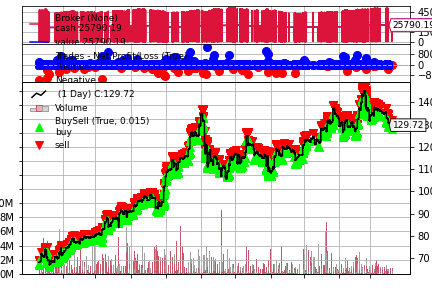

In [8]:
if __name__ == '__main__':
    conn = sqlite3.connect(config.DB_FILE)
    conn.row_factory = sqlite3.Row
    cursor = conn.cursor()
    cursor.execute("""
        SELECT DISTINCT(stock_id) as stock_id FROM stock_price_minute
    """)

    stocks = cursor.fetchall()

    # make this a variable that can be changed from app
    # TESTING for one stock and show plot #AAPL
    stocks = [{'stock_id': 9395}]
    # TESTING

    for stock in stocks:
        print(f"== Testing {stock['stock_id']} ==")

        cerebro = backtrader.Cerebro()
        # make this param a variable that can be changed from app
        cerebro.broker.setcash(25000.0)
        cerebro.addsizer(backtrader.sizers.PercentSizer, percents=95)

        dataframe = pd.read_sql("""
            SELECT datetime, open, high, low, close, volume
            FROM stock_price_minute
            WHERE stock_id = :stock_id
            AND strftime('%H:%M:%S', datetime) >= '09:30:00'
            AND strftime('%H:%M:%S', datetime) >= '16:00:00'
            ORDER BY datetime ASC
        """, conn, params={"stock_id": stock['stock_id']}, index_col='datetime', parse_dates=['datetime'])

        data = backtrader.feeds.PandasData(dataname=dataframe)

        cerebro.adddata(data)
        cerebro.addstrategy(OpeningRangeBreakout)

        # strats = cerebro.optstrategy(OpeningRangeBreakout, num_opening_bars=[15, 30, 60])

        cerebro.run()
        cerebro.plot()

In [12]:
%matplotlib inline